In [1]:
# import libraries
import numpy as np
import awkward as ak
import pandas as pd 
import os, h5py
import matplotlib.pyplot as plt
import matplotlib as mpl
import warnings
warnings.filterwarnings("ignore")
from scipy import stats
from jason import jason_plotting as plotting
mpl.rcParams.update(mpl.rcParamsDefault)
plt.style.use('/Users/jasonwu/Programs/codes/def.mplstyle')
plotting.plot_prettier(dpi=400,usetex=False)
%matplotlib inline
import uproot

# Reading file

In [2]:
file = uproot.open("/Users/jasonwu/Programs/Fermilab/run_data/pfSamples_230801/pf/pf.ele_0p1_4GeV.10k.1part.7.15cm.root")

In [3]:
file.keys()

['LDMX_Events;3', 'LDMX_Events;2', 'LDMX_Run;1']

In [4]:
file['LDMX_Events'].keys()

['EventHeader',
 'EventHeader/eventNumber_',
 'EventHeader/run_',
 'EventHeader/timestamp_',
 'EventHeader/timestamp_/timestamp_.fSec',
 'EventHeader/timestamp_/timestamp_.fNanoSec',
 'EventHeader/weight_',
 'EventHeader/isRealData_',
 'EventHeader/intParameters_',
 'EventHeader/intParameters_/intParameters_.first',
 'EventHeader/intParameters_/intParameters_.second',
 'EventHeader/floatParameters_',
 'EventHeader/floatParameters_/floatParameters_.first',
 'EventHeader/floatParameters_/floatParameters_.second',
 'EventHeader/stringParameters_',
 'EventHeader/stringParameters_/stringParameters_.first',
 'EventHeader/stringParameters_/stringParameters_.second',
 'PFEcalClusters_pf',
 'PFEcalClusters_pf/PFEcalClusters_pf.hitIDs_',
 'PFEcalClusters_pf/PFEcalClusters_pf.energy_',
 'PFEcalClusters_pf/PFEcalClusters_pf.nHits_',
 'PFEcalClusters_pf/PFEcalClusters_pf.centroidX_',
 'PFEcalClusters_pf/PFEcalClusters_pf.centroidY_',
 'PFEcalClusters_pf/PFEcalClusters_pf.centroidZ_',
 'PFEcalCluste

In [5]:
file['LDMX_Events']['PFEcalClusters_pf/PFEcalClusters_pf.nHits_'].array(library='ak')

<Array [[53], [62], [35], ..., [6], [73, 1], [59]] type='10000 * var * int32'>

In [6]:
ps = ['PFTruth_pf/PFTruth_pf.first',
 'PFTruth_pf/PFTruth_pf.second.energy_',
 'PFTruth_pf/PFTruth_pf.second.pdgID_',
 'PFTruth_pf/PFTruth_pf.second.genStatus_',
 'PFTruth_pf/PFTruth_pf.second.time_',
 'PFTruth_pf/PFTruth_pf.second.x_',
 'PFTruth_pf/PFTruth_pf.second.y_',
 'PFTruth_pf/PFTruth_pf.second.z_',
 'PFTruth_pf/PFTruth_pf.second.endX_',
 'PFTruth_pf/PFTruth_pf.second.endY_',
 'PFTruth_pf/PFTruth_pf.second.endZ_',
 'PFTruth_pf/PFTruth_pf.second.px_',
 'PFTruth_pf/PFTruth_pf.second.py_',
 'PFTruth_pf/PFTruth_pf.second.pz_',
 'PFTruth_pf/PFTruth_pf.second.endpx_',
 'PFTruth_pf/PFTruth_pf.second.endpy_',
 'PFTruth_pf/PFTruth_pf.second.endpz_',
 'PFTruth_pf/PFTruth_pf.second.mass_',
 'PFTruth_pf/PFTruth_pf.second.charge_',
 'PFTruth_pf/PFTruth_pf.second.daughters_',
 'PFTruth_pf/PFTruth_pf.second.parents_',
 'PFTruth_pf/PFTruth_pf.second.processType_',
 'PFTruth_pf/PFTruth_pf.second.vertexVolume_']
for p in ps:
    prop = file['LDMX_Events'][p].array(library='ak')
    print(p, ak.any(ak.ravel(prop)))

PFTruth_pf/PFTruth_pf.first True
PFTruth_pf/PFTruth_pf.second.energy_ True
PFTruth_pf/PFTruth_pf.second.pdgID_ True
PFTruth_pf/PFTruth_pf.second.genStatus_ True
PFTruth_pf/PFTruth_pf.second.time_ False
PFTruth_pf/PFTruth_pf.second.x_ True
PFTruth_pf/PFTruth_pf.second.y_ True
PFTruth_pf/PFTruth_pf.second.z_ False
PFTruth_pf/PFTruth_pf.second.endX_ True
PFTruth_pf/PFTruth_pf.second.endY_ True
PFTruth_pf/PFTruth_pf.second.endZ_ True
PFTruth_pf/PFTruth_pf.second.px_ True
PFTruth_pf/PFTruth_pf.second.py_ True
PFTruth_pf/PFTruth_pf.second.pz_ True
PFTruth_pf/PFTruth_pf.second.endpx_ True
PFTruth_pf/PFTruth_pf.second.endpy_ True
PFTruth_pf/PFTruth_pf.second.endpz_ True
PFTruth_pf/PFTruth_pf.second.mass_ True
PFTruth_pf/PFTruth_pf.second.charge_ True
PFTruth_pf/PFTruth_pf.second.daughters_ True
PFTruth_pf/PFTruth_pf.second.parents_ False
PFTruth_pf/PFTruth_pf.second.processType_ False
PFTruth_pf/PFTruth_pf.second.vertexVolume_ [True, True, True, True, True, True, True]


In [7]:
p = "PFEcalClusters_pf/PFEcalClusters_pf.energy_"
test_prop = file['LDMX_Events'][p].array(library='ak')
for prop in test_prop:
    print(len(prop), prop)

1 [2.72e+03]
1 [2.96e+03]
1 [2.47e+03]
1 [530]
1 [521]
1 [3.24e+03]
1 [1.82e+03]
1 [540]
1 [2.34e+03]
1 [3.35e+03]
1 [3.12e+03]
1 [594]
1 [2.45e+03]
1 [2.28e+03]
1 [2.06e+03]
1 [3.01e+03]
2 [2.64e+03, 34.9]
1 [3.43e+03]
1 [3.52e+03]
1 [279]
1 [818]
2 [1.17e+03, 85.1]
1 [2.58e+03]
2 [2.85e+03, 41.4]
1 [3.75e+03]
1 [1.56e+03]
3 [2.62e+03, 18.9, 8.87]
1 [2.83e+03]
2 [857, 81.6]
1 [3.01e+03]
1 [1.51e+03]
1 [306]
1 [308]
1 [216]
1 [952]
1 [377]
1 [1.2e+03]
2 [4.11e+03, 10]
2 [2.62e+03, 866]
1 [694]
1 [482]
1 [3.51e+03]
1 [697]
1 [448]
1 [3.84e+03]
1 [3.26e+03]
1 [3.42e+03]
1 [3.84e+03]
1 [1.13e+03]
1 [3.15e+03]
1 [1.86e+03]
1 [1.06e+03]
2 [4.44e+03, 77.4]
1 [3.5e+03]
1 [1.79e+03]
1 [3.06e+03]
1 [2.72e+03]
2 [1.18e+03, 54.4]
3 [4.51e+03, 59.1, 8.28]
1 [1.09e+03]
1 [1.12e+03]
1 [1.81e+03]
1 [2.85e+03]
1 [2.07e+03]
2 [4.27e+03, 12.4]
1 [1.13e+03]
1 [3.62e+03]
2 [575, 46.1]
1 [2.57e+03]
2 [3.35e+03, 29.9]
1 [1.38e+03]
1 [3.45e+03]
1 [1.12e+03]
2 [2.83e+03, 17.7]
1 [1.19e+03]
1 [2.2e+03]
2 [250,

In [8]:
mask = ak.argmax(test_prop, axis=1, keepdims=True, mask_identity=True)
mask

<Array [[0], [0], [0], [0], ..., [0], [0], [0], [0]] type='10000 * 1 * ?int64'>

## Systematically reading the file

In [9]:
def get_data(file_name = 'pf.ele_0p1_4GeV.10k.1part.7.15cm.root',
             root_trial = 'pfSamples_230801',
             root_dir = '/Users/jasonwu/Programs/Fermilab/run_data',
             # the branches to include in the output
             included_branches = ['PFEcalClusters_pf', 'PFHcalClusters_pf', 'PFTracks_pf', 'PFCandidates_pf', 'PFTruth_pf', 'PFTruthTarget_pf', 'PFTruthEcal_pf', 'PFTruthHcal_pf'],
             # the branches to save directly
             saved_branches = ['EcalTotalEnergy_pf', 'HcalTotalEnergy_pf', 'PFTruth_pf/PFTruth_pf.second.vertexVolume_'],
             # if True, generates leading cluster properties
             lead_clust = False,
             # the branches to do leading cluster on
             lead_clust_branches = ['PFEcalClusters_pf', 'PFHcalClusters_pf'],
             lead_clust_override = False,
             # if True, prints type and number of points in each property
             verbose = False):
    file = uproot.open(f'{root_dir}/{root_trial}/pf/{file_name}')
    events = file['LDMX_Events']
    # all the keys in events
    keys = np.array(events.keys())
    save_mask = np.array([1 if (branch in saved_branches) else 0 for branch in keys]).astype(bool)
    keys = np.delete(keys, save_mask)
    # branches
    branch_mask = np.array([0 if ('/' in branch) else 1 for branch in keys]).astype(bool)
    branches = keys[branch_mask]
    branch_ind = np.append(np.where(branch_mask == 1)[0], -1)
                 
    if lead_clust_override:
        suffix_new = ''
        suffix_og = '_og'
    else:
        suffix_new = '_lc'
        suffix_og = ''
                 
    prop_dict = {}


    # save the branches directly
    for branch in saved_branches:  # check if within directly saved branch
        if verbose: print(f'{branch} is saved directly')
        saved_prop = np.array(events[branch])
        prop_dict[branch.replace('_pf', '')] = saved_prop
        
    for i in range(len(branches)):
        branch = branches[i]
        if branch in included_branches:  # check if within included branch
            if verbose: print(f'{branch} is included')
            # get all the nodes of the branch
            branch_nodes = keys[branch_ind[i]+1:] if branch_ind[i+1] == -1 else keys[branch_ind[i]+1 : branch_ind[i+1]]
            if verbose: print(branch_nodes)

            # get the energy indices for leading cluster anlaysis
            if lead_clust and (branch in lead_clust_branches):
                energy_node = f'{branch}/{branch}.energy_'  # string of the energy node
                # the awkward array corresponding to energy
                energy_prop = events[energy_node].array(library='ak')
                energy_prop = ak.values_astype(energy_prop, np.float64)
                # the indices corresponding to maximum energy (in case unsorted)
                max_ind = ak.argmax(energy_prop, axis=1, keepdims=True, mask_identity=True)
                
            # for each node in the branch
            for branch_node in branch_nodes:
                # make the awkward array
                prop = events[branch_node].array(library='ak')
                # pad the array with at least one entry
                prop = ak.pad_none(prop, 1, axis=1)

                # check if consisting of empty arrays
                if len(ak.ravel(prop)) == 0 or not ak.any(ak.ravel(prop)):  # effectively empty
                    # flatten the array into zeros
                    if verbose: print(f'Empty array at {branch_node}, reduced to zeroes')
                    prop_flat = np.zeros(len(prop))
                    if verbose: print(prop_flat.shape)

                    prop_dict[branch_node.split('/')[1].replace('_pf', '')[:-1].replace('.', '_')] = prop_flat
                elif len(ak.ravel(prop)) == len(prop):  # effectively one-dimensional
                    if verbose: print(f'One-dimensional array at {branch_node}, reduced to numpy')
                    prop_flat = ak.to_numpy(ak.ravel(prop), allow_missing=True).astype(float).filled(np.nan)
                    if verbose: print(prop_flat.shape)

                    prop_dict[branch_node.split('/')[1].replace('_pf', '')[:-1].replace('.', '_')] = prop_flat
                else:
                    # if the array is truly jagged
                    if verbose: print(f'Jagged/partially empty array at {branch_node}')
                    prop_flat = prop
                    if verbose: print(prop_flat.type)

                    # construct a leading cluster array
                    if lead_clust and (branch in lead_clust_branches):
                        # mask the array with max energy indices
                        max_prop = prop_flat[ak.from_regular(max_ind)]
                        # flatten, convert to numpy array, and fill with nan
                        # handles hit info
                        if 'hit' in branch_node:
                            # unravel max_prop
                            max_prop = ak.Array([np.array(_[0]) for _ in max_prop])
                            prop_dict[branch_node.split('/')[1].replace('_pf', '')[:-1].replace('.', '_') + suffix_new] = max_prop  # take out into lc data
                            prop_dict[branch_node.split('/')[1].replace('_pf', '')[:-1].replace('.', '_') + suffix_og] = prop_flat
                        else:
                            max_prop_flat = ak.to_numpy(ak.ravel(max_prop), allow_missing=True).astype(float)
                            max_prop_flat = max_prop_flat.filled(np.nan)
                            prop_dict[branch_node.split('/')[1].replace('_pf', '')[:-1].replace('.', '_') + suffix_new] = max_prop_flat  # lc data
                            prop_dict[branch_node.split('/')[1].replace('_pf', '')[:-1].replace('.', '_') + suffix_og] = prop_flat
                    else:  # no leading cluster array
                        prop_dict[branch_node.split('/')[1].replace('_pf', '')[:-1].replace('.', '_')] = prop_flat

        else:
            if verbose: print(f'{branch} is not included')
    return prop_dict

In [10]:
root_trial = 'pfSamples_230801'
test_part = get_data(file_name='pf.ele_0p1_4GeV.10k.1part.7.15cm.root', root_trial=root_trial,
                     lead_clust=True, lead_clust_branches=['PFEcalClusters_pf'], lead_clust_override=False)
list(test_part.keys())

['EcalTotalEnergy',
 'HcalTotalEnergy',
 'PFTruth/PFTruth.second.vertexVolume_',
 'PFEcalClusters_hitIDs',
 'PFEcalClusters_energy_lc',
 'PFEcalClusters_energy',
 'PFEcalClusters_nHits_lc',
 'PFEcalClusters_nHits',
 'PFEcalClusters_centroidX_lc',
 'PFEcalClusters_centroidX',
 'PFEcalClusters_centroidY_lc',
 'PFEcalClusters_centroidY',
 'PFEcalClusters_centroidZ_lc',
 'PFEcalClusters_centroidZ',
 'PFEcalClusters_rmsX_lc',
 'PFEcalClusters_rmsX',
 'PFEcalClusters_rmsY_lc',
 'PFEcalClusters_rmsY',
 'PFEcalClusters_rmsZ_lc',
 'PFEcalClusters_rmsZ',
 'PFEcalClusters_DXDZ',
 'PFEcalClusters_DYDZ',
 'PFEcalClusters_errDXDZ',
 'PFEcalClusters_errDYDZ',
 'PFEcalClusters_hitX_lc',
 'PFEcalClusters_hitX',
 'PFEcalClusters_hitY_lc',
 'PFEcalClusters_hitY',
 'PFEcalClusters_hitZ_lc',
 'PFEcalClusters_hitZ',
 'PFEcalClusters_hitE_lc',
 'PFEcalClusters_hitE',
 'PFHcalClusters_hitIDs',
 'PFHcalClusters_energy',
 'PFHcalClusters_nHits',
 'PFHcalClusters_centroidX',
 'PFHcalClusters_centroidY',
 'PFHcal

In [11]:
np.sum(ak.all(np.hypot(test_part['PFTruthEcal_x'], test_part['PFTruthEcal_y']) < 200, axis=1))

9696

# Load Particles

In [12]:
labels_keys = 'electrons neutrons photons pions protons electrons_hcal neutrons_hcal photons_hcal pions_hcal protons_hcal'.split(' ')
labels_values = [
    r'Electrons $e^{\minus}$',
    r'Neutrons $n^{o}$',
    r'Photons $\gamma$',
    r'Pions $\pi^{\minus}$',
    r'Protons $p^{\plus}$',
    r'Electrons $e^{\minus}$ HCal',
    r'Neutrons $n^{o}$ HCal',
    r'Photons $\gamma$ HCal',
    r'Pions $\pi^{\minus}$ HCal',
    r'Protons $p^{\plus}$ HCal'
]

labels_dict = {labels_keys[i]: labels_values[i] for i in range(len(labels_keys))}

## Particles Class

In [13]:
# initiate a particle class
class Particles():
    def __init__(self, prop_dict):
        # a list of properties
        self.propdict = prop_dict
        self._clean_props()
    
    # clean the data set
    def _clean_props(self):
        # also replace dictionary labels
        self.propdict['PFCandidates_ecalCalEnergy'] = self.propdict.pop('PFCandidates_ecalEnergy')
        self.propdict['PFCandidates_ecalEnergy'] = self.propdict.pop('PFCandidates_ecalRawEnergy')
        self.propdict['PFCandidates_hcalCalEnergy'] = self.propdict.pop('PFCandidates_hcalEnergy')
        self.propdict['PFCandidates_hcalEnergy'] = self.propdict.pop('PFCandidates_hcalRawEnergy')
    
    # return a property
    def get(self, prop = None):
        if prop is not None:  # if specific property(ies) are given
            if isinstance(prop, list):
                prop_list = []
                for single_prop in prop:
                    prop_list.append(self.propdict[single_prop])
                return prop_list
            else:
                assert prop in list(self.propdict.keys())
                return self.propdict[prop]
        else:
            return self.propdict
    
    # account for mass of particle
    def acc_mass(self, mass, columns=[]):
        # subtract mass
        for column in columns:
            # clipped to zero
            # therefore, 0 -> 0, mass + energy -> energy
            data = self.propdict[column]
            if isinstance(data, ak.Array):  # preserve shape
                shape = ak.num(data)
                data = ak.to_numpy(ak.flatten(data))  # flatten the data
                clipped_data = np.clip(data - mass, 0, None)
                clipped_data = ak.unflatten(clipped_data, shape)  # return to shape
                self.propdict[column] = clipped_data
            else:
                self.propdict[column] = np.clip(data - mass, 0, None)
    
    # return a list of all properties
    def list_props(self):        
        print(f'{"Property Name":<30}{"Number of Entries":<20}{"Unique Entries":<20}{"Range":<30}{"Mean"}')
        
        for prop in list(self.propdict.keys()):
            print(f'{prop: <30}{len(self.propdict[prop]):<20}{len(np.unique(self.propdict[prop])):<8}\
            {np.nanmin(self.propdict[prop]):<10.2f}{np.nanmax(self.propdict[prop]):>8.2f}\
            {np.nanmean(self.propdict[prop]):<.2f}')
        print('\n')
        return list(self.propdict.keys())
    
    # apply a correction to the ecal and hcal energy measurements
    def o1corr_energy(self, scheme='nearest',  # three schemes 'none', 'nearest' and 'spline'
                      energy_bins_ecal=[0, 6e3], o1corr_bins_ecal=[1],  # the bins and correction coefficients
                      energy_bins_hcal=[0, 6e3], o1corr_bins_hcal=[1],
                      ecal_labels=['EcalTotalEnergy', 'PFCandidates_ecalEnergy', 'PFEcalClusters_energy', 'PFEcalClusters_energy_lc'],
                      ecal_labels_map=['EcalTotalEnergy_corr', 'PFCandidates_ecalEnergy_corr', 'PFEcalClusters_energy_corr', 'PFEcalClusters_energy_lc_corr'],
                      hcal_labels=['HcalTotalEnergy', 'PFCandidates_hcalEnergy', 'PFHcalClusters_energy', 'PFHcalClusters_energy_lc'],
                      hcal_labels_map=['HcalTotalEnergy_corr', 'PFCandidates_hcalEnergy_corr', 'PFHcalClusters_energy_corr', 'PFHcalClusters_energy_lc_corr']):
        # correct the energies
        def get_corr(ecal_label=None, hcal_label=None):
            match scheme:  # different schemes to handle values outside of measured bins
                case 'none':  # set to NaN, breaks plots
                    def cut(data, bins=[0, 1e3], include_lowest=True, labels=[0]):
                        if isinstance(data, ak.Array):  # preserve shape
                            shape = ak.num(data)
                            data = ak.flatten(data)  # flatten the data
                            indices = np.digitize(data, bins=bins, right=True)
                            labels = np.hstack([np.nan, labels, np.nan])
                            binned_labels = np.array([labels[index] for index in indices])
                            binned_labels = ak.unflatten(binned_labels, shape)  # return to shape
                        else:  # regular array operation
                            indices = np.digitize(data, bins=bins, right=True)
                            labels = np.hstack([np.nan, labels, np.nan])
                            binned_labels = np.array([labels[index] for index in indices])
                        return binned_labels
                    # ecal
                    if ecal_label: o1corr_ecal = cut(self.get(ecal_label), bins=energy_bins_ecal, labels=o1corr_bins_ecal)
                    # hcal
                    if hcal_label: o1corr_hcal = cut(self.get(hcal_label), bins=energy_bins_hcal, labels=o1corr_bins_hcal)
                case 'nearest':  # sets to value of nearest bin
                    def nearest_cut(data, bins=[0, 6e3], labels=[1]):
                        if isinstance(data, ak.Array):  # preserve shape
                            shape = ak.num(data)
                            data = ak.to_numpy(ak.flatten(data))  # flatten the data
                            # assigns labels to data based on bins
                            label_ind = np.digitize(data, bins=bins, right=True)
                            # contains 0 and len(labels)
                            label_ind[label_ind == 0] = 1  # label_ind will start at 1
                            label_ind[label_ind == len(bins)] = len(labels)  # set to maximum ind
                            nearest_coeff = labels[label_ind - 1]
                            nearest_coeff = ak.unflatten(nearest_coeff, shape)  # return to shape
                        else:
                            # assigns labels to data based on bins
                            label_ind = np.digitize(data, bins=bins, right=True)
                            # contains 0 and len(labels)
                            label_ind[label_ind == 0] = 1  # label_ind will start at 1
                            label_ind[label_ind == len(bins)] = len(labels)  # set to maximum ind
                            nearest_coeff = labels[label_ind - 1]
                        return nearest_coeff
                    # ecal
                    if ecal_label: o1corr_ecal = nearest_cut(self.get(ecal_label), bins=energy_bins_ecal, labels=o1corr_bins_ecal)
                    # hcal
                    if hcal_label: o1corr_hcal = nearest_cut(self.get(hcal_label), bins=energy_bins_hcal, labels=o1corr_bins_hcal)
                case 'spline':
                    def spline_cut(data, bins=[0, 6e3], labels=[1]):
                        if isinstance(data, ak.Array):  # preserve shape
                            shape = ak.num(data)
                            data = ak.flatten(data)  # flatten the data
                            # construct spline object for bin centers
                            bin_centers = [(a + b) / 2 for a, b in zip(bins[::], bins[1::])] # average of two consecutive elements in bins
                            # calculate splined values for data
                            splined_coeff, _ = plotting.spline_xy(bin_centers, labels, data)
                            splined_coeff = ak.unflatten(splined_coeff, shape)  # return to shape
                        else:
                            # construct spline object for bin centers
                            bin_centers = [(a + b) / 2 for a, b in zip(bins[::], bins[1::])] # average of two consecutive elements in bins
                            # calculate splined values for data
                            splined_coeff, _ = plotting.spline_xy(bin_centers, labels, data)
                        return splined_coeff
                        
                    # ecal
                    if ecal_label: o1corr_ecal = spline_cut(self.get(ecal_label), bins=energy_bins_ecal, labels=o1corr_bins_ecal)
                    # hcal
                    if hcal_label: o1corr_hcal = spline_cut(self.get(hcal_label), bins=energy_bins_hcal, labels=o1corr_bins_hcal)
                
            if ecal_label:
                energy_o1corr_ecal = self.get(ecal_label) * o1corr_ecal
                return energy_o1corr_ecal
            if hcal_label:
                energy_o1corr_hcal = self.get(hcal_label) * o1corr_hcal
                return energy_o1corr_hcal

        # loop through all entries in labels list
        for ecal_label, ecal_label_map in zip(ecal_labels, ecal_labels_map):  # ecal correction
            energy_o1corr_ecal = get_corr(ecal_label=ecal_label)
            self.propdict[ecal_label_map] = energy_o1corr_ecal
        for hcal_label, hcal_label_map in zip(hcal_labels, hcal_labels_map):  # hcal correction
            energy_o1corr_hcal = get_corr(hcal_label=hcal_label)
            self.propdict[hcal_label_map] = energy_o1corr_hcal

In [14]:
import os

# all branches
included_branches = ['PFEcalClusters_pf', 'PFHcalClusters_pf', 'PFTracks_pf', 'PFCandidates_pf', 'PFTruthTarget_pf', 'PFTruthEcal_pf', 'PFTruthHcal_pf']
root_dir = '/Users/jasonwu/Programs/Fermilab/run_data'
root_trial = 'pfSamples_230801'

fname_list_full = np.sort(os.listdir(f'{root_dir}/{root_trial}/pf_no_corrtrack'))
fname_list = []
for fname in fname_list_full:
    if '.root' in fname:
        fname_list.append(fname)
fname_list

['pf.ele_0p1_4GeV.10k.1part.7.15cm.root',
 'pf.neu_0p1_4GeV.10k.1part.7.15cm.root',
 'pf.pho_0p1_4GeV.10k.1part.7.15cm.root',
 'pf.piM_0p1_4GeV.10k.1part.7.15cm.root',
 'pf.pro_0p1_4GeV.10k.1part.7.15cm.root']

In [15]:
# ECal + HCal particles
particles_dict = {
    'electrons': None,
    'neutrons': None,
    'photons': None,
    'pions': None,
    'protons': None
}
particles_name_list = 'electrons neutrons photons pions protons'.split(' ')

## Process particles (RELOAD)

In [16]:
#––––––––––––––––––––––––––––––––––––––––––––––#
#––––––––––––––––––––RELOAD––––––––––––––––––––#
#––––––––––––––––––––––––––––––––––––––––––––––#

reload = True

In [17]:
if reload:
    # load the particles
    root_dir = '/Users/jasonwu/Programs/Fermilab/run_data'
    root_trial = 'pfSamples_230801'
    # all branches
    included_branches = ['PFEcalClusters_pf', 'PFHcalClusters_pf', 'PFTracks_pf', 'PFCandidates_pf', 'PFTruth_pf', 'PFTruthTarget_pf', 'PFTruthEcal_pf', 'PFTruthHcal_pf']
    target_ind = ['PFTruthTarget_energy', 'PFTruthEcal_energy']
    
    for i, part_name in enumerate(particles_name_list):
        # set particle
        print(f'Setting for {fname_list[i]}')
        particles_dict[part_name] = Particles(get_data(file_name=fname_list[i], root_trial=root_trial,
                                                       included_branches=included_branches,
                                                       lead_clust=True, lead_clust_branches=['PFEcalClusters_pf', 'PFHcalClusters_pf'],
                                                       lead_clust_override=False))

Setting for pf.ele_0p1_4GeV.10k.1part.7.15cm.root
Setting for pf.neu_0p1_4GeV.10k.1part.7.15cm.root
Setting for pf.pho_0p1_4GeV.10k.1part.7.15cm.root
Setting for pf.piM_0p1_4GeV.10k.1part.7.15cm.root
Setting for pf.pro_0p1_4GeV.10k.1part.7.15cm.root


# Mass Energy Correction

In [18]:
ele_energy_bins_ecal = np.array([0., 500., 1000., 1500., 2000., 2500., 3000., 3500., 4000., 4500., 5000., 5500., 6000.])
avg_o1corr_ecal = np.array([1.18987852, 1.02952459, 0.99478492, 0.98629969, 0.98273146, 0.9760755 , 0.96378225, 0.93880792, 0.87393644, 0.80097519, 0.72741938, 0.66352241])
ext_bins_hcal = np.array([0., 50., 100., 150., 200., 250., 300., 350., 400., 450., 500., 550., 600., 650.]) * 10
pe_o1corr_hcal = np.array([8.4280355 ,  7.37783051,  7.75777364,  8.53401804,  9.46895409, 10.44644213, 10.46670198,  9.70749855,  8.87022924,  8.25057888, 8.25057888,  8.25057888,  8.25057888])
scheme = 'spline'
style = 1

In [19]:
if reload:
    # define the particle mass [MeV]
    electron_mass = 0.511
    neutron_mass = 939.56
    photon_mass = 0
    pion_mass = 139.57
    proton_mass = 938.27
    
    mass_dict = {
        'electrons' : 0.511,
        'neutrons' : 939.56,
        'photons' : 0,
        'pions' : 139.57,
        'protons' : 938.27
    }
    
    # subtract rest mass from the total energies, leaving kinetic
    # do not include measured energies
    full_cols = 'PFTruthTarget_energy PFTruth_second_energy PFTruthEcal_energy PFTruthHcal_energy'.split(' ')
    
    # subtract the mass
    
    for particles in particles_name_list:
        print(f'Correcting for {particles}')
        particles_dict[particles].o1corr_energy(energy_bins_ecal=ele_energy_bins_ecal, o1corr_bins_ecal=avg_o1corr_ecal,
                                                energy_bins_hcal=ext_bins_hcal, o1corr_bins_hcal=pe_o1corr_hcal)
        particles_dict[particles].acc_mass(mass_dict[particles], columns=full_cols)

Correcting for electrons
Correcting for neutrons
Correcting for photons
Correcting for pions
Correcting for protons


# Count Statistics

In [20]:
def calc_stats(particles_dict=particles_dict, good_thres=[7, 7]):
    for particles in particles_name_list:  # for each particle
        """ECAL cluster count"""
        hits_count_ecal = {}
        clusters_count_ecal = []  # all clusters count
        good_clusters_count_ecal = []  # good cluster count
        for clusters_nhits_ecal in particles_dict[particles].get('PFEcalClusters_nHits'):
            if np.any(clusters_nhits_ecal):
                num_clusters_ecal = len(clusters_nhits_ecal)
                num_good_clusters_ecal = np.sum(clusters_nhits_ecal >= good_thres[0])  # select all above threshold
                good_clusters_count_ecal.append(num_good_clusters_ecal)
                clusters_count_ecal.append(num_clusters_ecal)
                try:
                    hits_count_ecal[num_clusters_ecal] = np.hstack([hits_count_ecal[num_clusters_ecal], clusters_nhits_ecal])
                except KeyError:
                    hits_count_ecal[num_clusters_ecal] = []
            else:
                good_clusters_count_ecal.append(0)  # no clusters
                clusters_count_ecal.append(0)
        # number of clusters
        particles_dict[particles].propdict['PFEcalClusters_hits_count'] = hits_count_ecal
        print(list(particles_dict[particles].get('PFEcalClusters_hits_count').keys()))
        # all clusters
        particles_dict[particles].propdict['PFEcalClusters_count'] = np.array(clusters_count_ecal)
        print(np.unique(particles_dict[particles].get('PFEcalClusters_count'), return_counts=True))
        # good clusters
        particles_dict[particles].propdict['PFEcalClusters_good_count'] = np.array(good_clusters_count_ecal)
        print(np.unique(particles_dict[particles].get('PFEcalClusters_good_count'), return_counts=True))

        # ecal cluster energy
        ecal_good_mask = (particles_dict[particles].get('PFEcalClusters_nHits') >= good_thres[0])
        particles_dict[particles].propdict['PFEcalClusters_good_mask'] = ecal_good_mask
        # all cluster energy in an event
        particles_dict[particles].propdict['PFEcalClusters_energy_sum_corr'] = [np.nansum(_) for _ in particles_dict[particles].get('PFEcalClusters_energy_corr')]
        # all GOOD cluster energy in an event
        particles_dict[particles].propdict['PFEcalClusters_energy_gc_corr'] = [np.nansum(_) for _ in particles_dict[particles].get('PFEcalClusters_energy_corr')[ecal_good_mask]]

        """HCAL cluster count"""
        hits_count_hcal = {}
        clusters_count_hcal = []  # all clusters count
        good_clusters_count_hcal = []  # good cluster count
        for clusters_nhits_hcal in particles_dict[particles].get('PFHcalClusters_nHits'):
            if np.any(clusters_nhits_hcal):
                num_clusters_hcal = len(clusters_nhits_hcal)
                num_good_clusters_hcal = np.sum(clusters_nhits_hcal >= good_thres[1])  # select all above threshold
                good_clusters_count_hcal.append(num_good_clusters_hcal)
                clusters_count_hcal.append(num_clusters_hcal)
                try:
                    hits_count_hcal[num_clusters_hcal] = np.hstack([hits_count_hcal[num_clusters_hcal], clusters_nhits_hcal])
                except KeyError:
                    hits_count_hcal[num_clusters_hcal] = []
            else:
                good_clusters_count_hcal.append(0)  # no clusters
                clusters_count_hcal.append(0)
        # number of clusters
        particles_dict[particles].propdict['PFHcalClusters_hits_count'] = hits_count_hcal
        print(list(particles_dict[particles].get('PFHcalClusters_hits_count').keys()))
        # all clusters
        particles_dict[particles].propdict['PFHcalClusters_count'] = np.array(clusters_count_hcal)
        print(np.unique(particles_dict[particles].get('PFHcalClusters_count'), return_counts=True))
        # good clusters
        particles_dict[particles].propdict['PFHcalClusters_good_count'] = np.array(good_clusters_count_hcal)
        print(np.unique(particles_dict[particles].get('PFHcalClusters_good_count'), return_counts=True))

        # hcal cluster energy
        hcal_good_mask = (particles_dict[particles].get('PFHcalClusters_nHits') >= good_thres[1])
        particles_dict[particles].propdict['PFHcalClusters_good_mask'] = hcal_good_mask
        # all cluster energy in an event
        particles_dict[particles].propdict['PFHcalClusters_energy_sum_corr'] = [np.nansum(_) for _ in particles_dict[particles].get('PFHcalClusters_energy_corr')]
        # all GOOD cluster energy in an event
        particles_dict[particles].propdict['PFHcalClusters_energy_gc_corr'] = [np.nansum(_) for _ in particles_dict[particles].get('PFHcalClusters_energy_corr')[hcal_good_mask]]

In [21]:
# the dictionary of minimum hits
# 7 hits for 7cm ecal
# 7 hits for 15cm hcal
if reload: calc_stats(particles_dict, good_thres=[7, 7])

[1, 2, 3, 4, 6, 5]
(array([0, 1, 2, 3, 4, 5, 6]), array([  97, 7019, 2331,  482,   61,    9,    1]))
(array([0, 1, 2]), array([ 294, 9694,   12]))
[3, 4, 1, 2, 5, 7, 6]
(array([0, 1, 2, 3, 4, 5, 6, 7]), array([7702, 1243,  523,  272,  162,   70,   17,   11]))
(array([0, 1, 2, 3]), array([9551,  374,   70,    5]))
[1, 5, 2, 3, 4, 6]
(array([0, 1, 2, 3, 4, 5, 6]), array([2964, 4502, 1845,  518,  141,   28,    2]))
(array([0, 1, 2, 3]), array([4524, 5220,  249,    7]))
[5, 7, 1, 6, 2, 10, 3, 4, 9, 8, 12, 11, 13, 14, 17, 16, 15]
(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17]), array([1453, 1443, 1470, 1388, 1238,  992,  725,  525,  342,  182,  113,
         58,   41,   18,    6,    4,    1,    1]))
(array([0, 1, 2, 3, 4, 5]), array([5897, 3343,  662,   93,    4,    1]))
[1, 2, 3, 5, 4]
(array([0, 1, 2, 3, 4, 5]), array([ 150, 7043, 2284,  468,   46,    9]))
(array([0, 1, 2]), array([ 506, 9471,   23]))
[1, 3, 7, 2, 4, 6, 5, 8, 14, 9]
(array([ 0,  1, 

In [22]:
if reload: list(particles_dict['electrons'].propdict.keys())

## Pickle

In [23]:
if reload:
    import pickle
    
    # dump the particles into pickle files
    for file_name, particles in particles_dict.items():
        file = open(f"data/pickles_230814/{file_name}.pkl", "wb")
        pickle.dump(particles, file)
        file.close()

## Unpickle

In [24]:
if reload == False:  # load the existing pickle file
    import pickle
    
    # dump the particles into pickle files
    for file_name in particles_dict.keys():
        with open(f"data/pickles_230814/{file_name}.pkl", 'rb') as handle:
            data = handle.read()
        particles_dict[file_name] = pickle.loads(data)

# Spatial Distributions

In [25]:
# global variables
ECALZ_MIN = 247.9
ECALZ_MAX = 749.1
ECALW = 520

BHCALZ_MIN = 879
SHCALZ_MIN = 240
SHCALZ_MAX = 800
SHCALX_MIN = 500
SHCALX_MAX = 1500

# the style used for the confidence range plots
# 0: area
# 1: error bars
style = 1

def plot_box(ax, label=False):
    box_label = 'ECal' if label else ''
    ax.add_patch(plt.Rectangle((ECALZ_MIN, -ECALW/2), ECALZ_MAX - ECALZ_MIN, ECALW, fc=(0, 0, 0, 0), ec='red', label=box_label))
    
def plot_hcal_box(ax, label=False):
    box_label = 'HCal' if label else ''
    ax.add_patch(plt.Rectangle((SHCALZ_MIN, SHCALX_MIN), SHCALZ_MAX - SHCALZ_MIN, SHCALX_MAX - SHCALX_MIN, fc=(0, 0, 0, 0), ec='red', label=box_label))
    ax.add_patch(plt.Rectangle((SHCALZ_MIN, -SHCALX_MAX), SHCALZ_MAX - SHCALZ_MIN, SHCALX_MAX - SHCALX_MIN, fc=(0, 0, 0, 0), ec='red', label=box_label))
    ax.axvline(x=BHCALZ_MIN, lw=1, ls='--', color='red', label=box_label)

# plot the cluster distribution
def plot_cluster_dist(particles_dict=particles_dict, min_sep=[7, 15], spec_part=None, ipart=None, # particle parameters
                      factor=10, length=50, hit_size=0.5, extend=False, xlim=3000, ylim=1000, # line parameters
                      plot_track=True, plot_ecal=True, plot_hcal=True, plot_energy=False, angle_label=True, # plotting booleans
                      cmap='tab20', track_color='black', color='slateblue', hcal_color='orange'):  # color parameters
    from matplotlib.patches import Polygon
    from matplotlib import cm
    # for each particle
    for particles_name in particles_name_list:
        if spec_part and particles_name not in spec_part:
            continue
        # get parameters
        particles = particles_dict[particles_name]
        cluster_count = particles.get('PFEcalClusters_good_count')
        track_Pz = particles.get('PFCandidates_trackPz')
        track_Px = particles.get('PFCandidates_trackPx')
        track_posX = particles.get('PFCandidates_posEcalX')
        ecal_clusterZ = particles.get('PFEcalClusters_centroidZ')
        ecal_clusterX = particles.get('PFEcalClusters_centroidX')
        ecal_clusterEZ = particles.get('PFEcalClusters_rmsZ')
        ecal_clusterEX = particles.get('PFEcalClusters_rmsX')
        ecal_clusterDXDZ = particles.get('PFEcalClusters_DXDZ')
        hcal_clusterZ = particles.get('PFHcalClusters_centroidZ')
        hcal_clusterX = particles.get('PFHcalClusters_centroidX')
        hcal_clusterEZ = particles.get('PFHcalClusters_rmsZ')
        hcal_clusterEX = particles.get('PFHcalClusters_rmsX')
        hcal_clusterDXDZ = particles.get('PFHcalClusters_DXDZ')

        if plot_ecal:
            ecal_hitsX = particles.get('PFEcalClusters_hitX')
            ecal_hitsY = particles.get('PFEcalClusters_hitY')
            ecal_hitsZ = particles.get('PFEcalClusters_hitZ')
        if plot_hcal:
            hcal_hitsX = particles.get('PFHcalClusters_hitX')
            hcal_hitsY = particles.get('PFHcalClusters_hitY')
            hcal_hitsZ = particles.get('PFHcalClusters_hitZ')
        
        # get the index of max number of clusters
        if not ipart:
            ipart = np.argmax(cluster_count)

        print(f'# of clust: {cluster_count[ipart]}')
        print(f'# particle: {ipart}')
        
        # setting up plot
        fig, ax = plt.subplots(figsize=(5, 5), dpi=200)
        full_cmap = cm.get_cmap(cmap)
        color_list = [full_cmap(i)[:3] for i in range(full_cmap.N)]*10

        """Track Momentum"""
        if plot_track:
            if ak.any(track_Pz):
                # add triangle
                Pz = track_Pz[ipart][0]/factor
                Px = track_Px[ipart][0]/factor
                xy = [[ECALZ_MIN, track_posX[ipart][0]], [ECALZ_MIN+Pz, track_posX[ipart][0]], [ECALZ_MIN+Pz, track_posX[ipart][0]+Px]]
                momentum = Polygon(xy=xy, fc='None', ec=track_color, ls='--', label='Track')
                ax.add_patch(momentum)
                # add annotation
                track_angle = np.rad2deg(np.arctan(Px/Pz))
                ax.text(ECALZ_MIN+Pz/2, ECALW/2+20, fr'Track {track_angle:.2f} $\deg$', color=track_color, ha='center')
                # extend
                if extend:
                    ax.axline(xy1=[ECALZ_MIN, track_posX[ipart][0]], xy2=[ECALZ_MIN + Pz * 10, track_posX[ipart][0] + Px * 10], lw=1, ls='--', alpha=0.5, color=track_color)
        
        """Ecal Box"""
        if plot_ecal:
            # clusters
            ecal_z = ecal_clusterZ[ipart]
            ecal_x = ecal_clusterX[ipart]
            ecal_ez = ecal_clusterEZ[ipart]
            ecal_ex = ecal_clusterEX[ipart]
            ecal_tan = ecal_clusterDXDZ[ipart]
            # hits
            ecal_hx = ecal_hitsX[ipart]
            ecal_hy = ecal_hitsY[ipart]
            ecal_hz = ecal_hitsZ[ipart]
                
            # plot the hits
            markers = ['.', 'o', 'v', '^', '<', '>', '8', 's', 'p', 'h', 'H', 'D', 'd', 'P'] * 10
            i = 0
            for ecal_hx, ecal_hy, ecal_hz, ecal_hits_erg in zip(ecal_hx, ecal_hy, ecal_hz,
                                                                particles.get('PFEcalClusters_hitE')[ipart]):
                ecal_hits_erg = 0 if ecal_hits_erg is None else ecal_hits_erg
                ax.scatter(x=ecal_hz, y=ecal_hx, s=ecal_hits_erg * hit_size, c=color_list[i], alpha=0.8, lw=1, marker=markers[i])
                i += 1
            
            # check for multiple clusters
            if np.isscalar(ecal_z):
                ecal_z = [ecal_z]
                ecal_x = [ecal_x]
                ecal_ez = [ecal_ez]
                ecal_ex = [ecal_ex]
            if isinstance(ecal_clusterDXDZ, np.ndarray):
                ecal_tan = [ecal_tan]

            i = 0
            for ecal_z, ecal_x, ecal_ez, ecal_ex, ecal_tan in zip(ecal_z, ecal_x, ecal_ez, ecal_ex, ecal_tan):
                [ecal_z, ecal_x, ecal_ez, ecal_ex, ecal_tan] = [0 if not _ else _ for _ in [ecal_z, ecal_x, ecal_ez, ecal_ex, ecal_tan]]
                ax.errorbar(x=ecal_z, y=ecal_x, xerr=[[ecal_ez], [ecal_ez]], yerr=[[ecal_ex], [ecal_ex]], color=color_list[i], elinewidth=1, fmt='-', label='ECal Cluster')
                # the angle
                ecal_angle = np.rad2deg(np.arctan(ecal_tan))
                if abs(ecal_angle) > 5:
                    ax.plot([ecal_z+ecal_ez, ecal_z-ecal_ez], [ecal_x+ecal_tan*ecal_ez, ecal_x-ecal_tan*ecal_ez], color=color_list[i], lw=1, ls='--', alpha=0.8)
                    if angle_label:
                        ax.text(ecal_z, -ylim, f'{ecal_angle:.2f}', color=color_list[i], ha='center')
                    # extend
                    if extend:
                        ax.axline(xy1=[ecal_z, ecal_x], xy2=[ecal_z + length * 10, ecal_x + length * 10 * ecal_tan], lw=1, ls='--', alpha=0.5, color=color_list[i])
                i += 1
        
        """Hcal Box"""
        if plot_hcal:
            hcal_z = hcal_clusterZ[ipart]
            hcal_x = hcal_clusterX[ipart]
            hcal_ez = hcal_clusterEZ[ipart]
            hcal_ex = hcal_clusterEX[ipart]
            hcal_tan = hcal_clusterDXDZ[ipart]

            hcal_hx = hcal_hitsX[ipart]
            hcal_hy = hcal_hitsY[ipart]
            hcal_hz = hcal_hitsZ[ipart]
            
            # plot the hits
            markers = ['.', 'o', 'v', '^', '<', '>', '8', 's', 'p', 'h', 'H', 'D', 'd', 'P'] * 10
            i = 0
            for hcal_hx, hcal_hy, hcal_hz, hcal_hits_erg in zip(hcal_hx, hcal_hy, hcal_hz,
                                                                particles.get('PFHcalClusters_hitE')[ipart]):
                hcal_hits_erg = 0 if hcal_hits_erg is None else hcal_hits_erg
                ax.scatter(x=hcal_hz, y=hcal_hx, s=hcal_hits_erg * hit_size, c=color_list[i], alpha=0.8, lw=1, marker=markers[i])
                i += 1
            
            # check for multiple clusters
            if np.isscalar(hcal_z):
                hcal_z = [hcal_z]
                hcal_x = [hcal_x]
                hcal_ez = [hcal_ez]
                hcal_ex = [hcal_ex]
            if isinstance(hcal_clusterDXDZ, np.ndarray):
                hcal_tan = [hcal_tan]

            i = 0
            for hcal_z, hcal_x, hcal_ez, hcal_ex, hcal_tan in zip(hcal_z, hcal_x, hcal_ez, hcal_ex, hcal_tan):
                [hcal_z, hcal_x, hcal_ez, hcal_ex, hcal_tan] = [0 if not _ else _ for _ in [hcal_z, hcal_x, hcal_ez, hcal_ex, hcal_tan]]
                ax.errorbar(x=hcal_z, y=hcal_x, xerr=[[hcal_ez], [hcal_ez]], yerr=[[hcal_ex], [hcal_ex]], color=color_list[i], elinewidth=1, fmt='-', label='HCal Cluster')
                # the angle
                hcal_angle = np.rad2deg(np.arctan(hcal_tan))
                if abs(hcal_angle) > 5:
                    ax.plot([hcal_z+hcal_ez, hcal_z-hcal_ez], [hcal_x+hcal_tan*hcal_ez, hcal_x-hcal_tan*hcal_ez], color=color_list[i], lw=1, ls='--', alpha=0.8)
                    if angle_label:
                        ax.text(hcal_z, -ylim, f'{hcal_angle:.2f}', color=color_list[i], ha='center')
                    # extend
                    if extend:
                        ax.axline(xy1=[hcal_z, hcal_x], xy2=[hcal_z + length * 10, hcal_x + length * 10 * hcal_tan], lw=1, ls='--', alpha=0.5, color=color_list[i])
                i += 1
    
        """Energy"""
        if plot_energy:
            measure_energy = particles.get("PFCandidates_ecalEnergy")[ipart]
            measure_hcal_energy = particles.get("PFCandidates_hcalEnergy")[ipart]
            recon_energy = particles.get("PFCandidates_ecalEnergy_corr")[ipart]
            recon_hcal_energy = particles.get("PFCandidates_hcalEnergy_corr")[ipart]
            truth_energy = particles.get("PFTruthEcal_energy")[ipart]
            truth_hcal_energy = particles.get("PFTruthHcal_energy")[ipart]
            energy_text_x = 1490
            # ax.text(energy_text_x, -450, f'Ecal {measure_energy:.2f} MeV', ha='right')
            # ax.text(energy_text_x, -550, f'Hcal {measure_hcal_energy:.2f} MeV', ha='right')
            ax.text(energy_text_x, -650, f'Ecal Recon {recon_energy:.2f} MeV', ha='right')
            ax.text(energy_text_x, -750, f'Hcal Recon {recon_hcal_energy:.2f} MeV', ha='right')
            ax.text(energy_text_x, -850, f'Ecal Truth {truth_energy:.2f} MeV', ha='right')
            ax.text(energy_text_x, -950, f'Hcal Truth {truth_hcal_energy:.2f} MeV', ha='right')

        # axis
        ax.set_xlabel('Detector z')
        ax.set_ylabel('Detector x')
        ax.set_xlim(200, xlim)
        ax.set_ylim(-ylim, ylim)
            
        # boxes
        plot_box(ax, 0)
        plot_hcal_box(ax, 0)
        ax.annotate(text=f'ECal {min_sep[0]}cm; HCal {min_sep[1]}cm', xy=(-40, -20), ha='left', xycoords='axes points', fontsize=8, weight='bold')
        ax.annotate(text=labels_dict[particles_name], xy=(-40, -30), ha='left', xycoords='axes points', fontsize=8, weight='bold')
        # plt.legend(fontsize=10)
        plt.show()

## Figures

For each particle type, the event with the most clusters is plotted first, followed by ten more randomly selected events:

### Photons

# of clust: 2
# particle: 402


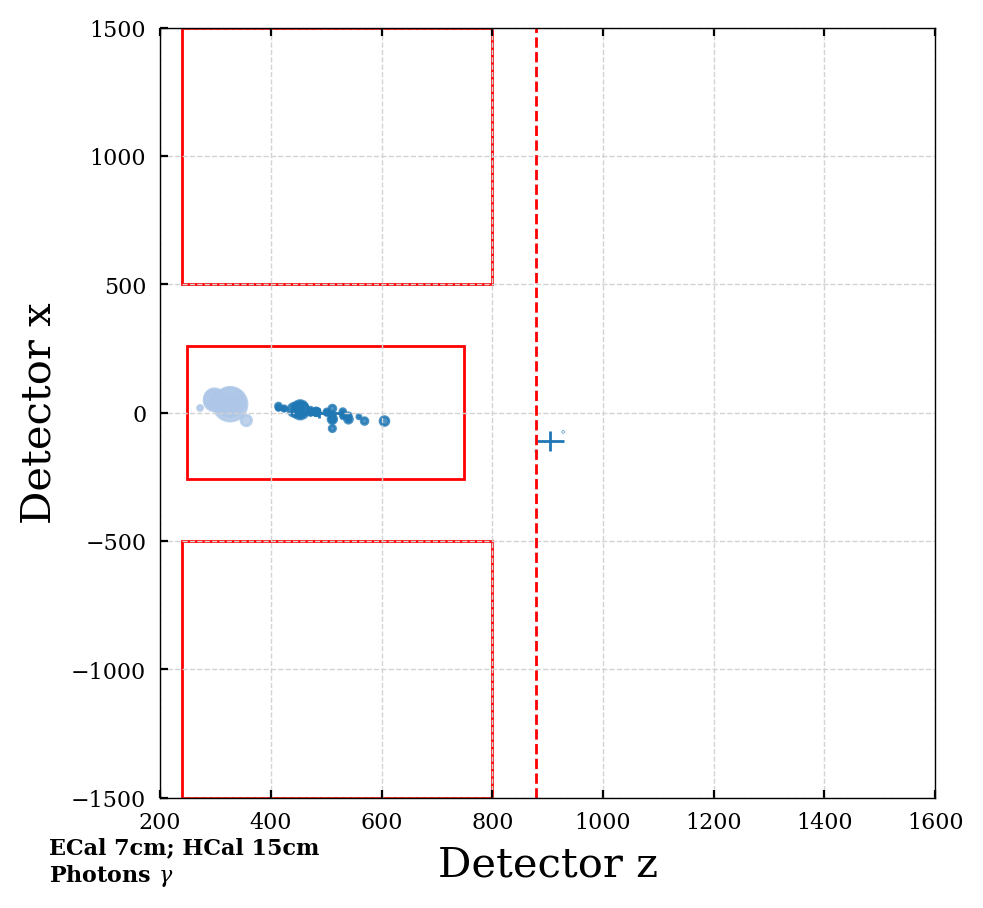

# of clust: 1
# particle: 3331


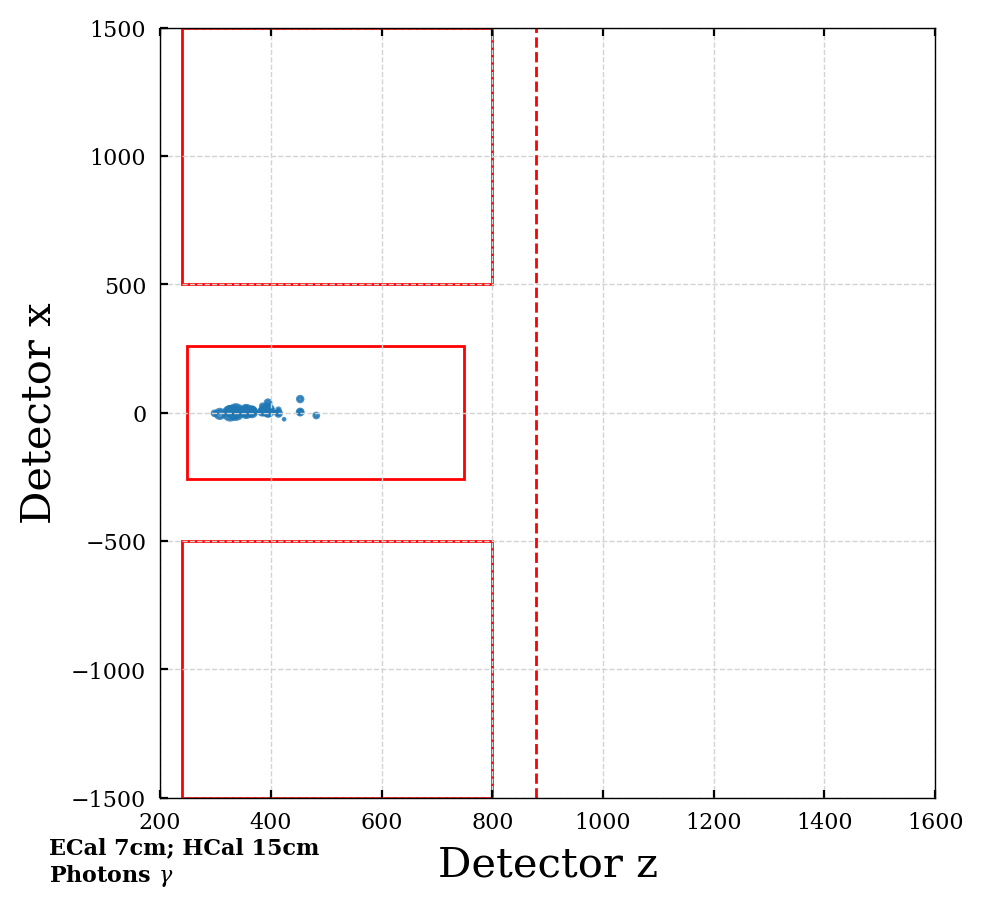

# of clust: 1
# particle: 8628


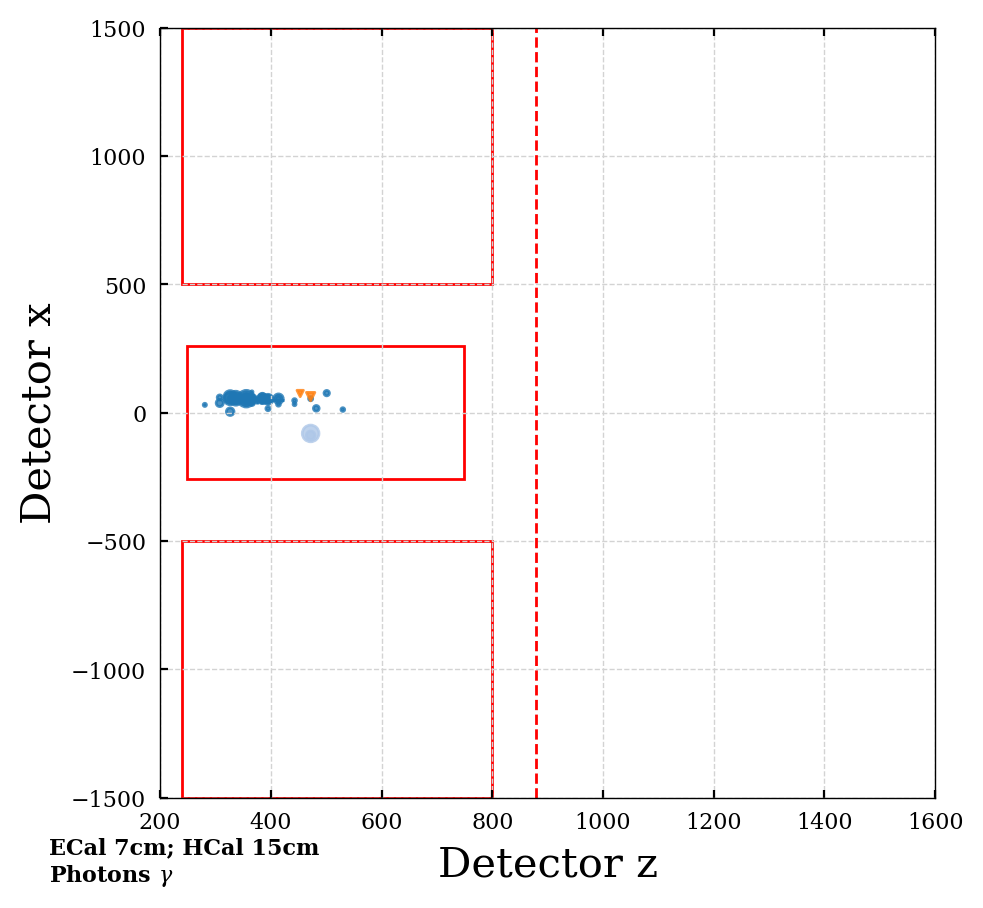

# of clust: 1
# particle: 2178


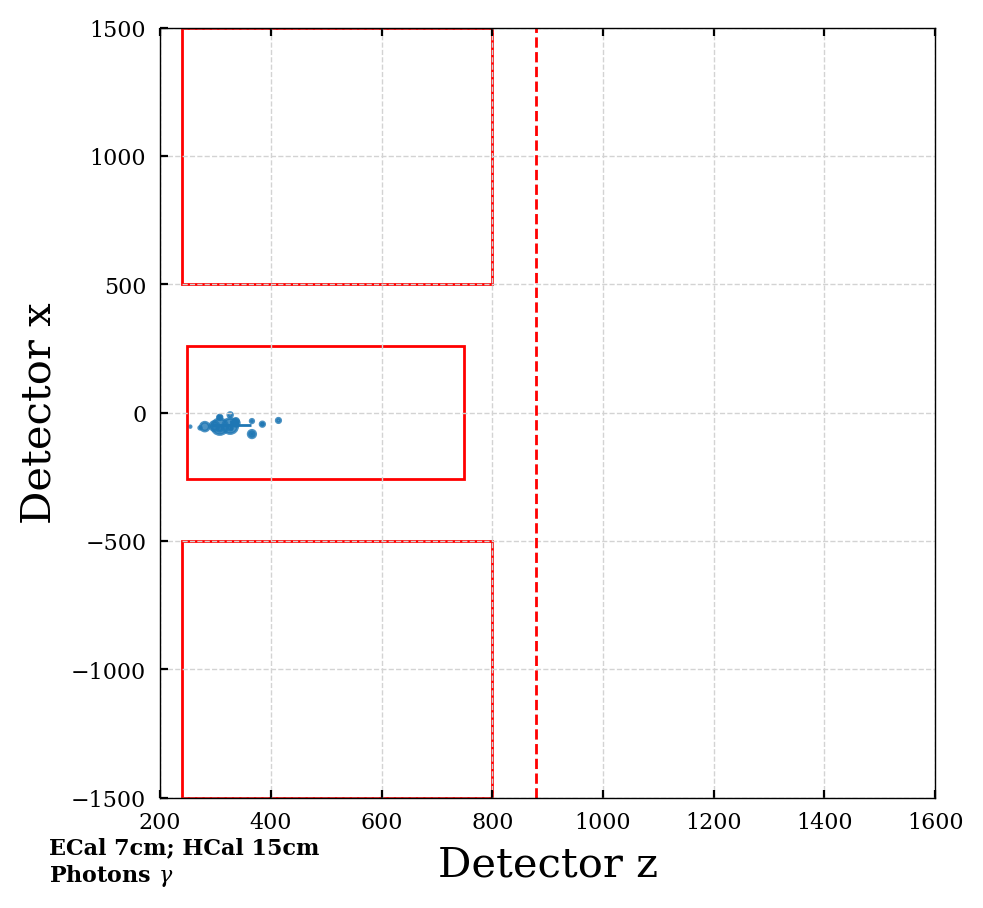

# of clust: 1
# particle: 7955


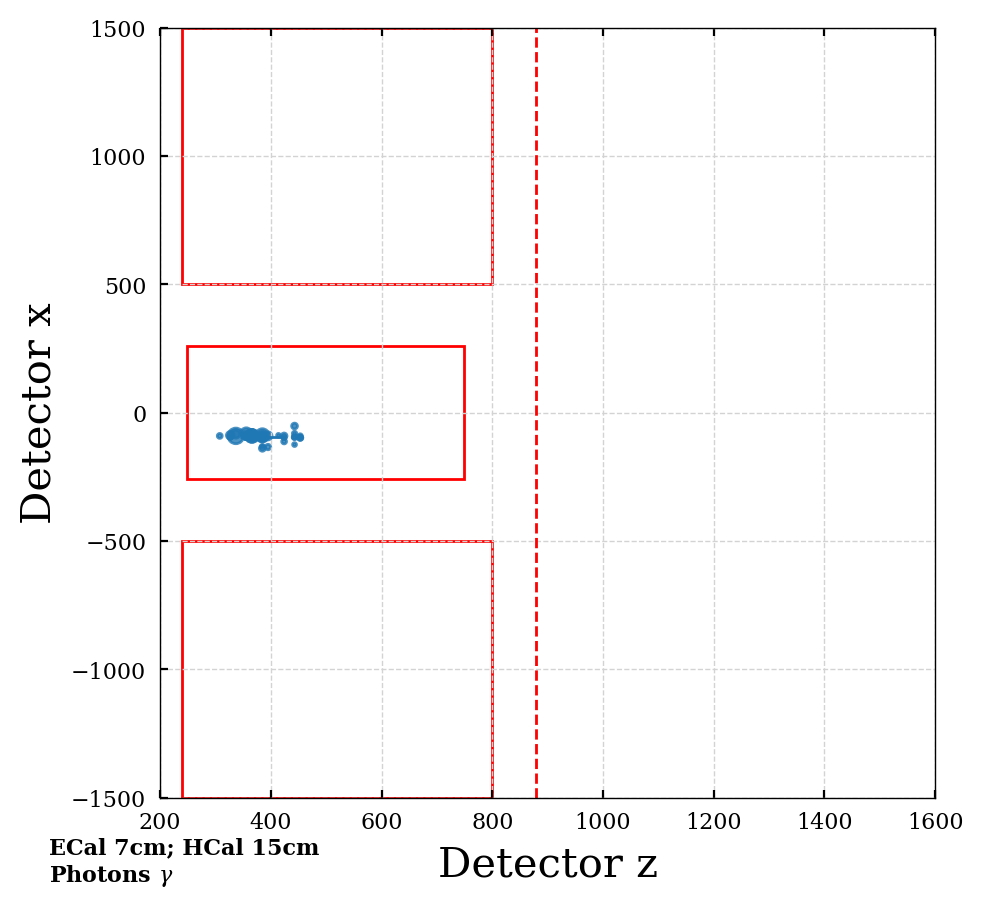

# of clust: 1
# particle: 2025


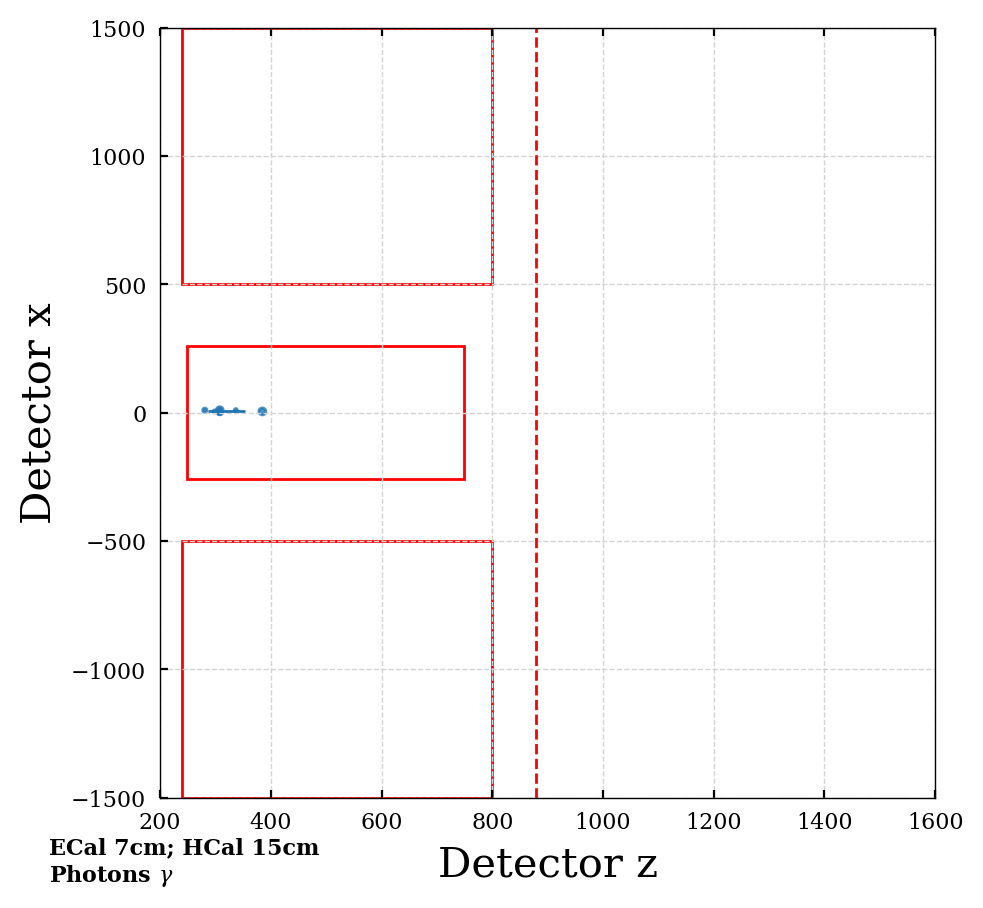

# of clust: 1
# particle: 6792


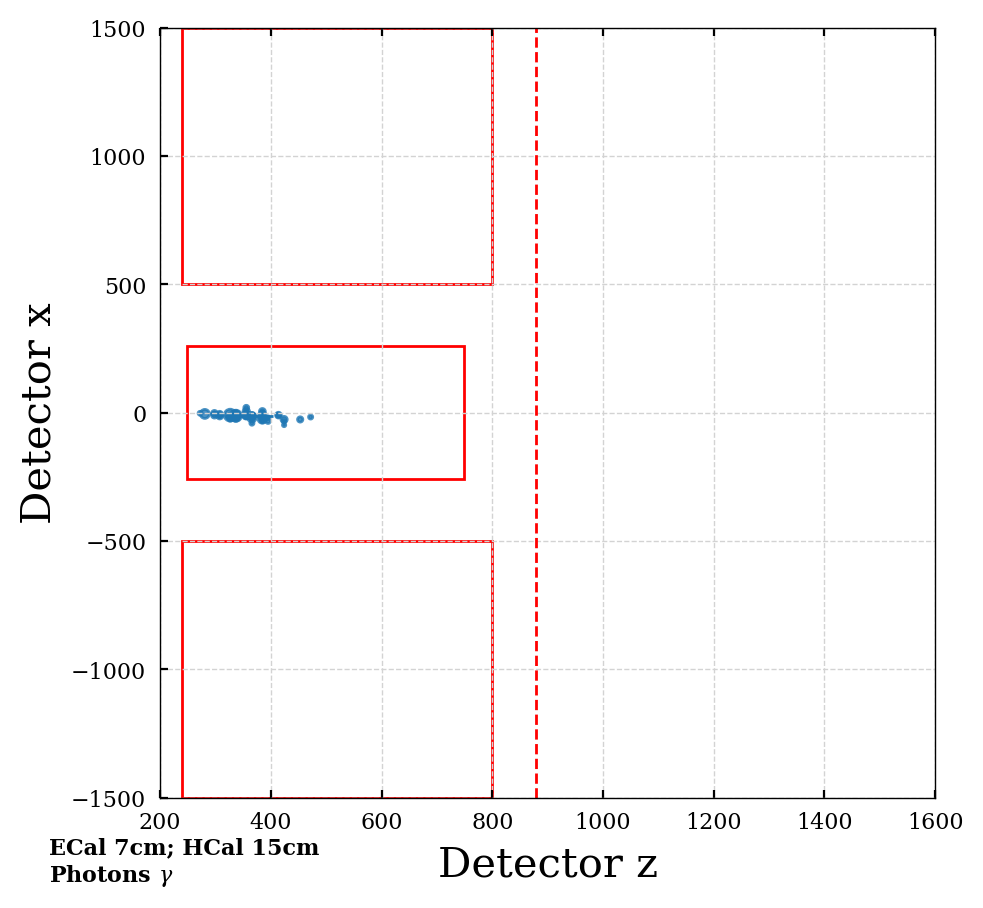

# of clust: 1
# particle: 34


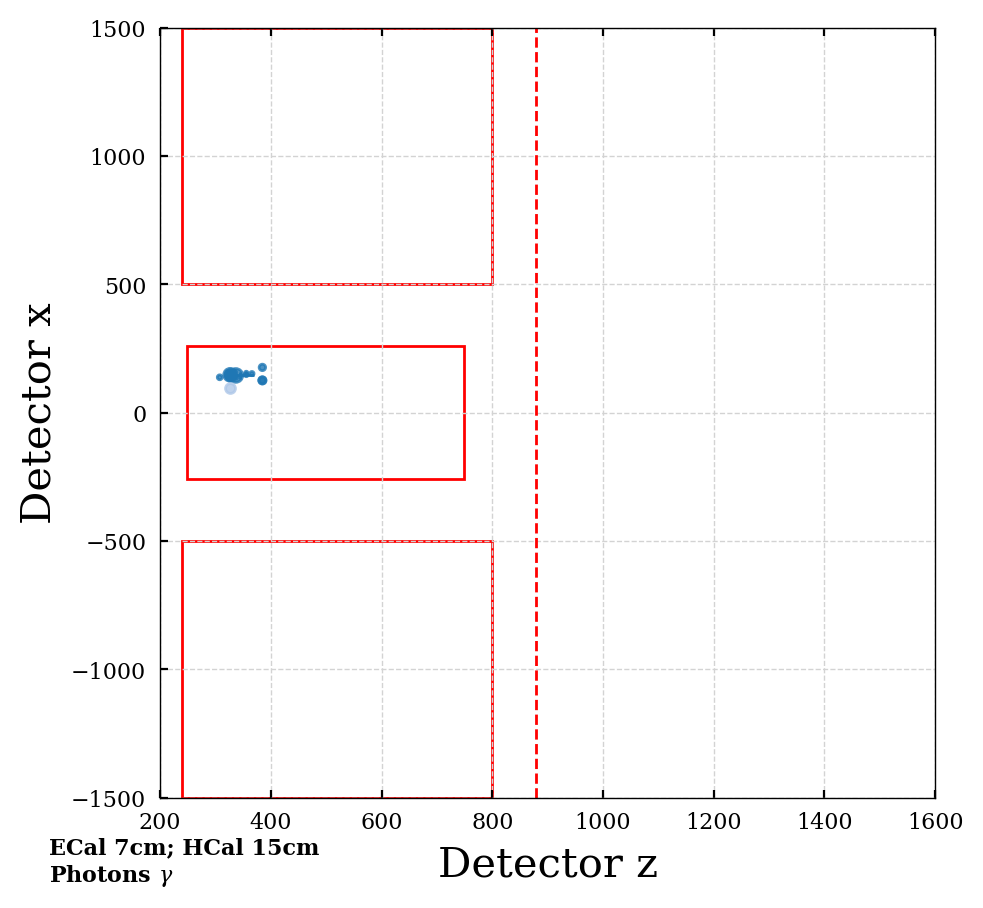

# of clust: 0
# particle: 3983


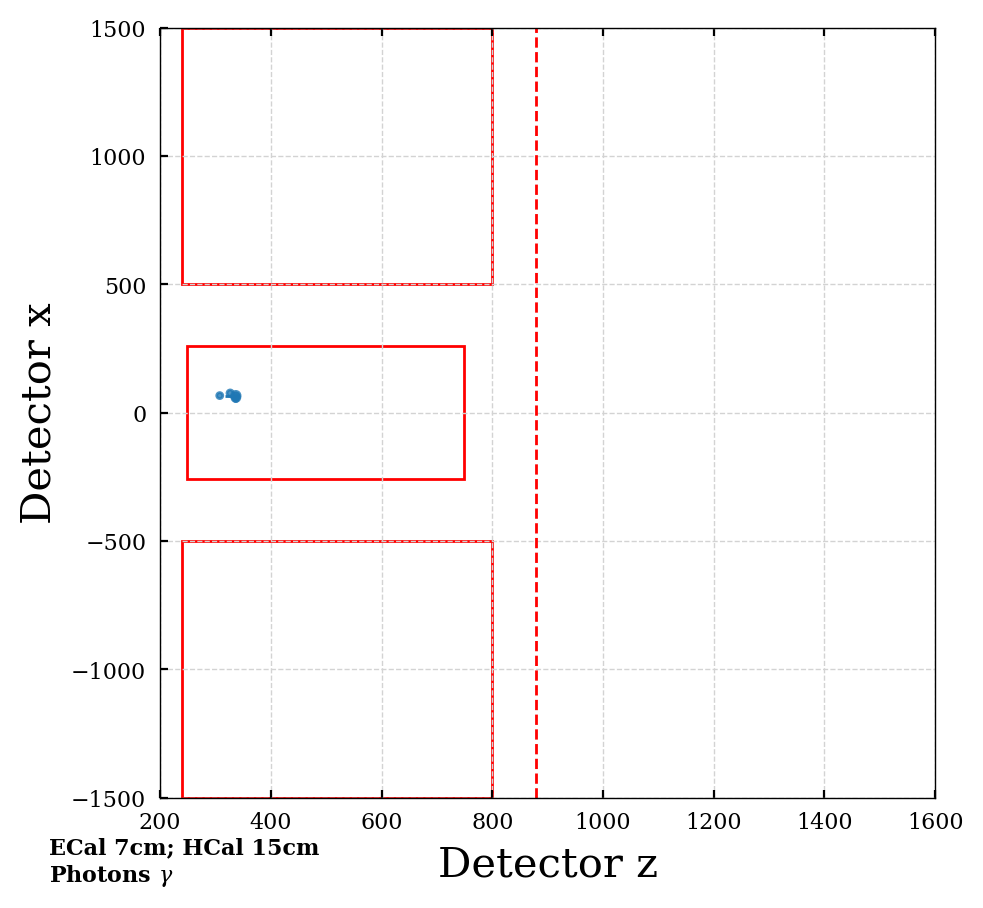

# of clust: 1
# particle: 9733


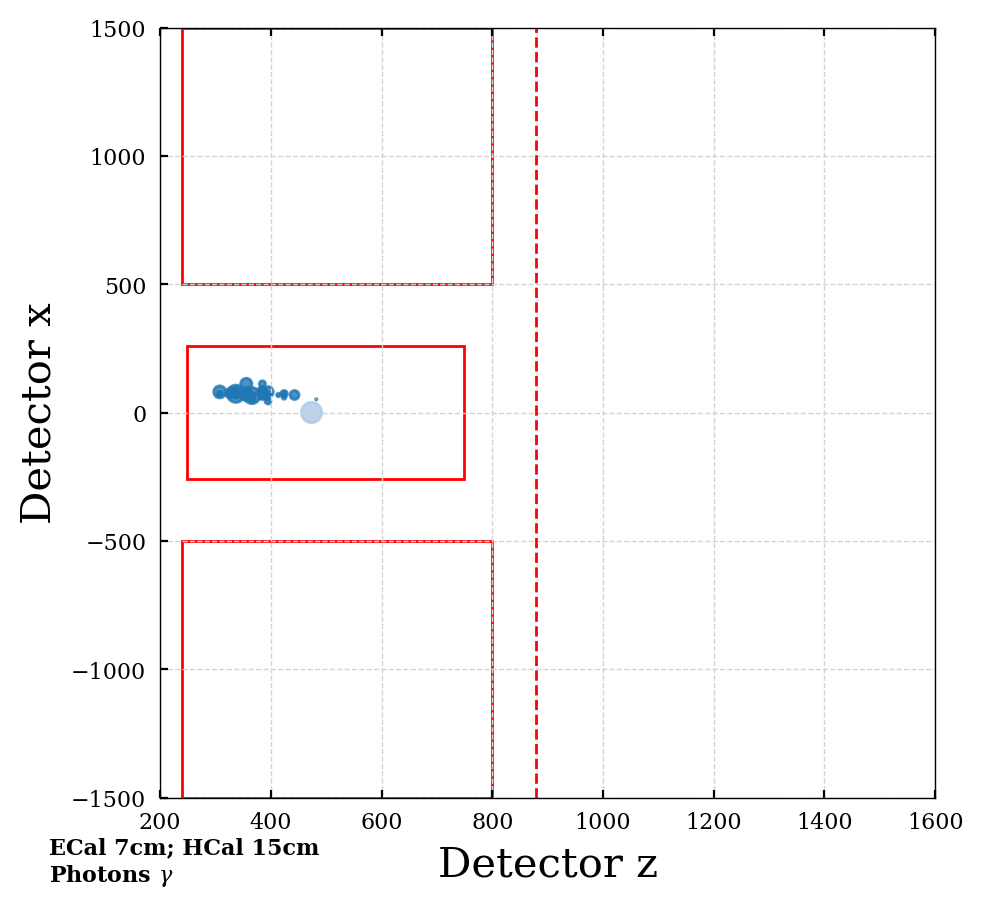

# of clust: 1
# particle: 4812


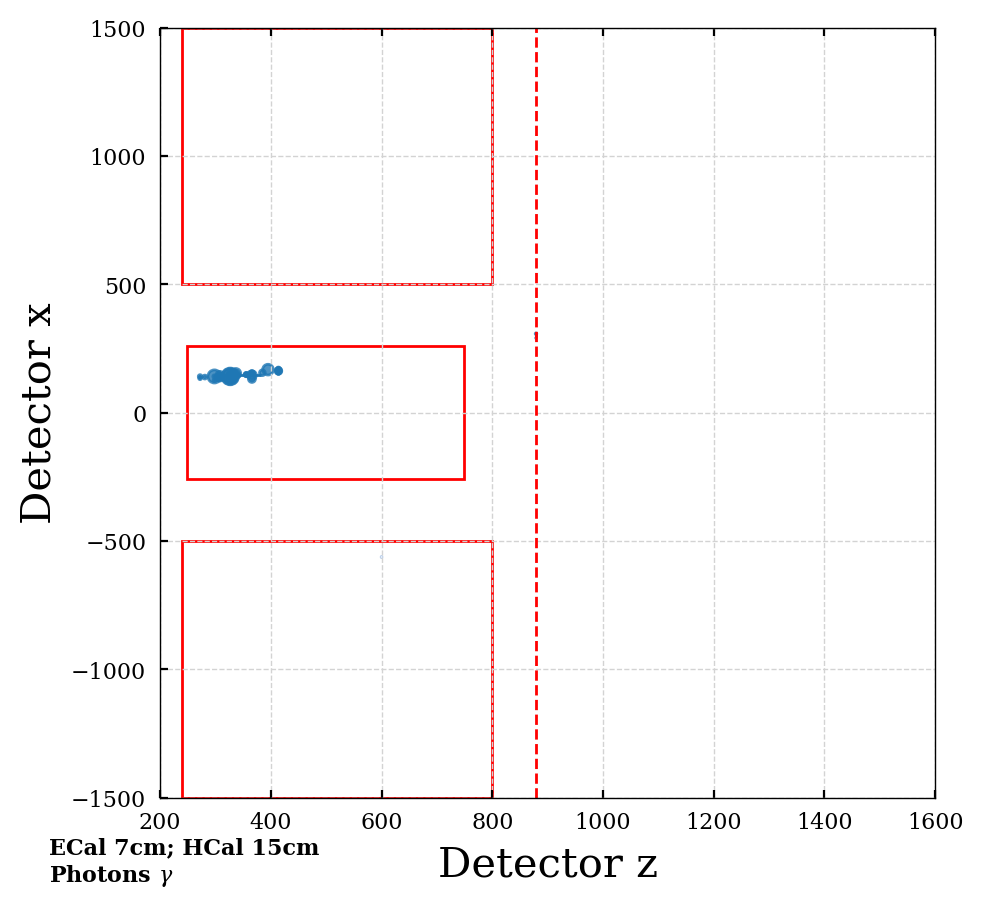

In [26]:
plot_cluster_dist(particles_dict, spec_part='photons', ipart=None, xlim=1600, ylim=1500, angle_label=False)
# randomly select events
for ipart in np.random.randint(0, high=1e4, size=10, dtype=int):
    plot_cluster_dist(particles_dict, spec_part='photons', ipart=ipart, xlim=1600, ylim=1500, angle_label=False)

### Electrons

# of clust: 2
# particle: 38


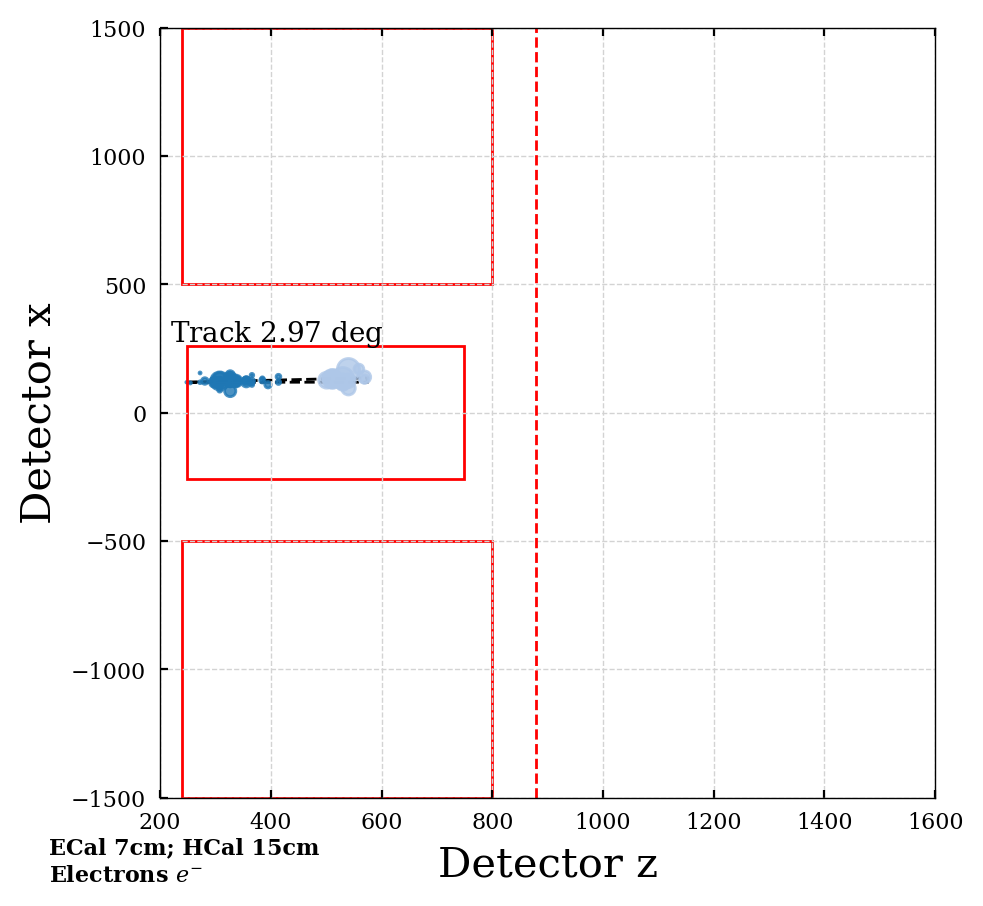

# of clust: 1
# particle: 3948


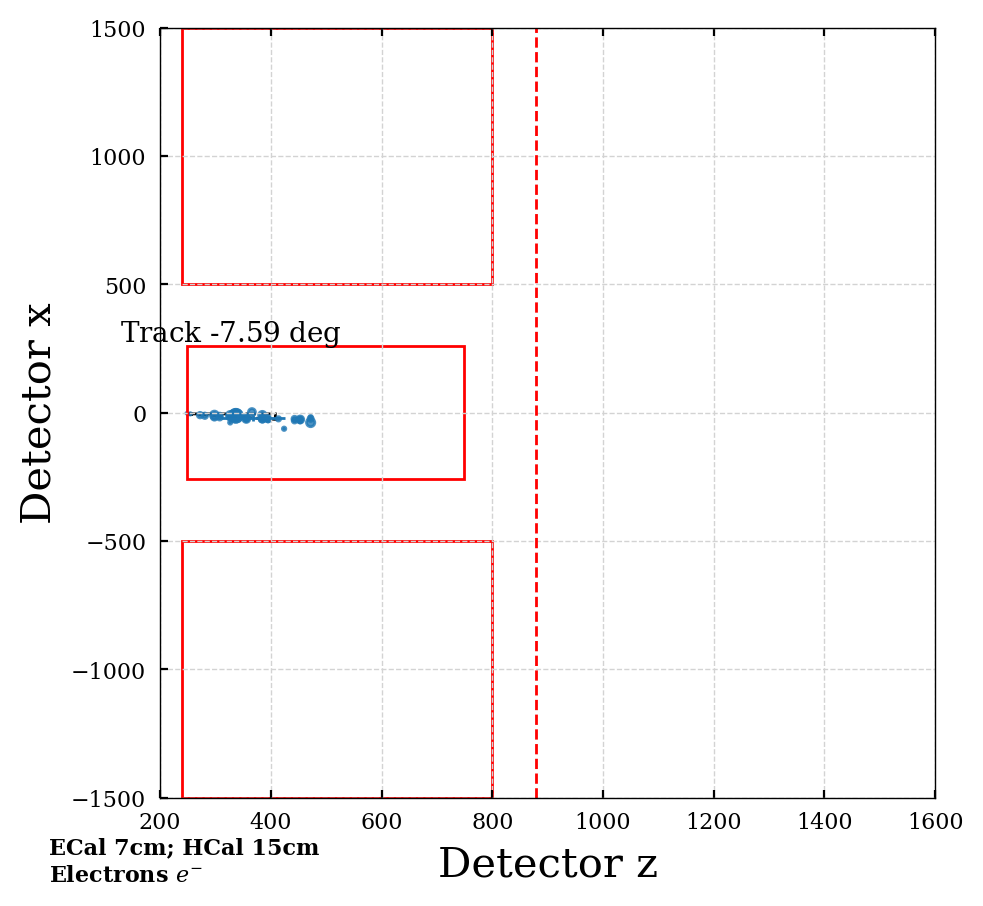

# of clust: 1
# particle: 1411


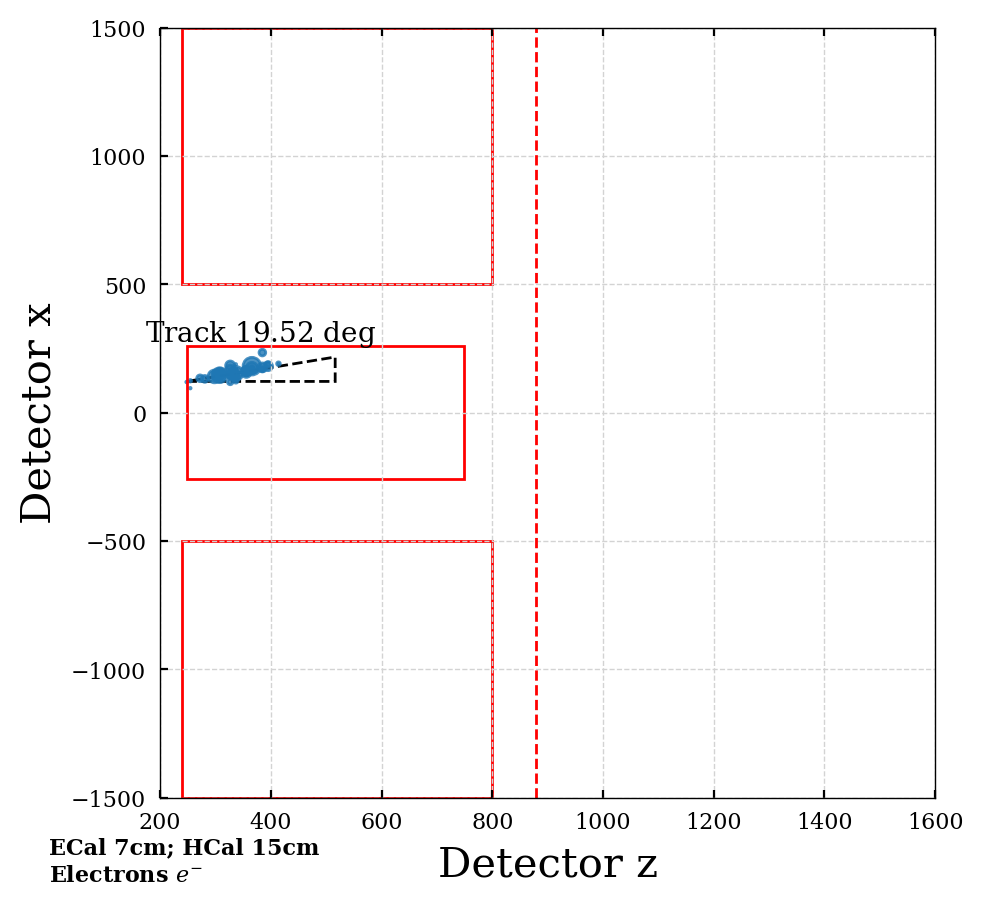

# of clust: 1
# particle: 1438


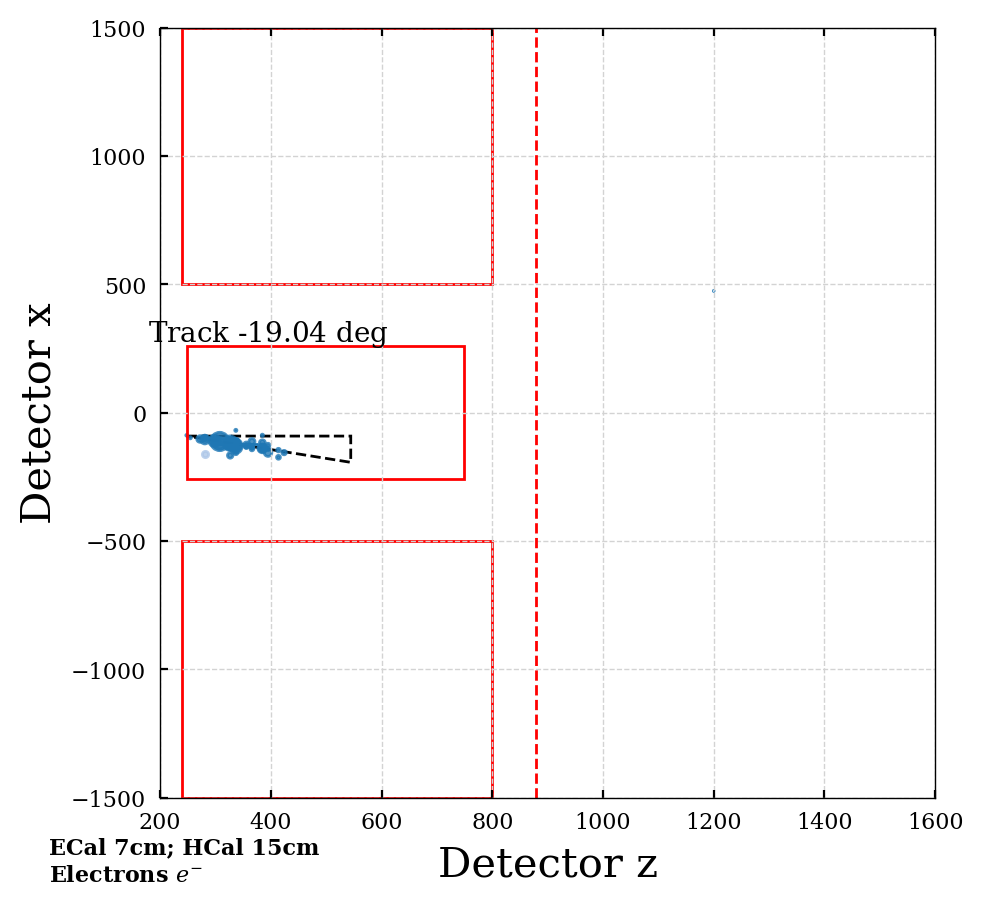

# of clust: 1
# particle: 2740


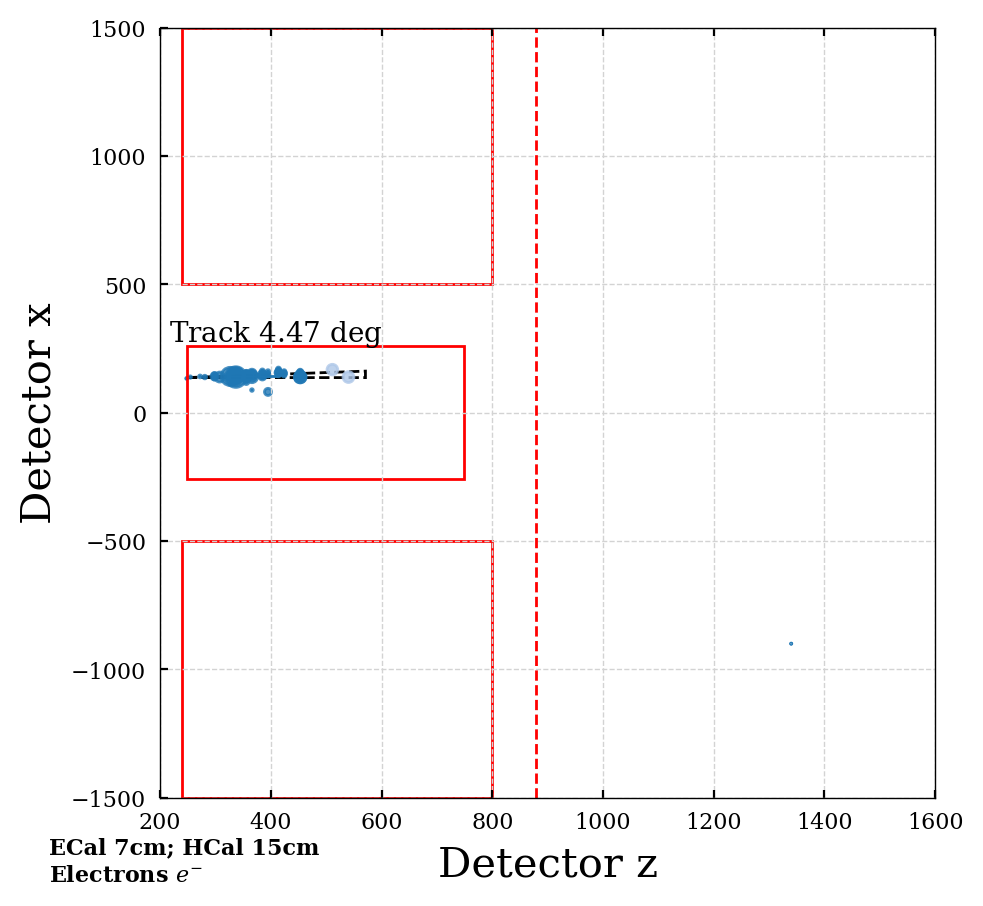

# of clust: 1
# particle: 147


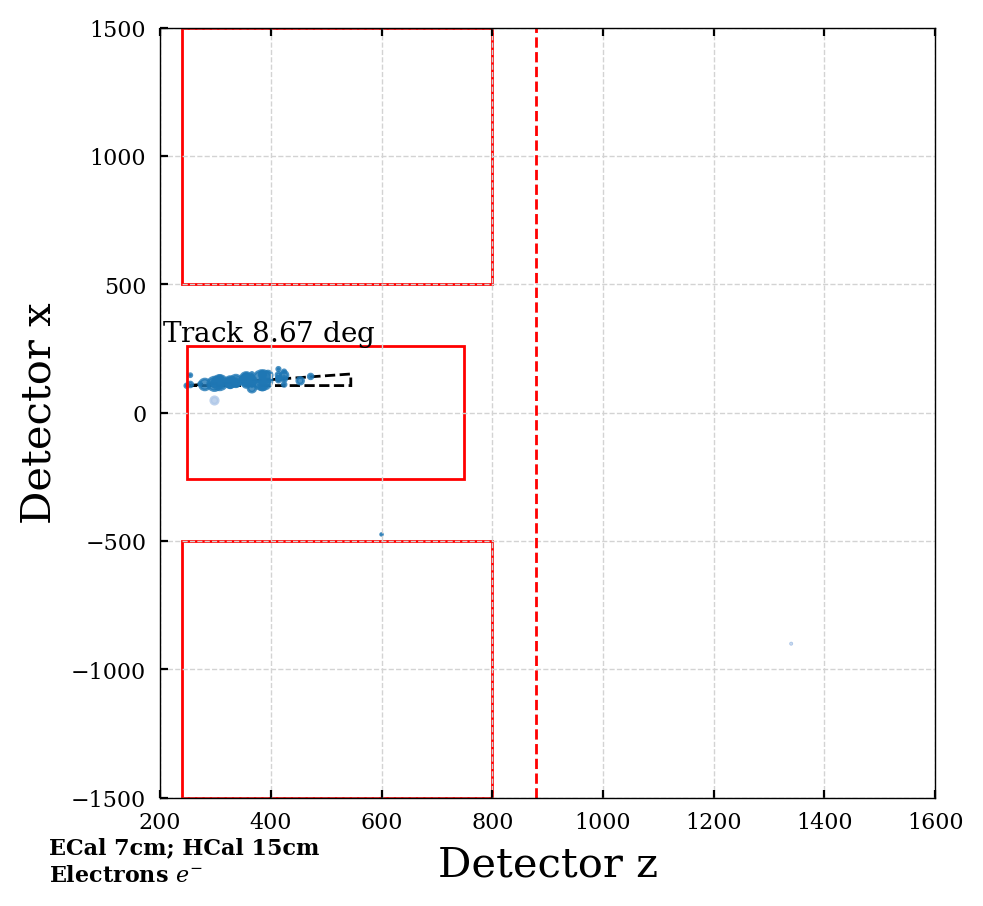

# of clust: 1
# particle: 131


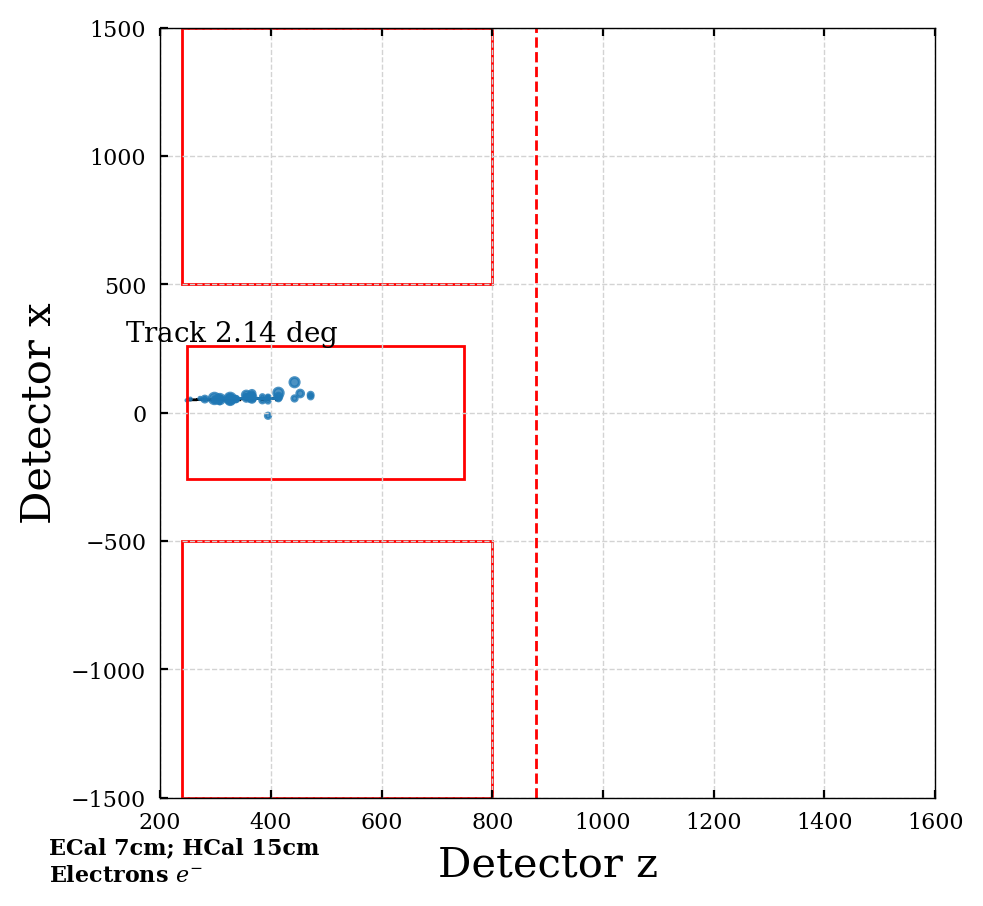

# of clust: 1
# particle: 1304


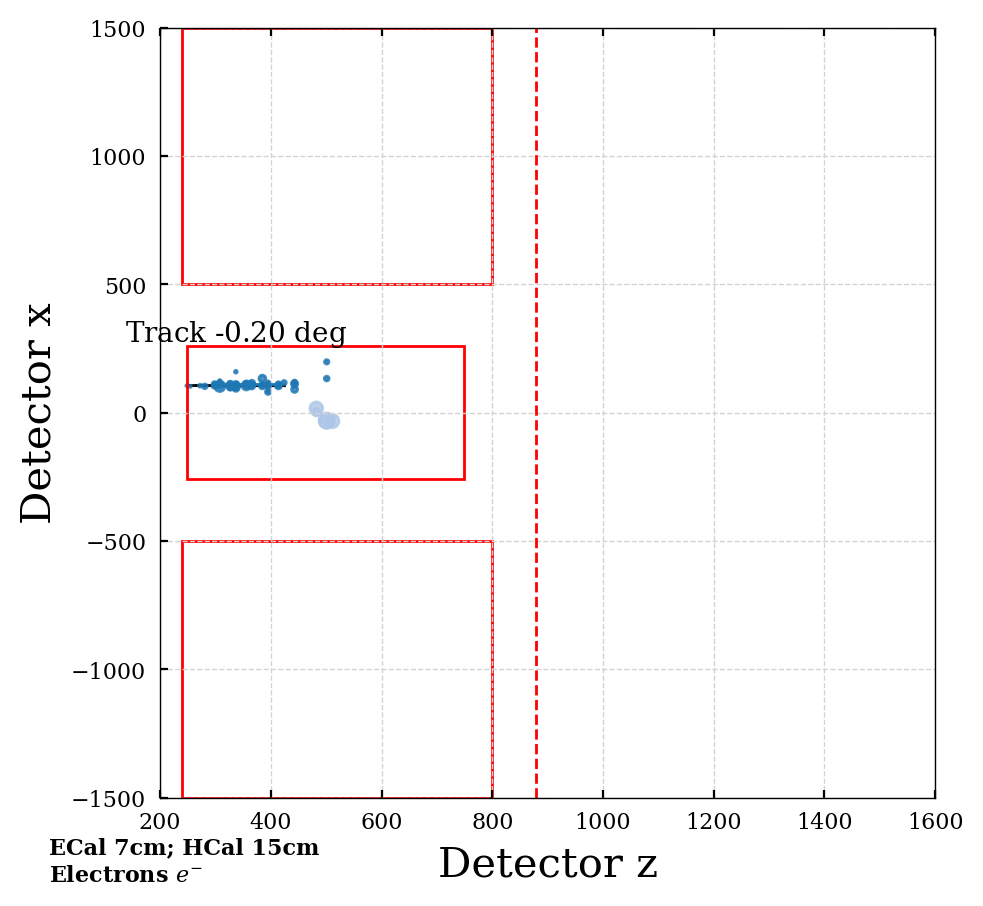

# of clust: 1
# particle: 6421


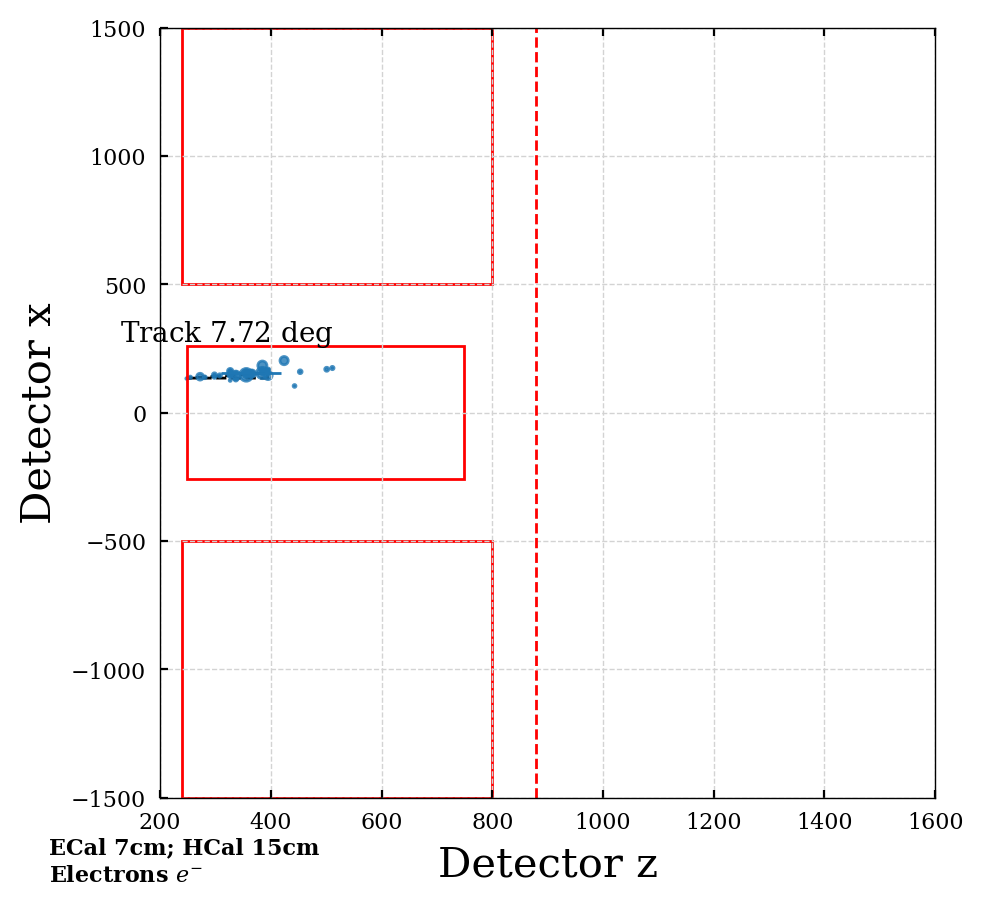

# of clust: 1
# particle: 4524


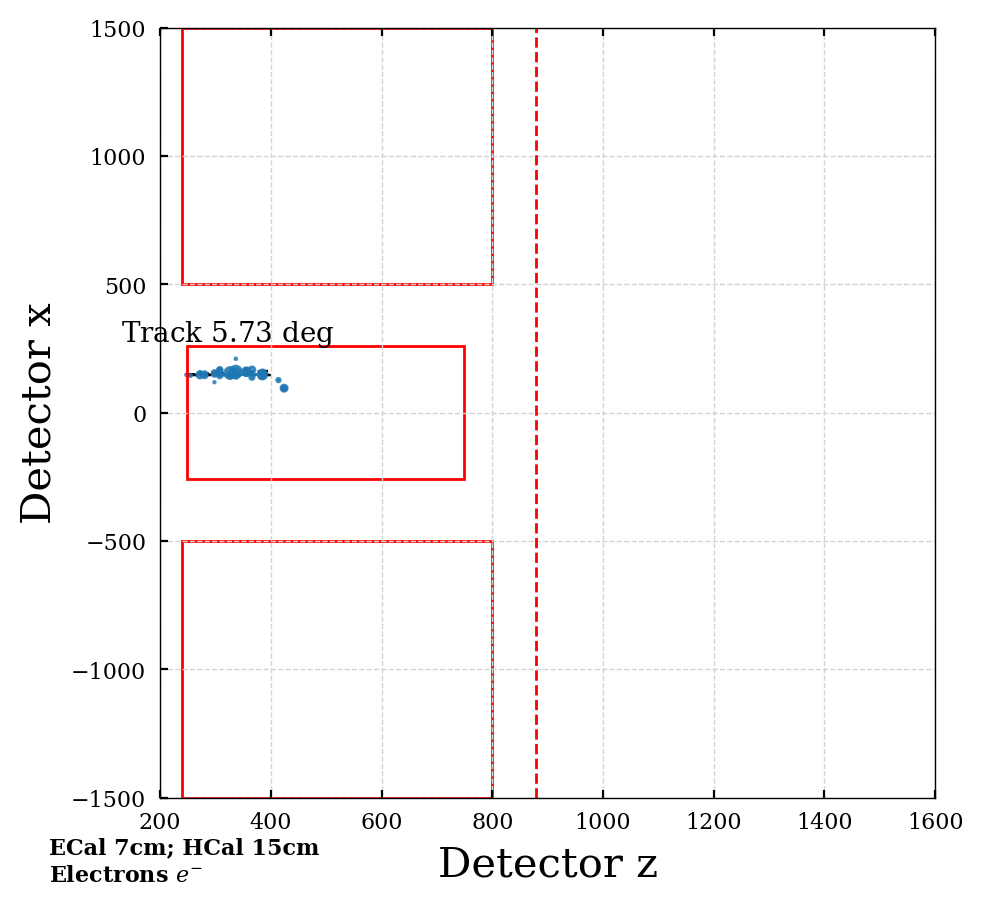

# of clust: 1
# particle: 6387


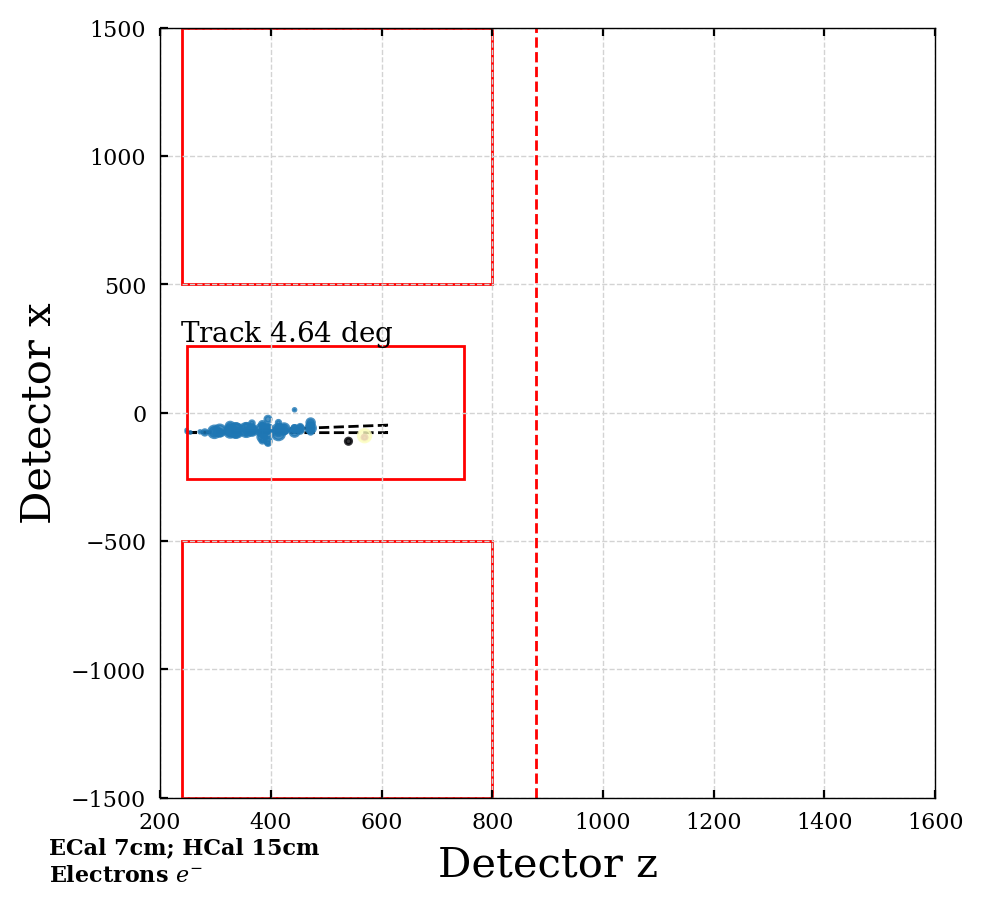

In [27]:
plot_cluster_dist(particles_dict, spec_part='electrons', ipart=None, xlim=1600, ylim=1500, angle_label=False)
# randomly select events
for ipart in np.random.randint(0, high=1e4, size=10, dtype=int):
    plot_cluster_dist(particles_dict, spec_part='electrons', ipart=ipart, xlim=1600, ylim=1500, angle_label=False)

### Pions

# of clust: 3
# particle: 945


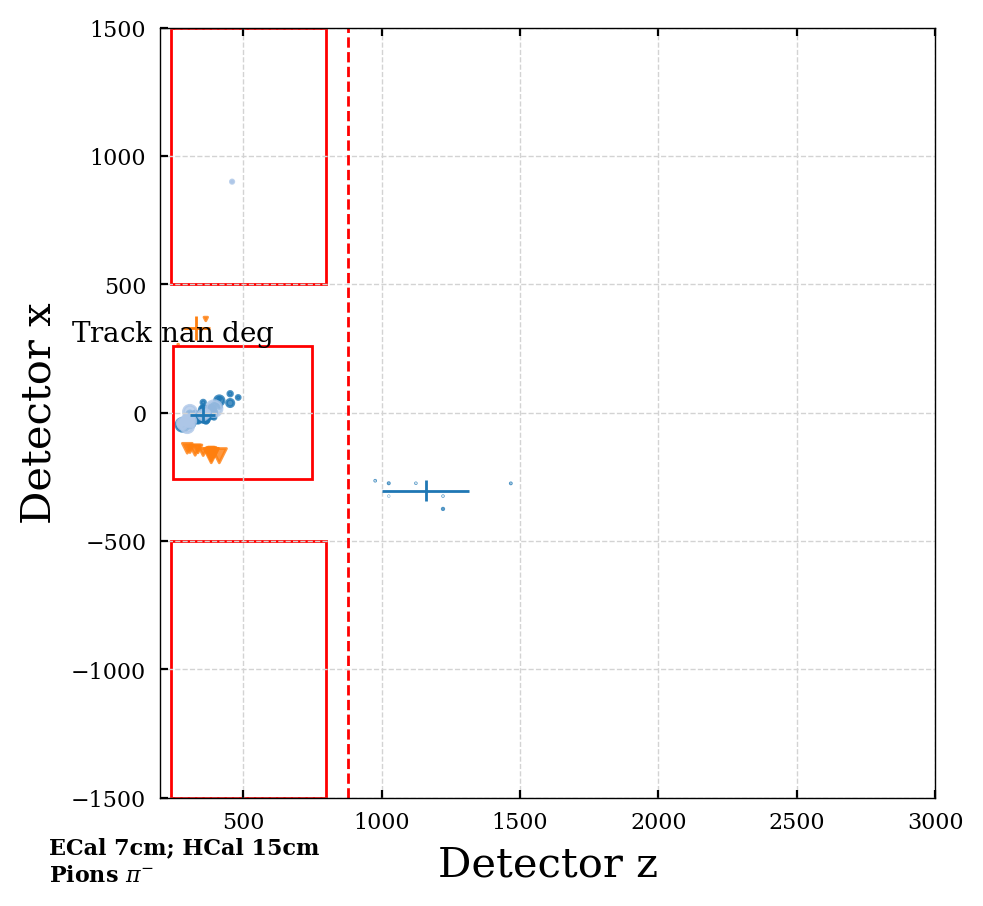

# of clust: 1
# particle: 7012


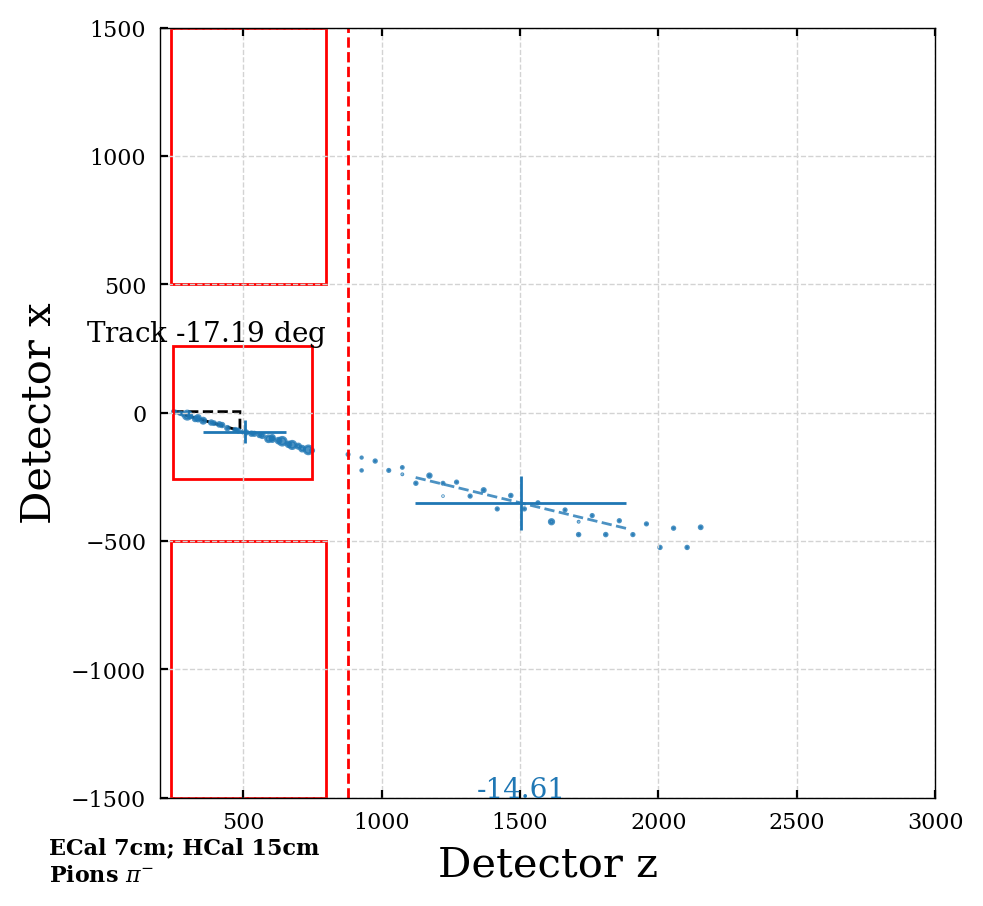

# of clust: 0
# particle: 6659


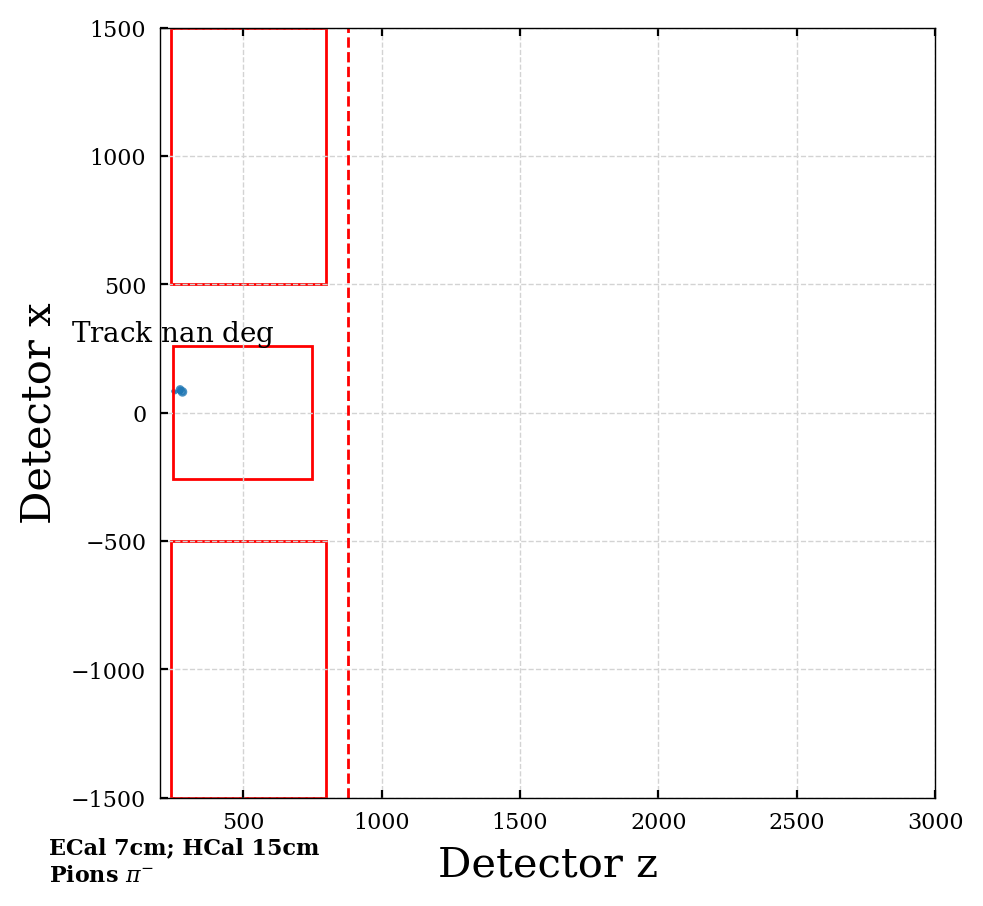

# of clust: 1
# particle: 3251


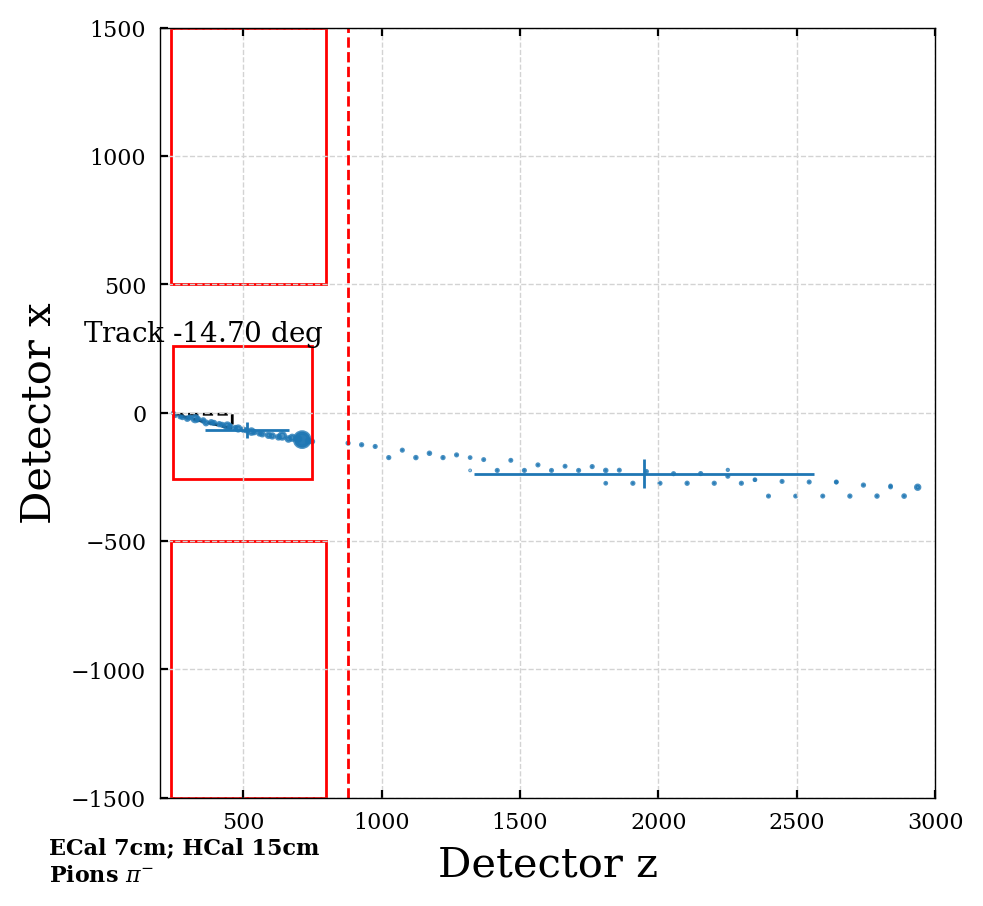

# of clust: 1
# particle: 533


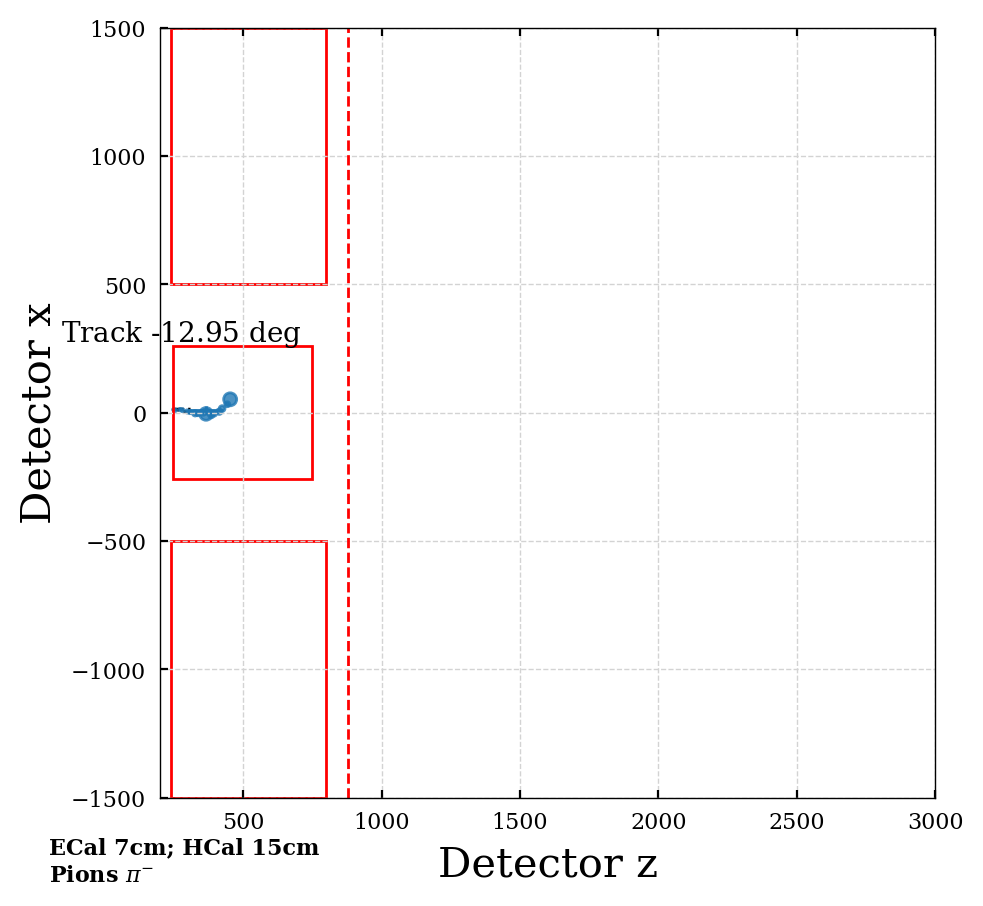

# of clust: 1
# particle: 6846


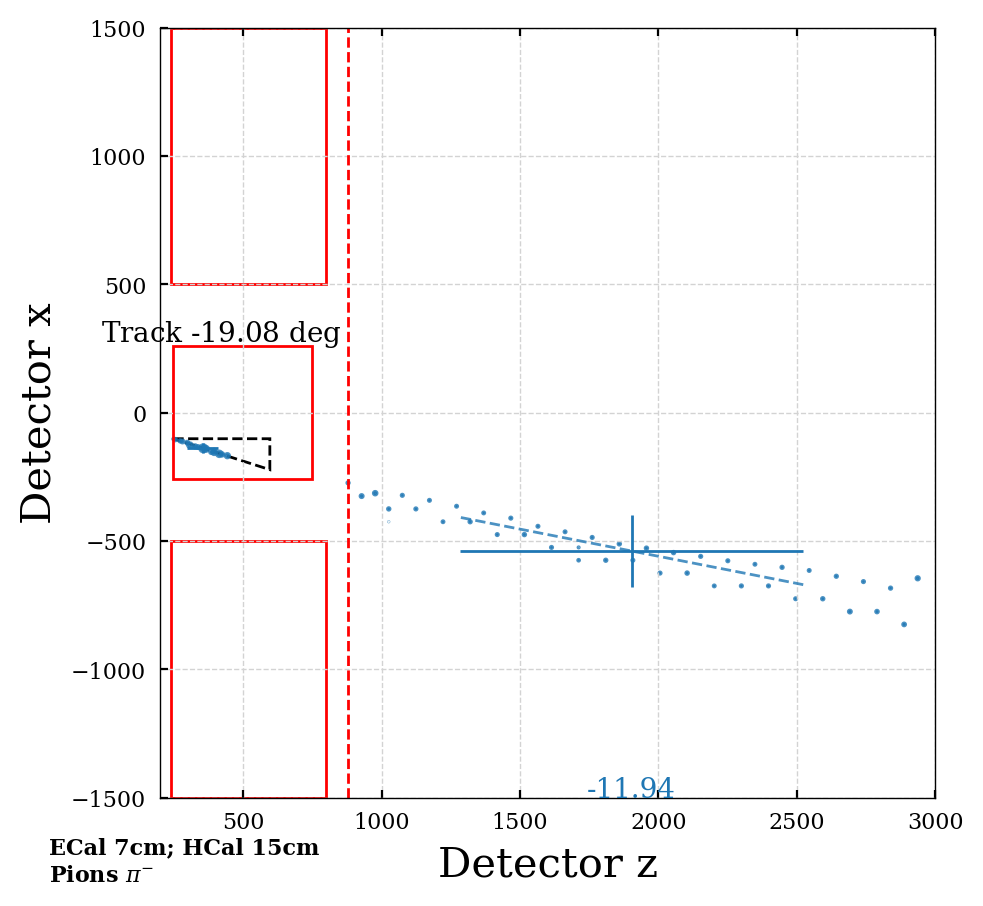

# of clust: 1
# particle: 7011


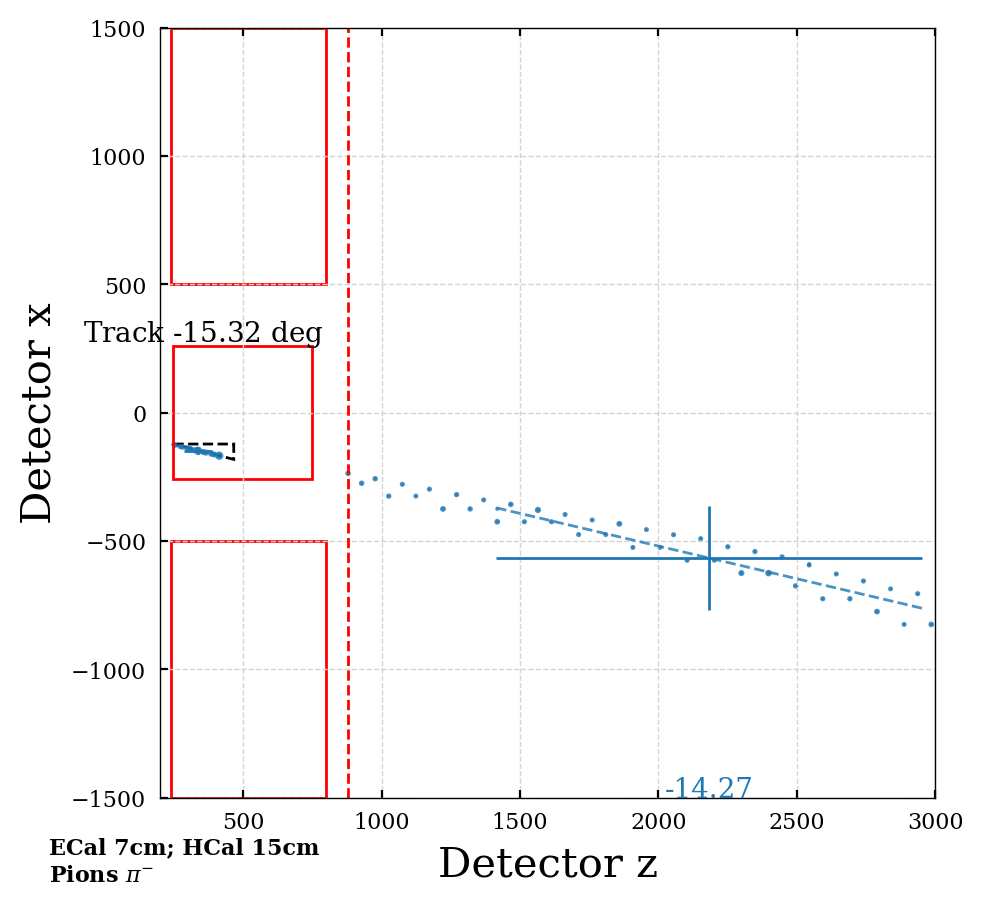

# of clust: 1
# particle: 4351


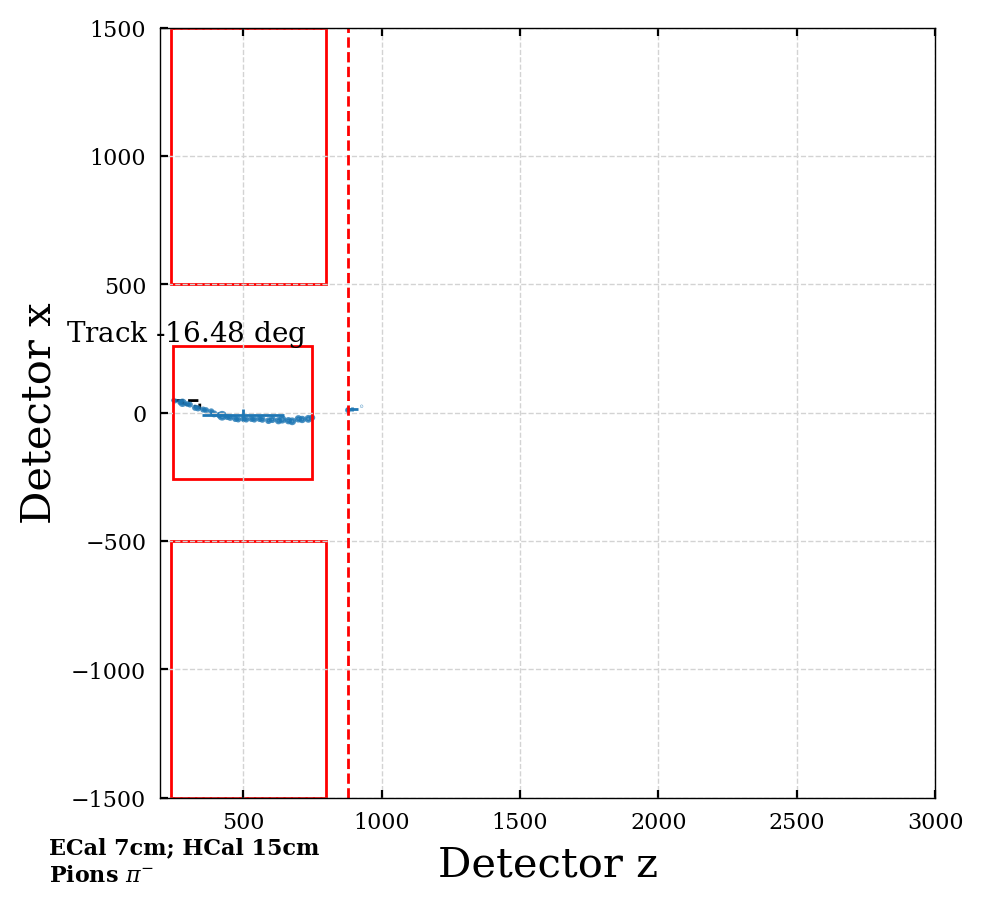

# of clust: 1
# particle: 7589


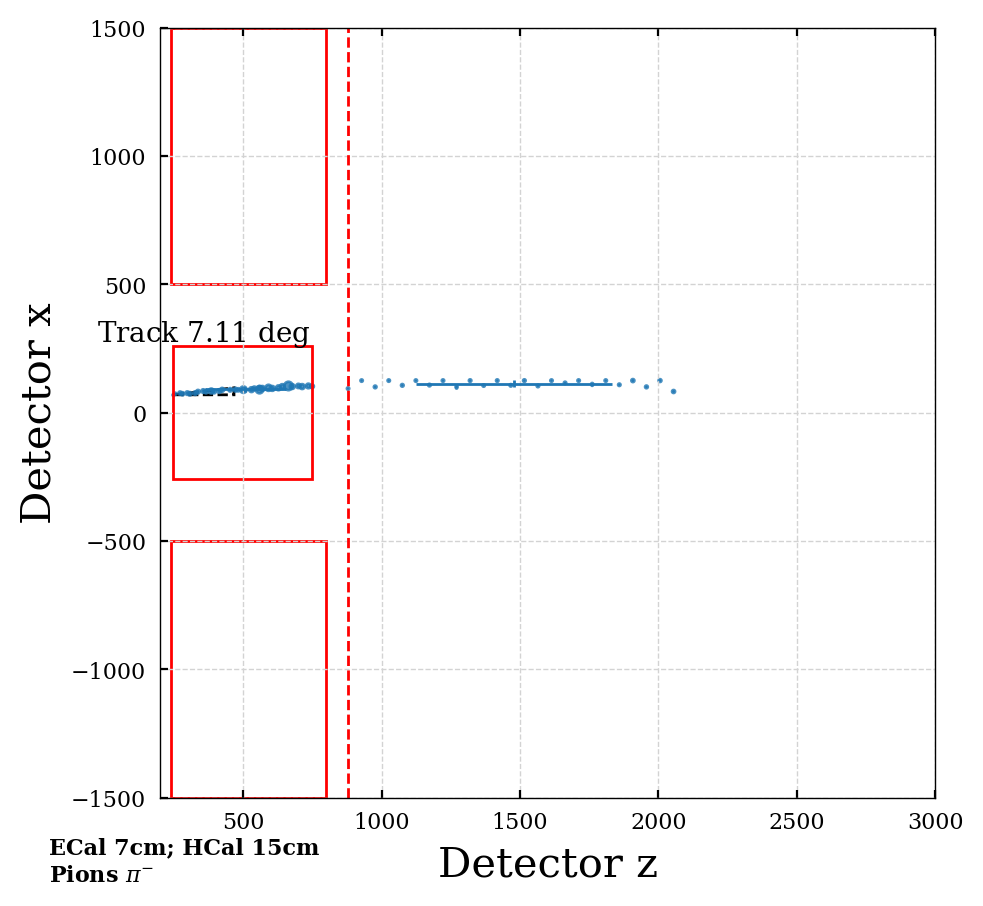

# of clust: 1
# particle: 4908


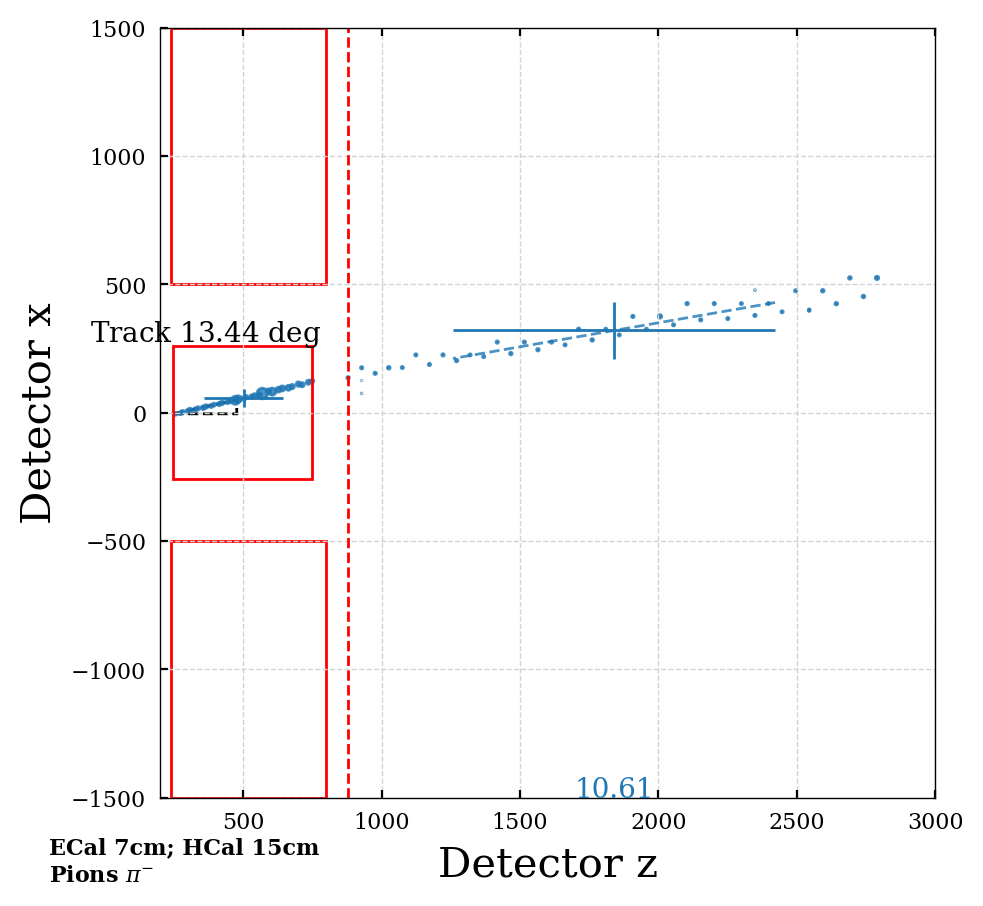

# of clust: 1
# particle: 6567


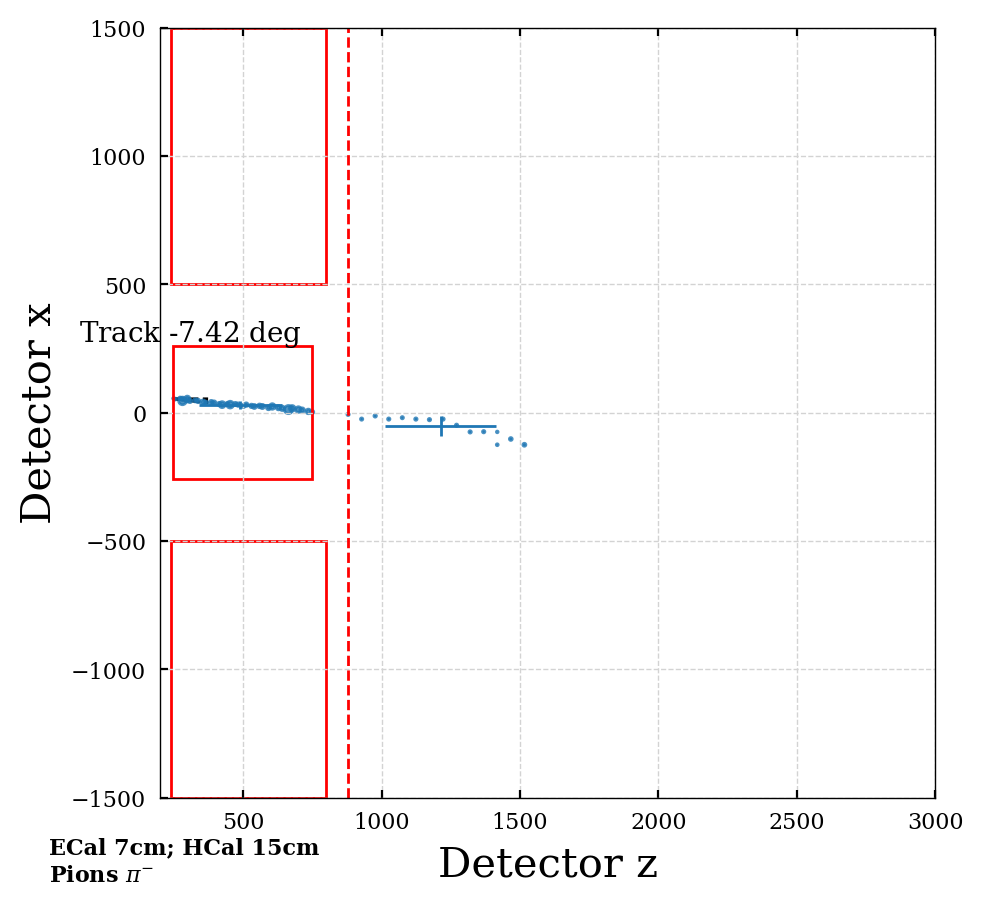

In [28]:
plot_cluster_dist(particles_dict, spec_part='pions', ipart=None, xlim=3000, ylim=1500, angle_label=False)
# randomly select events
for ipart in np.random.randint(0, high=1e4, size=10, dtype=int):
    plot_cluster_dist(particles_dict, spec_part='pions', ipart=ipart, xlim=3000, ylim=1500, angle_label=True)

### Neutrons

# of clust: 3
# particle: 643


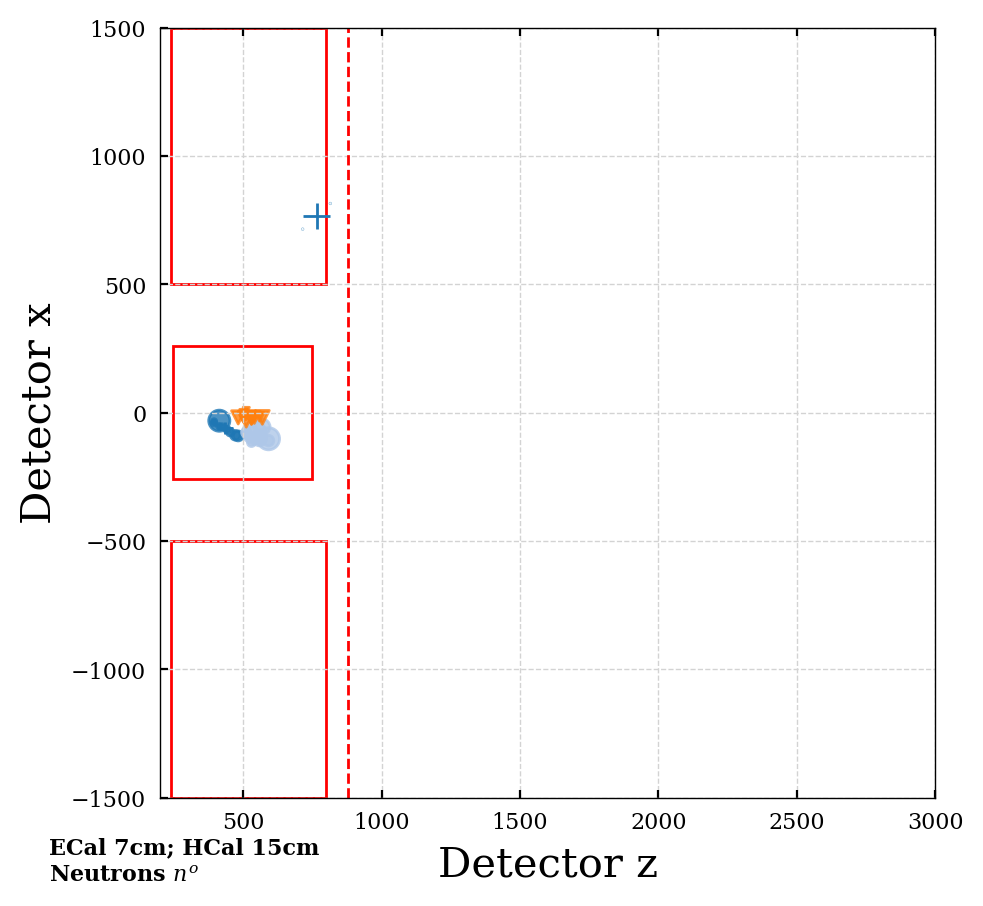

# of clust: 0
# particle: 4257


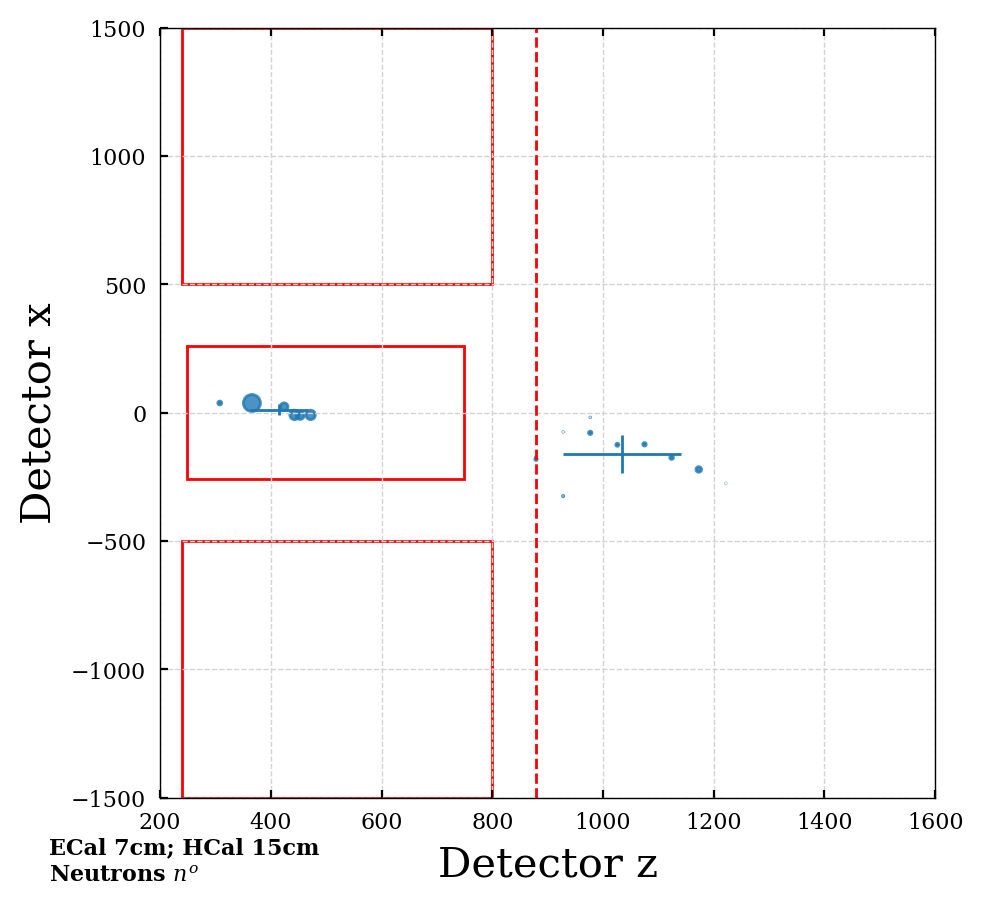

# of clust: 1
# particle: 1635


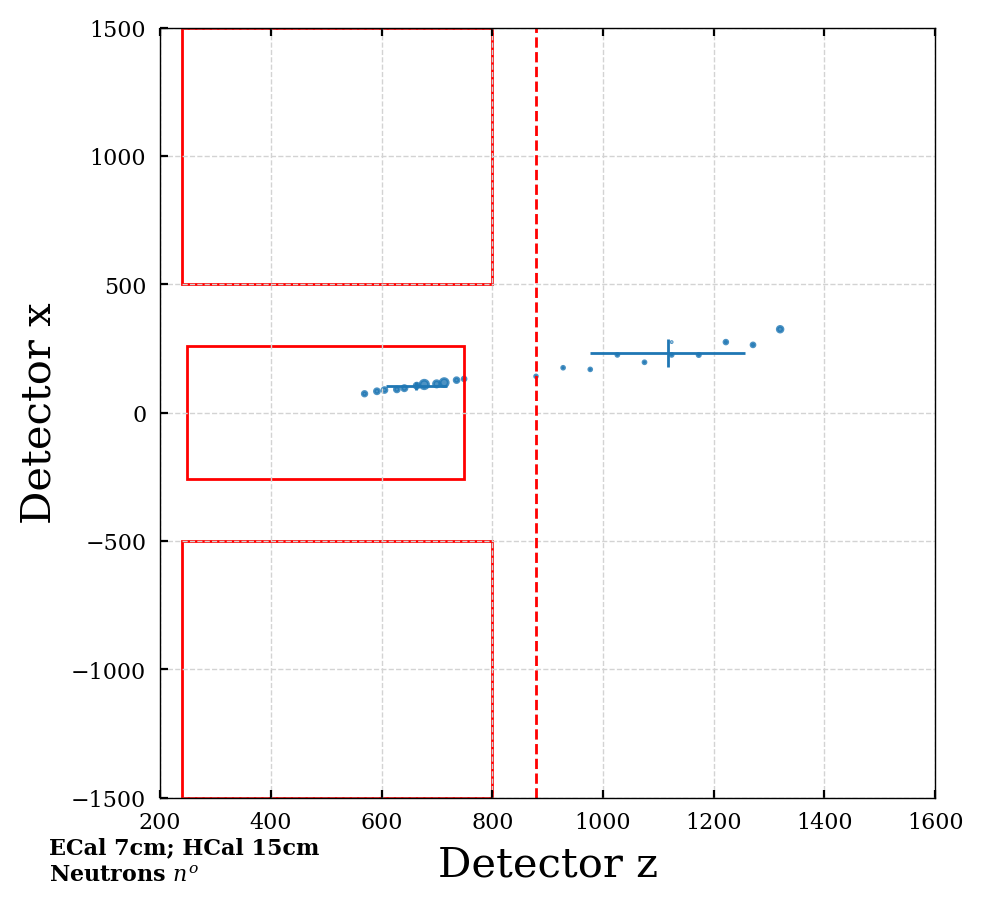

# of clust: 0
# particle: 6634


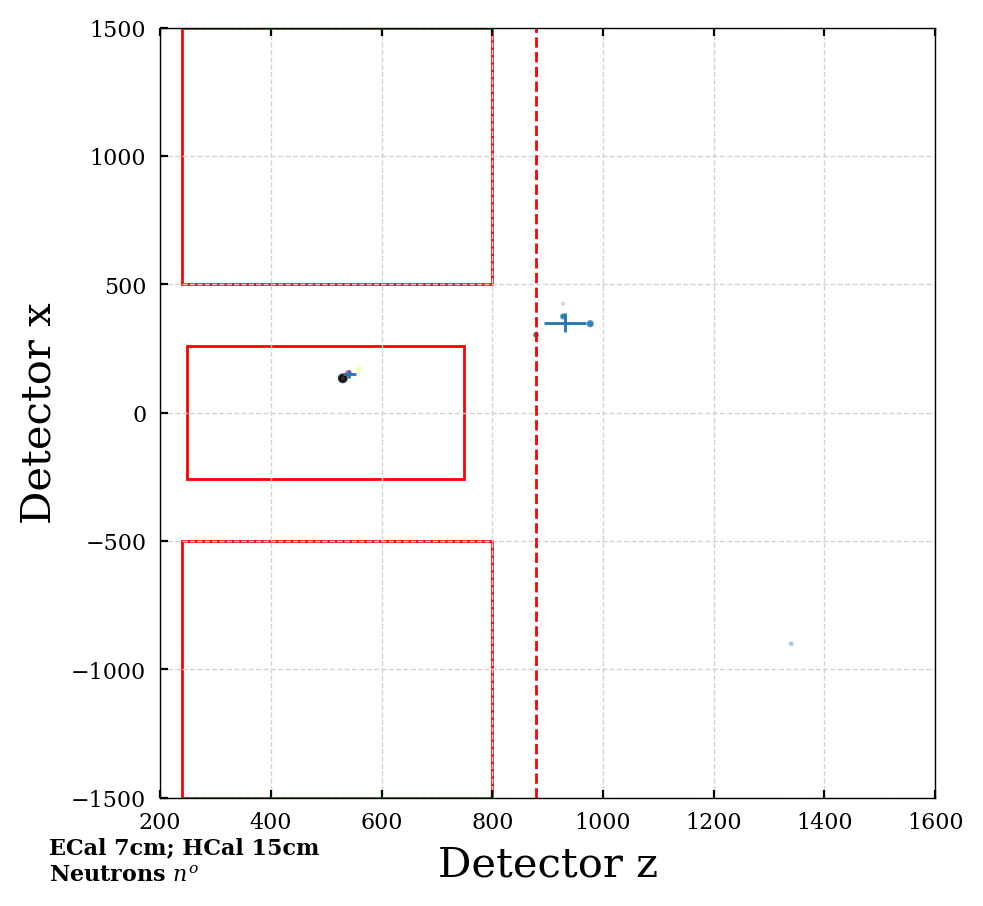

# of clust: 1
# particle: 7506


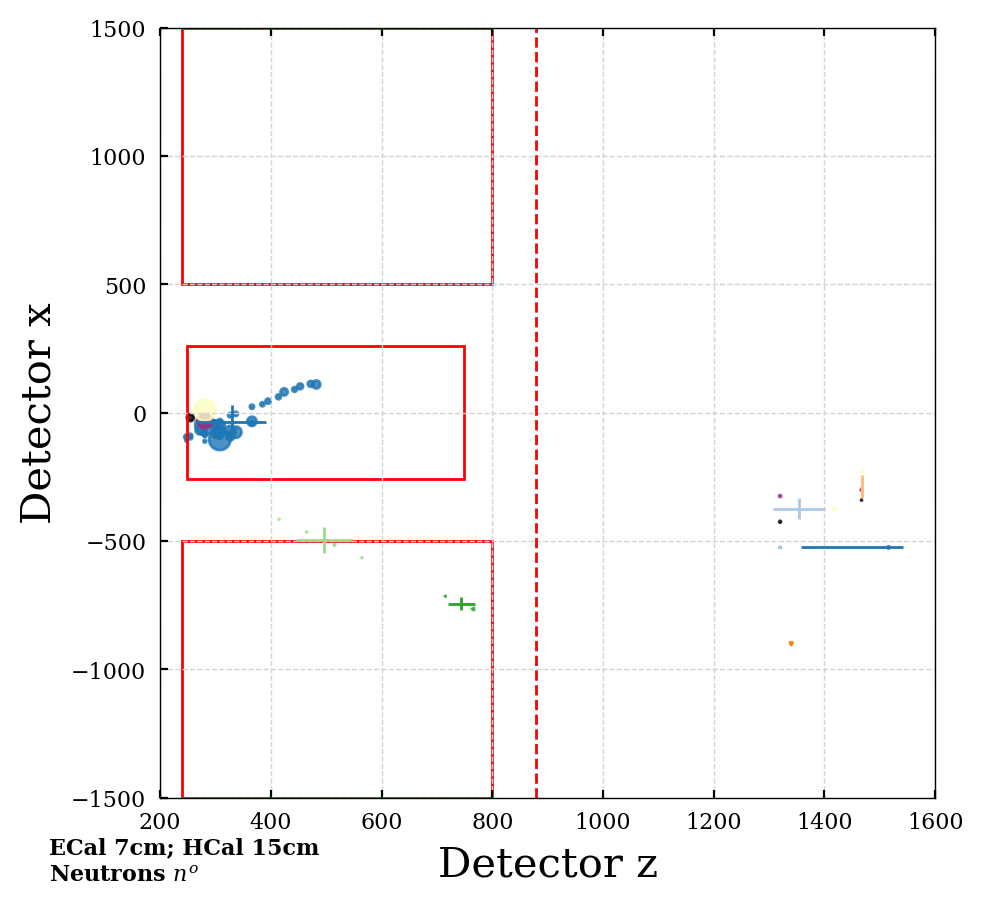

# of clust: 1
# particle: 1073


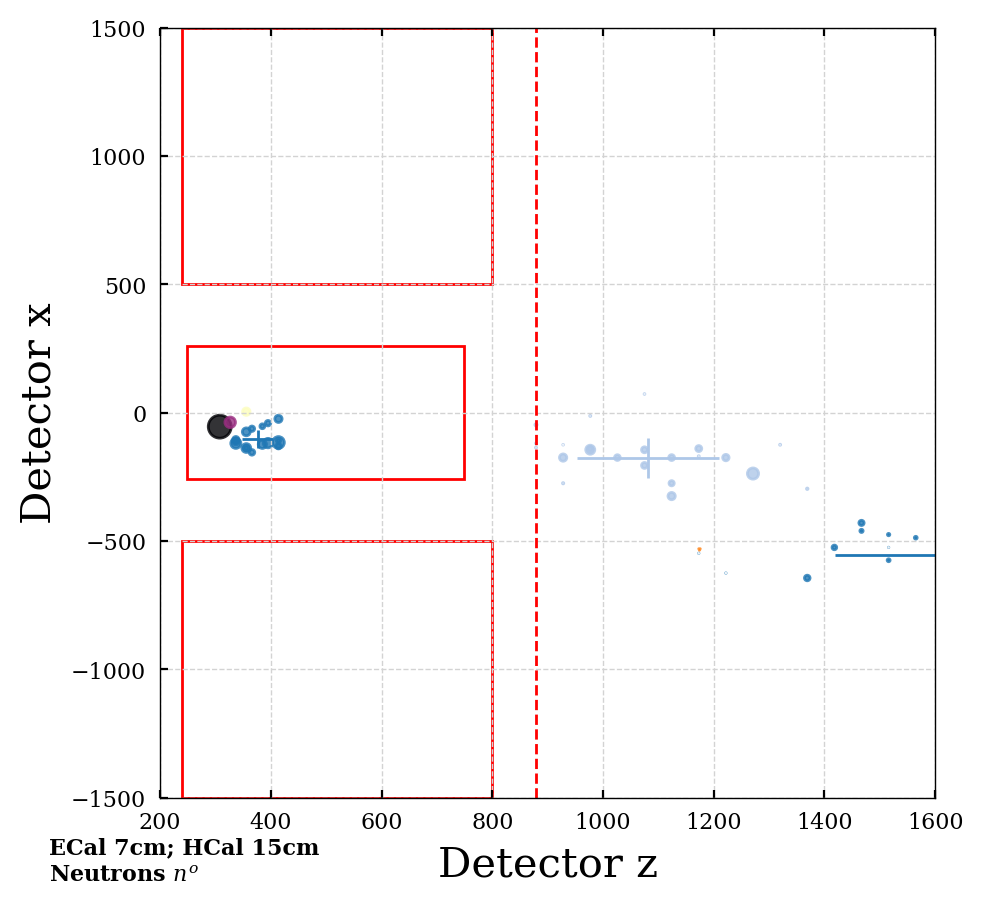

# of clust: 0
# particle: 9837


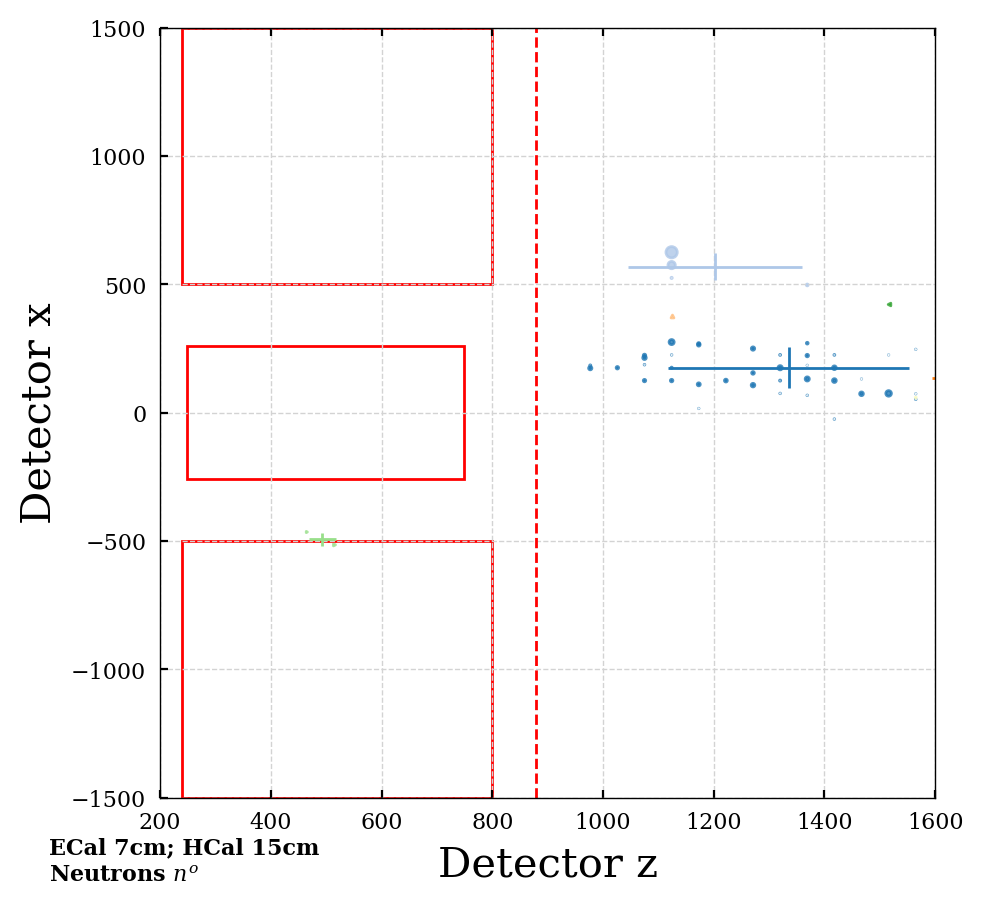

# of clust: 2
# particle: 60


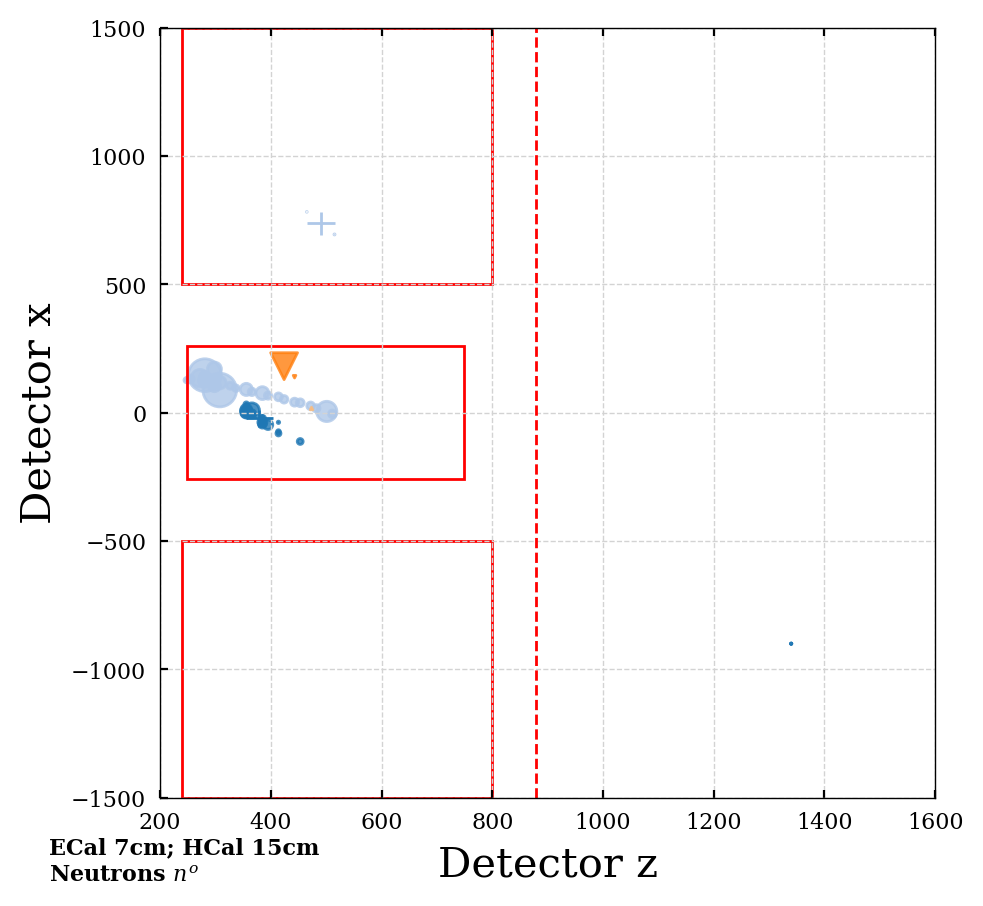

# of clust: 1
# particle: 8875


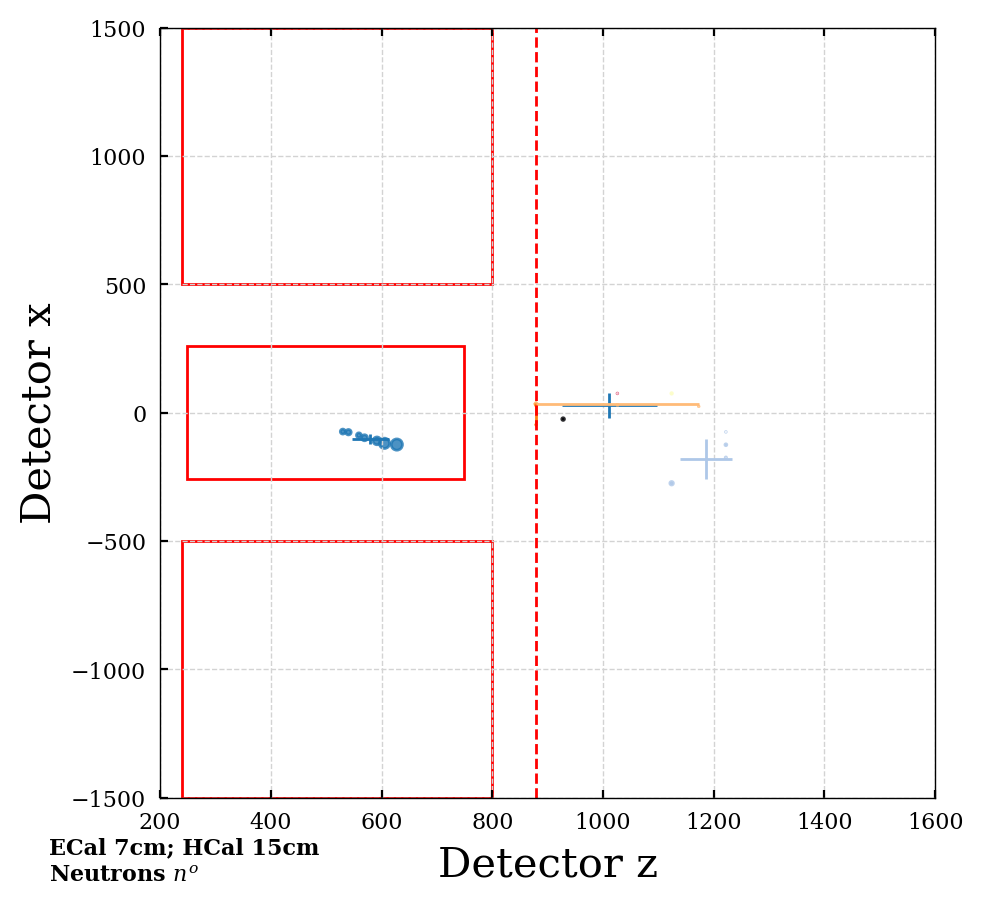

# of clust: 1
# particle: 6700


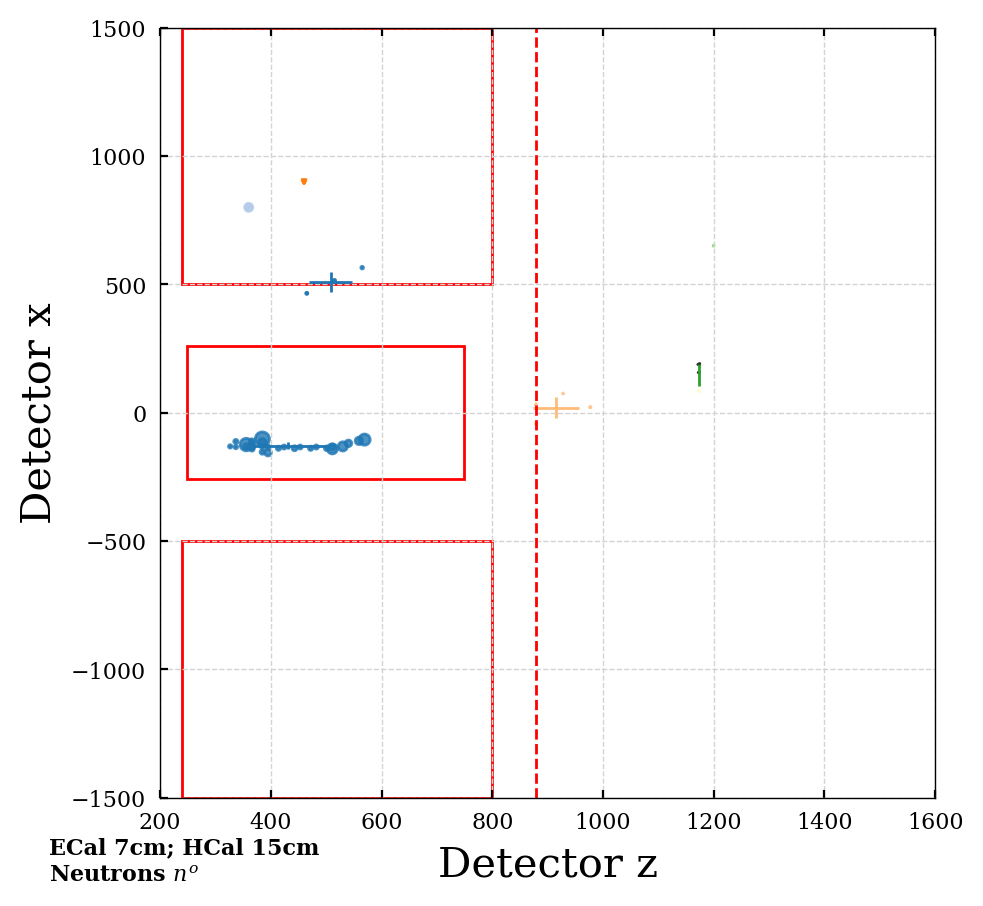

# of clust: 1
# particle: 5941


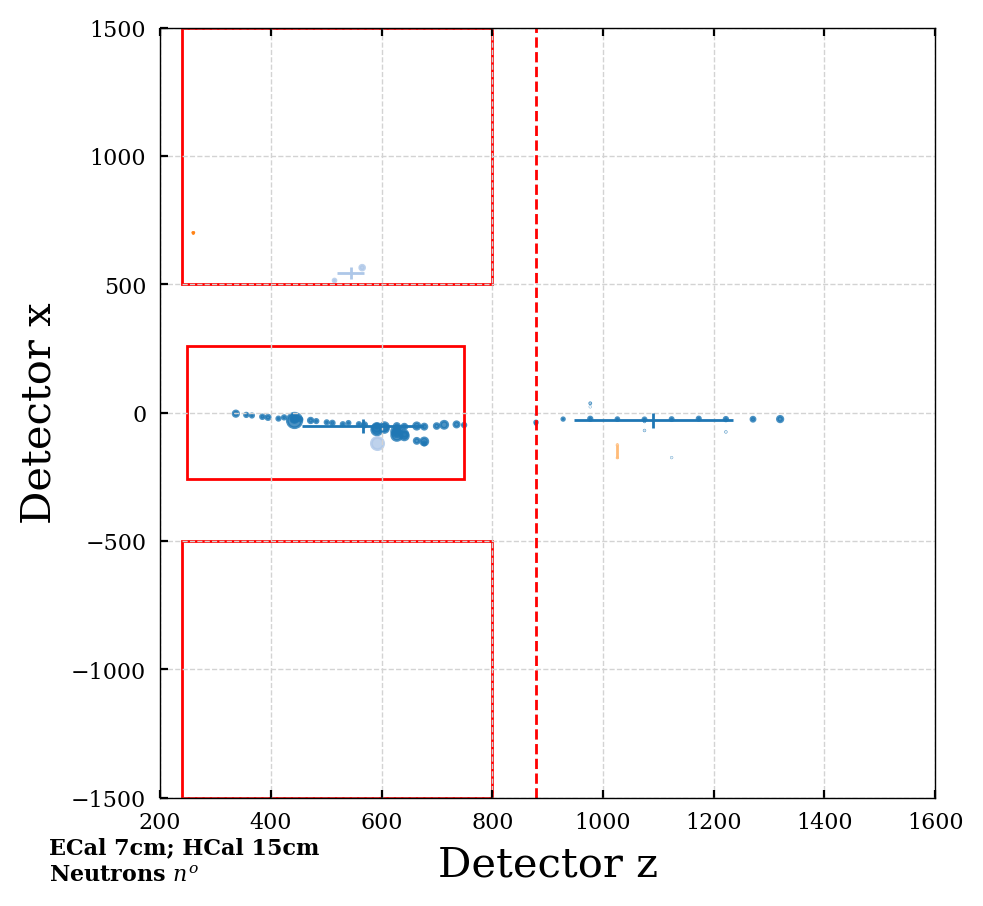

In [29]:
plot_cluster_dist(particles_dict, spec_part='neutrons', ipart=None, xlim=3000, ylim=1500, angle_label=False)
# randomly select events
for ipart in np.random.randint(0, high=1e4, size=10, dtype=int):
    plot_cluster_dist(particles_dict, spec_part='neutrons', ipart=ipart, xlim=1600, ylim=1500, angle_label=False)

### Protons

# of clust: 3
# particle: 2543


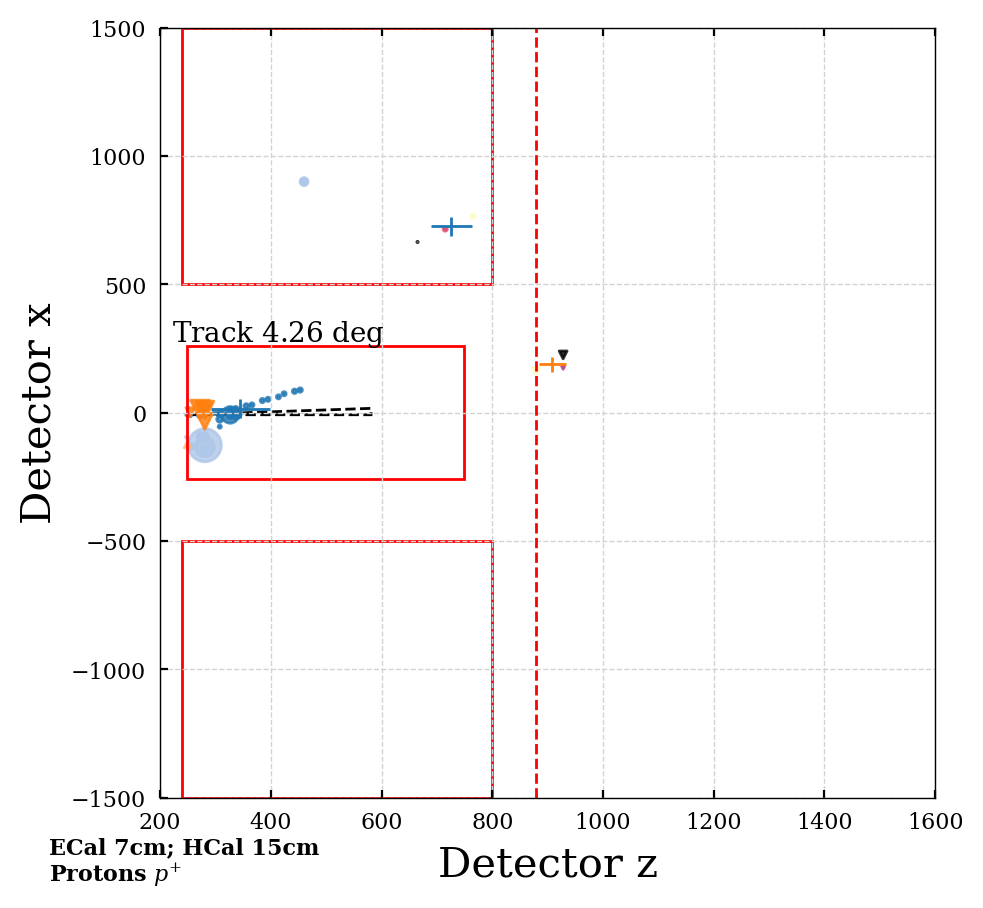

# of clust: 1
# particle: 290


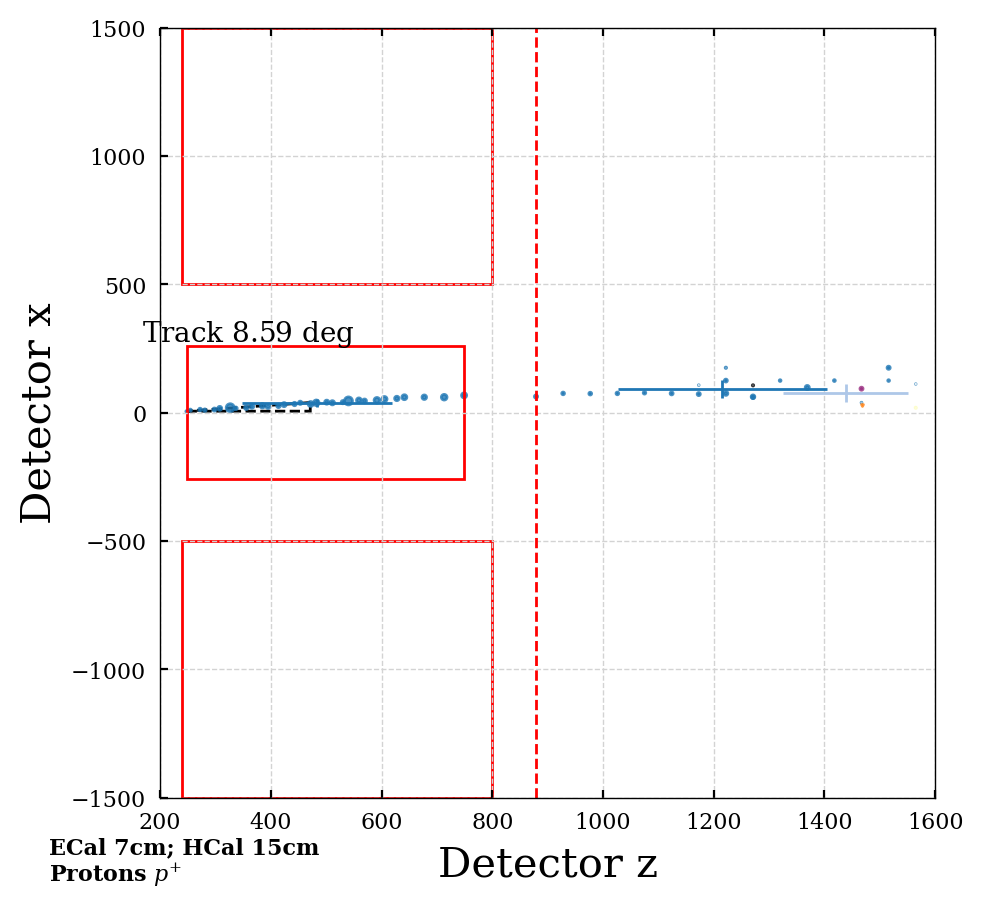

# of clust: 1
# particle: 8868


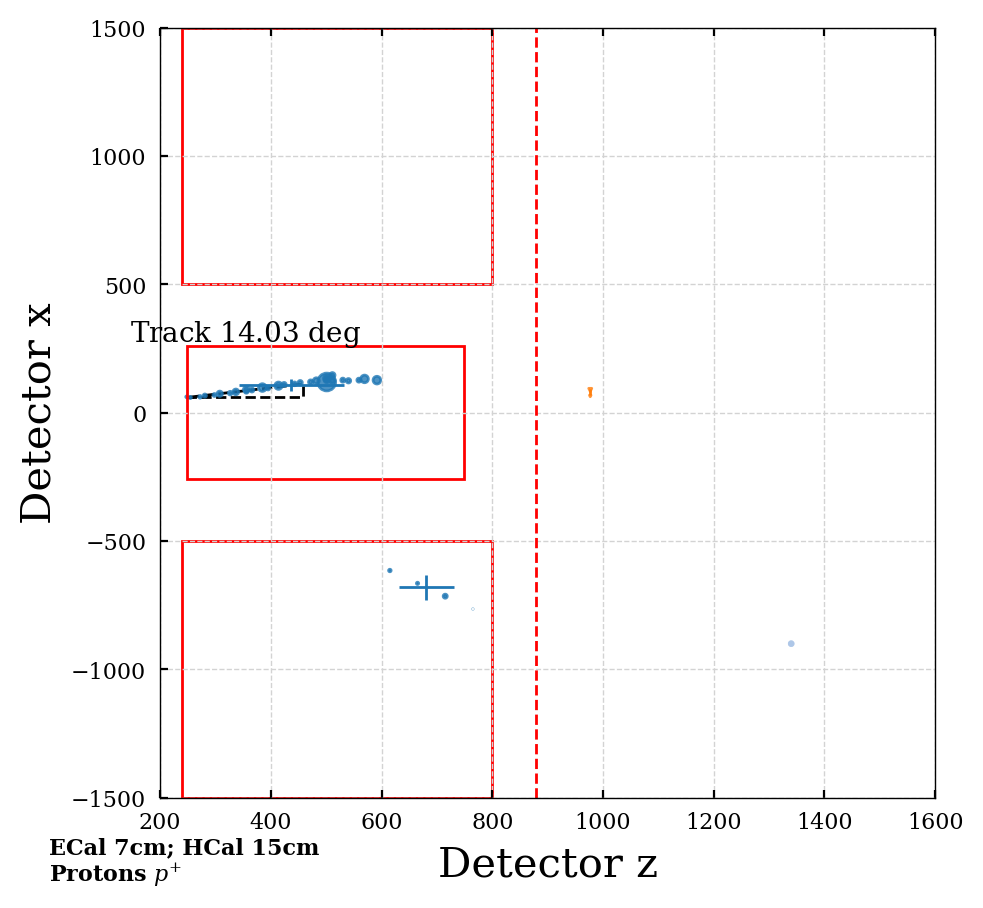

# of clust: 1
# particle: 2953


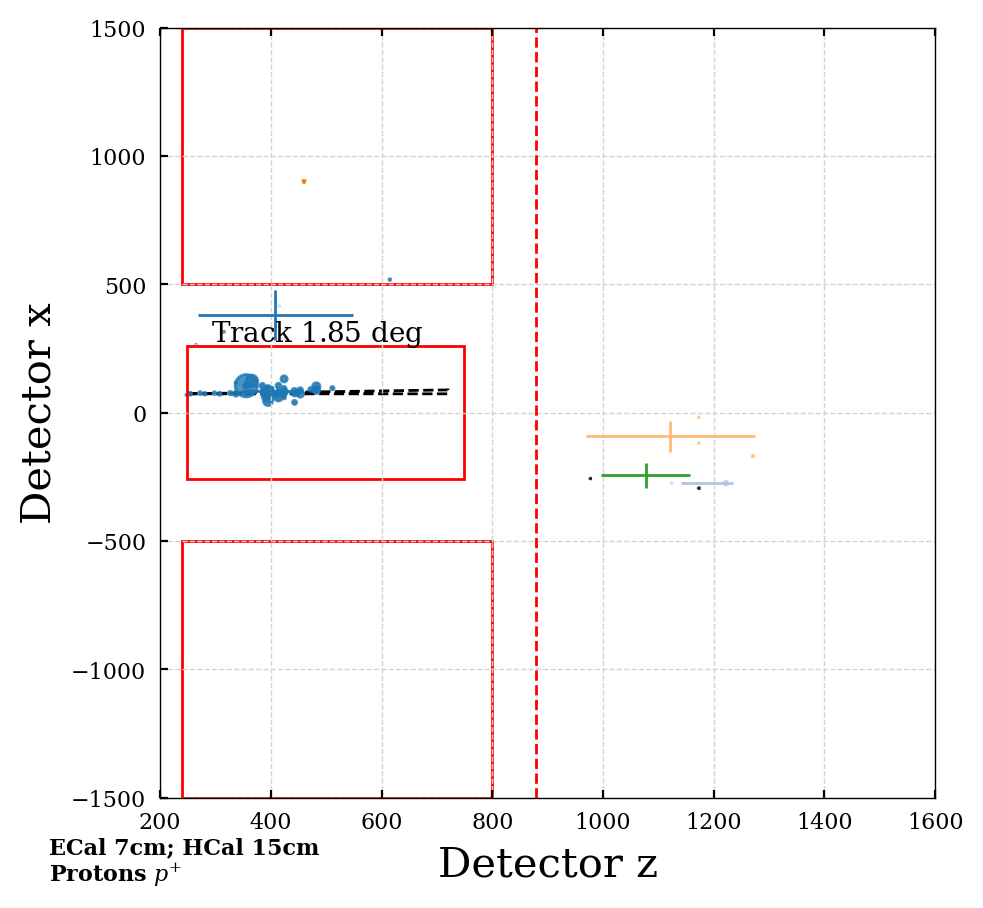

# of clust: 1
# particle: 589


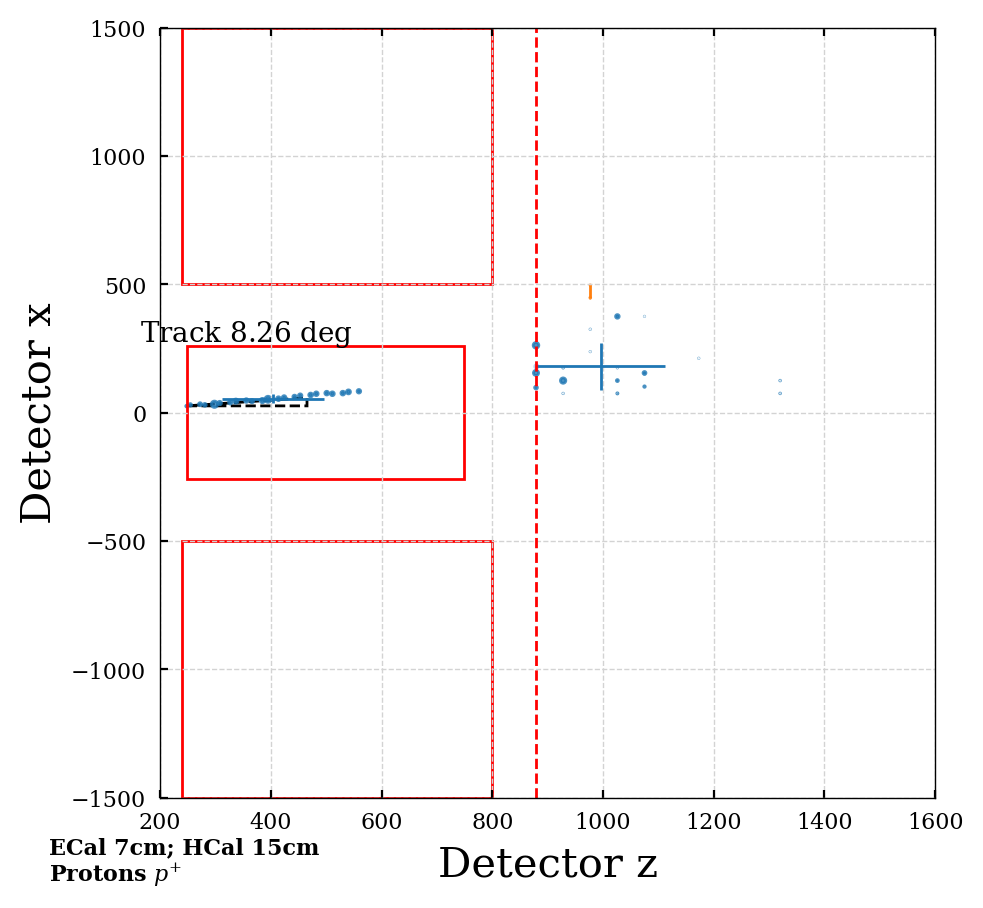

# of clust: 1
# particle: 9952


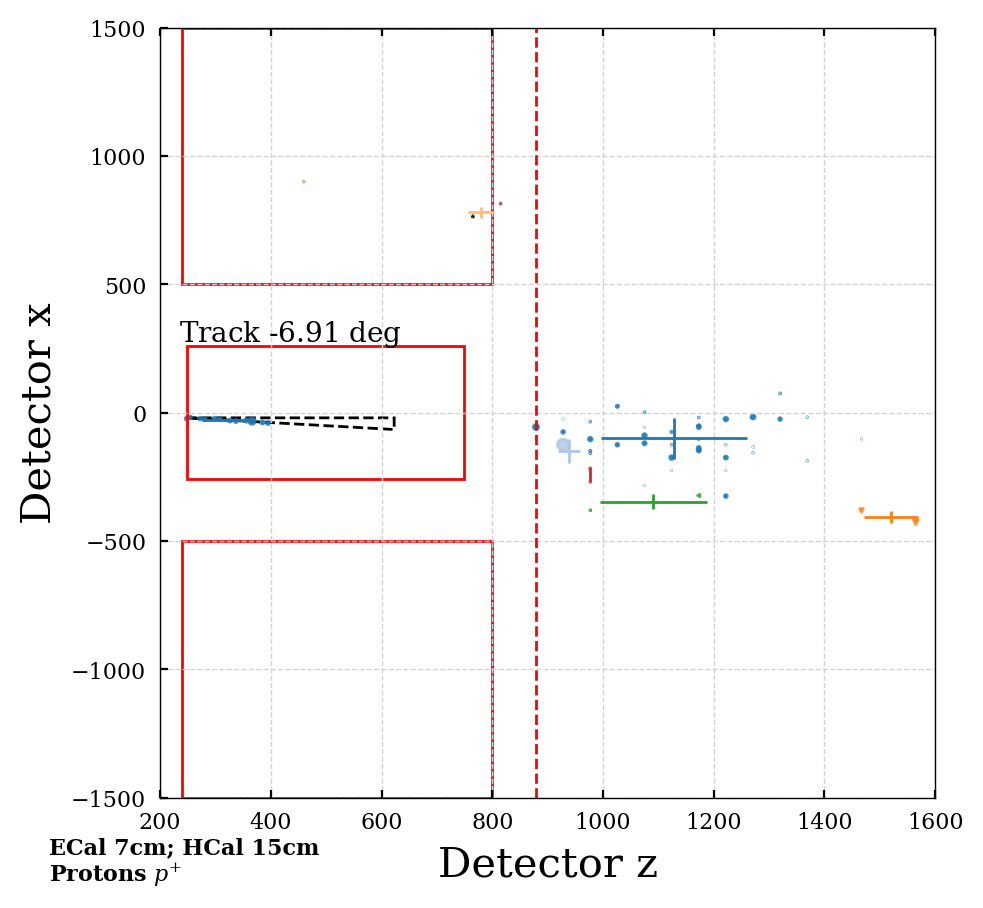

# of clust: 1
# particle: 8827


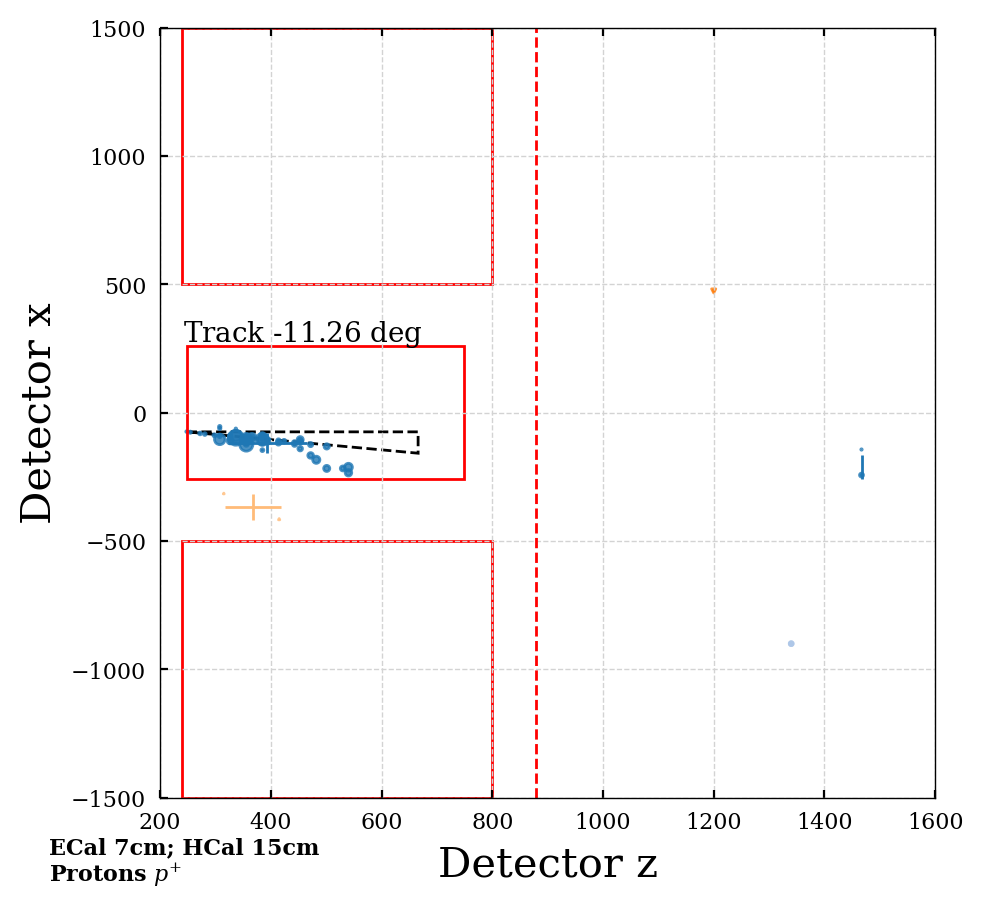

# of clust: 0
# particle: 3893


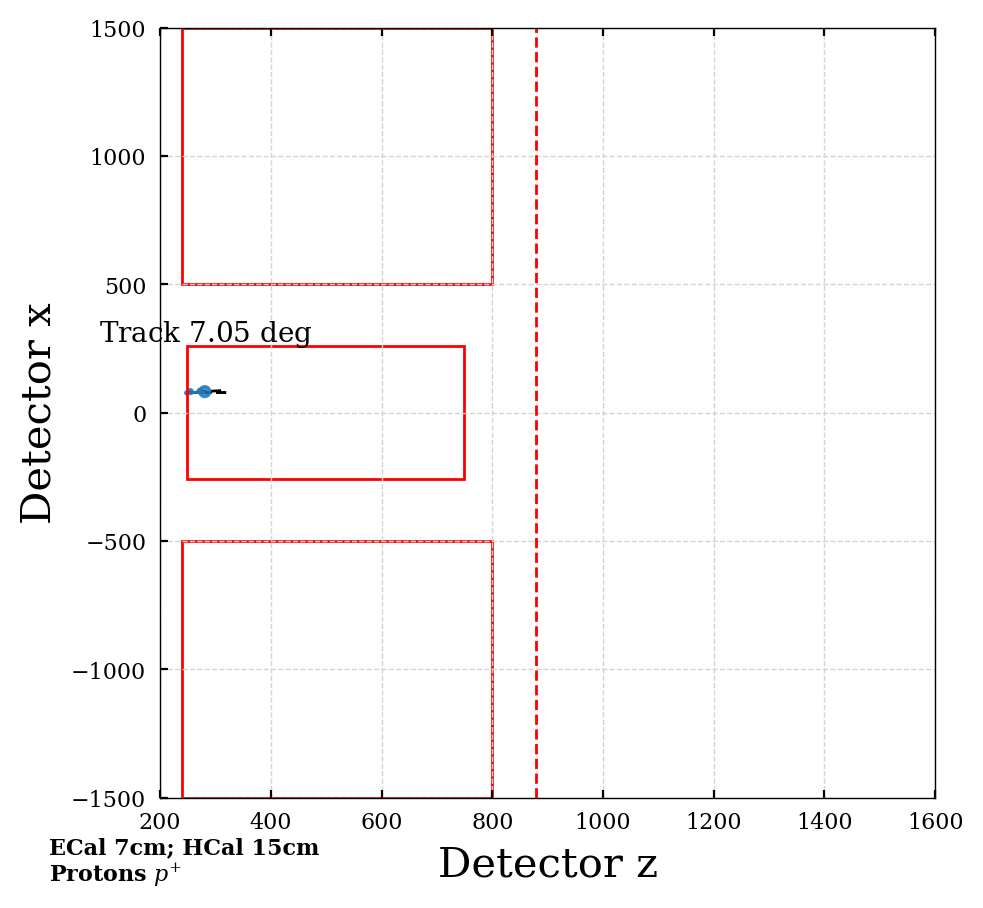

# of clust: 1
# particle: 1733


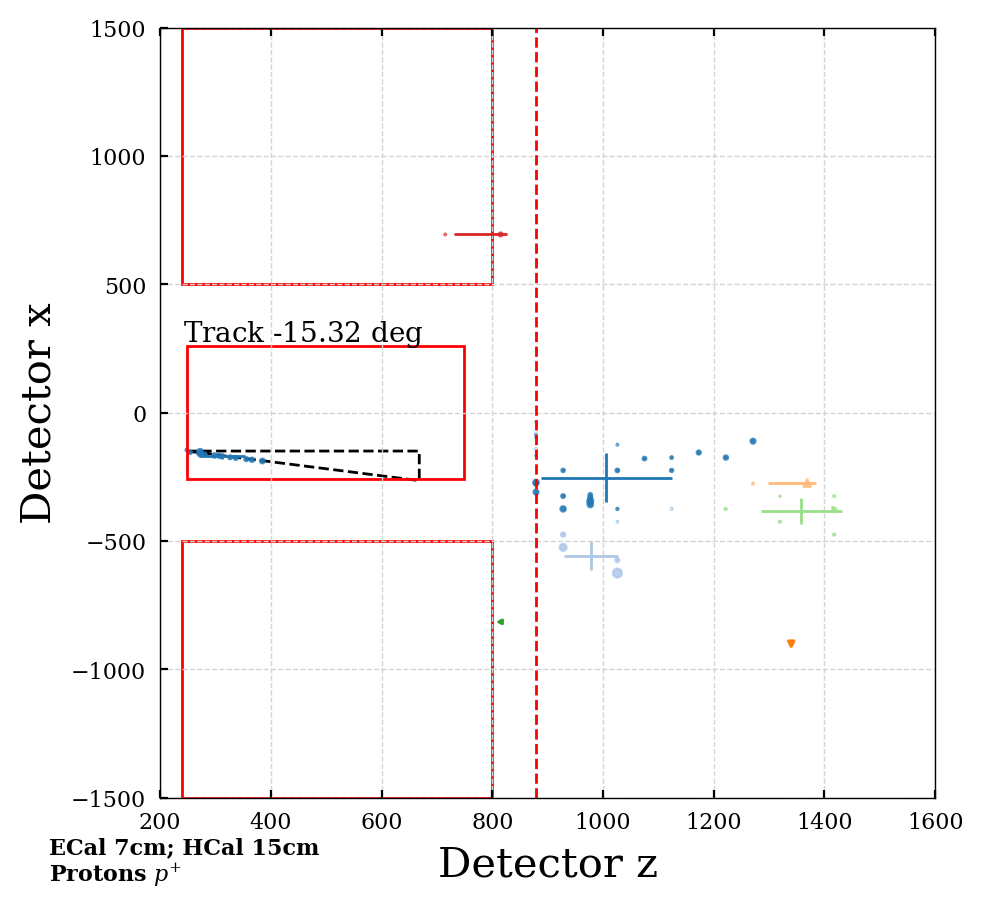

# of clust: 1
# particle: 4017


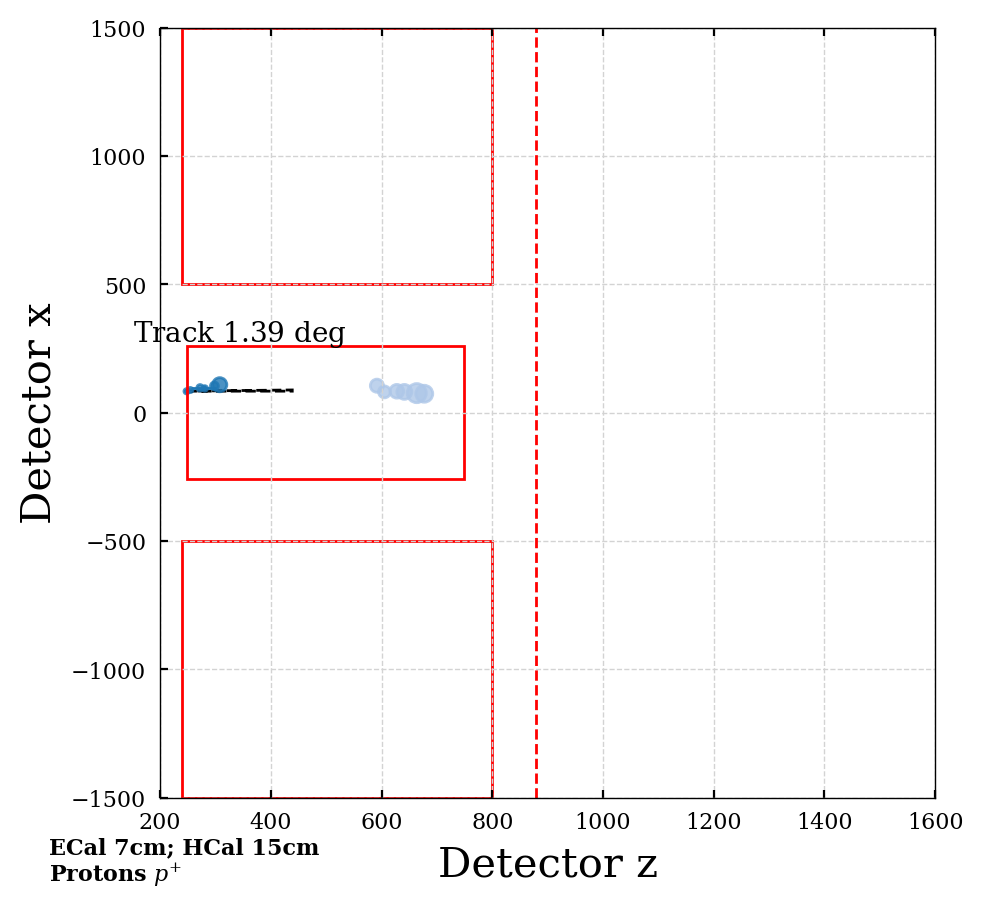

# of clust: 1
# particle: 1182


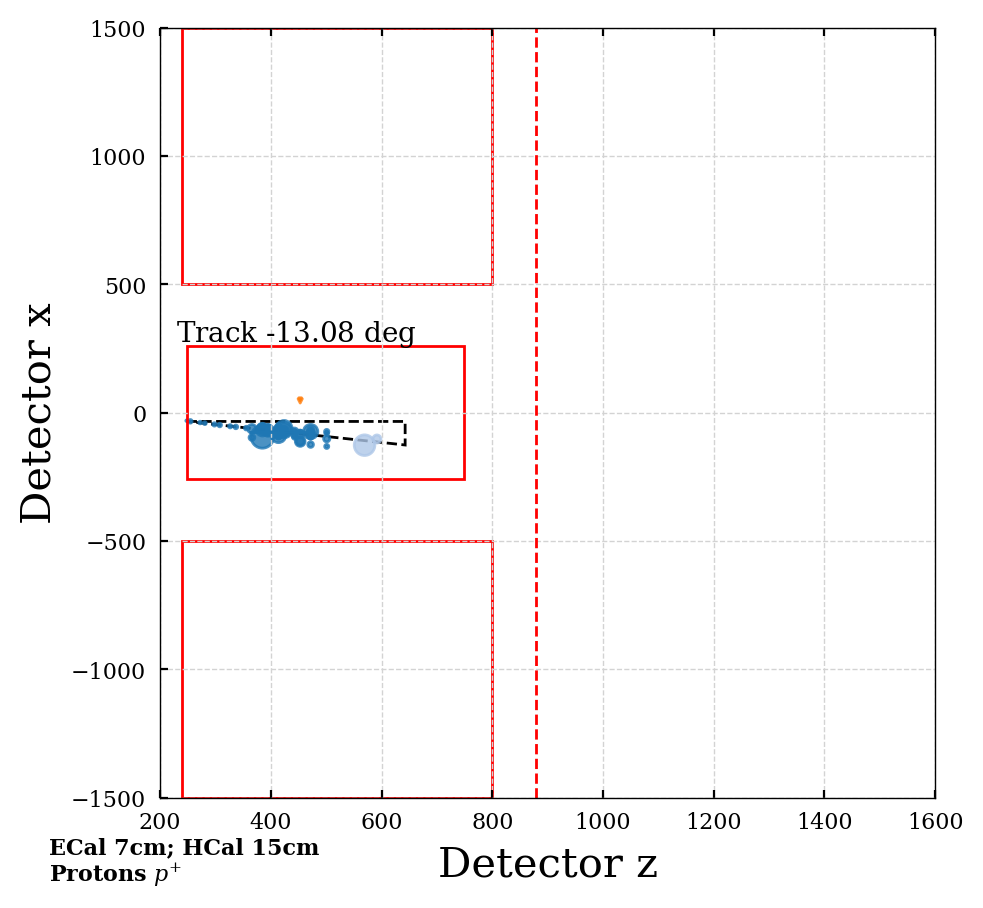

In [30]:
plot_cluster_dist(particles_dict, spec_part='protons', ipart=None, xlim=1600, ylim=1500, angle_label=False)
# randomly select events
for ipart in np.random.randint(0, high=1e4, size=10, dtype=int):
    plot_cluster_dist(particles_dict, spec_part='protons', ipart=ipart, xlim=1600, ylim=1500, angle_label=False)

# Energy Proportion of Cluster / Calorimeter

## Particle Energy Comparison

In [31]:
part = 'neutrons'

In [32]:
list(particles_dict[part].propdict.keys())

['EcalTotalEnergy',
 'HcalTotalEnergy',
 'PFTruth/PFTruth.second.vertexVolume_',
 'PFEcalClusters_hitIDs',
 'PFEcalClusters_energy_lc',
 'PFEcalClusters_energy',
 'PFEcalClusters_nHits_lc',
 'PFEcalClusters_nHits',
 'PFEcalClusters_centroidX_lc',
 'PFEcalClusters_centroidX',
 'PFEcalClusters_centroidY_lc',
 'PFEcalClusters_centroidY',
 'PFEcalClusters_centroidZ_lc',
 'PFEcalClusters_centroidZ',
 'PFEcalClusters_rmsX_lc',
 'PFEcalClusters_rmsX',
 'PFEcalClusters_rmsY_lc',
 'PFEcalClusters_rmsY',
 'PFEcalClusters_rmsZ_lc',
 'PFEcalClusters_rmsZ',
 'PFEcalClusters_DXDZ',
 'PFEcalClusters_DYDZ',
 'PFEcalClusters_errDXDZ',
 'PFEcalClusters_errDYDZ',
 'PFEcalClusters_hitX_lc',
 'PFEcalClusters_hitX',
 'PFEcalClusters_hitY_lc',
 'PFEcalClusters_hitY',
 'PFEcalClusters_hitZ_lc',
 'PFEcalClusters_hitZ',
 'PFEcalClusters_hitE_lc',
 'PFEcalClusters_hitE',
 'PFHcalClusters_hitIDs',
 'PFHcalClusters_energy_lc',
 'PFHcalClusters_energy',
 'PFHcalClusters_nHits_lc',
 'PFHcalClusters_nHits',
 'PFHcalC

In [33]:
# lead cluster energy
r = particles_dict[part].get('PFHcalClusters_energy_lc')
np.nansum(r)/1e4, r

(57.661666870579126,
 array([123.86598969,  39.53575134,          nan, ..., 156.82804871,
         18.11854172,  13.97999954]))

In [34]:
# raw energy
r = particles_dict[part].get('PFCandidates_hcalEnergy')
np.nansum(r)/1e4, r

(80.723275,
 <Array [[124, 11.3, 4.13, 2.1, 1.33], ..., [...]] type='10000 * var * ?float32'>)

In [35]:
# all good cluster energy
good_mask = particles_dict[part].get('PFHcalClusters_nHits') >= 7
all_erg = particles_dict[part].get('PFHcalClusters_energy')
r = np.array([np.nansum(_) for _ in all_erg[good_mask]])
r[r == 0] = np.nan
np.nansum(r)/1e4, r

(52.6878072965622,
 array([123.86598969,  39.53575134,          nan, ..., 156.82804871,
                 nan,  13.97999954]))

In [36]:
# all cluster energy
all_erg = particles_dict[part].get('PFHcalClusters_energy')
r = np.array([np.nansum(_) for _ in all_erg])
r[r == 0] = np.nan
np.nansum(r)/1e4, r

(75.21106157314851,
 array([142.78054929,  46.23478347,          nan, ..., 167.20242319,
         20.11990762,  37.0881176 ]))

In [37]:
# hcal total energy
r = particles_dict[part].get('HcalTotalEnergy')
r[r == 0] = np.nan
np.nansum(r)/1e4, r

(84.1731,
 array([165.00807  ,  61.425213 ,   3.1636932, ..., 170.3288   ,
         22.87178  ,  40.86175  ], dtype=float32))

In [38]:
# hcal total energy
r = particles_dict[part].get('PFHcalClusters_energy_lc_corr')
r[r == 0] = np.nan
np.nansum(r)/1e4, r

(485.69771586914396,
 array([1043.94695831,  333.20871584,           nan, ..., 1321.75236189,
         152.7037128 ,  117.82393243]))

In [39]:
# hcal truth energy
r = particles_dict[part].get('PFTruthHcal_energy')
r[r == 0] = np.nan
np.nansum(r)/1e4, r

(290.95478844311526,
 array([          nan,           nan,           nan, ..., 2014.08697266,
                  nan,           nan]))

## Cluster Energy Proportion

In [40]:
def plot_cluster_erg(particles_dict=particles_dict, which_cal='ecal', which_tot='cal', min_sep=7, figsize=(5, 3), cmap='tab10', fs=8, ylim=100, text=True):
    fig, ax = plt.subplots(figsize=figsize, dpi=200)
    ax.grid(visible=False)
    ax.grid(visible=False)
    labels_list = []

    # color map
    from matplotlib import cm
    full_cmap = cm.get_cmap('tab10')
    color_list = [full_cmap(i)[:3] for i in range(full_cmap.N)]*10
    
    for i, particles in enumerate(particles_name_list):
        # for each particle in the list
        # total energy
        if which_tot == 'cal':  # total energy in the calorimeter
            tot_erg = particles_dict[particles].get('EcalTotalEnergy_corr') if which_cal=='ecal' else particles_dict[particles].get('HcalTotalEnergy_corr')
        else:  # 
            tot_erg = particles_dict[particles].get('PFTruthEcal_energy') if which_cal=='ecal' else particles_dict[particles].get('PFTruthHcal_energy')

        # sum of energy
        sum_erg = particles_dict[particles].get('PFEcalClusters_energy_sum_corr') if which_cal=='ecal' else particles_dict[particles].get('PFHcalClusters_energy_sum_corr')
        # good cluster energy
        good_erg = particles_dict[particles].get('PFEcalClusters_energy_gc_corr')  if which_cal=='ecal' else particles_dict[particles].get('PFHcalClusters_energy_gc_corr')

        avg_frac_sum = np.nanmean(sum_erg/tot_erg)
        std_frac_sum = np.nanstd(sum_erg/tot_erg)

        avg_frac_good = np.nanmean(good_erg/tot_erg)
        std_frac_good = np.nanstd(good_erg/tot_erg)
        
        labels_list.append(labels_dict[particles])

        ax.bar(i, avg_frac_good * 100, yerr=std_frac_good*100, color=color_list[i], ec='black', lw=0.2, capsize=10, error_kw={'elinewidth':0.5,'capthick':0.5}, align='center', width=1, alpha=0.8)
        ax.bar(i, avg_frac_sum * 100, color=color_list[i], ec='black', lw=0.2, align='center', width=1, alpha=0.2)

        if text:
            ax.text(i, 15, f'{avg_frac_sum * 100:.1f}', ha="center", va="bottom", fontsize=10)
            ax.text(i, 10, r'$\Uparrow$', ha="center", va="bottom", fontsize=10)
            ax.text(i, 5, f'{avg_frac_good * 100:.1f}', ha="center", va="bottom", fontsize=10)

    ax.text(i+1.5, 15, 'ALL%', ha="center", va="bottom", fontsize=10)
    ax.text(i+1.5, 10, r'$\Uparrow$', ha="center", va="bottom", fontsize=10)
    ax.text(i+1.5, 5, 'GOOD%', ha="center", va="bottom", fontsize=10)

    if which_tot == 'cal':
        ax.text(i+1.5, 0, f'of {which_cal} erg', ha="center", va="bottom", fontsize=10)
    else:
        ax.text(i+1.5, 0, 'of truth erg', ha="center", va="bottom", fontsize=10)

    ax.annotate(text=f'{min_sep}cm {which_cal.capitalize()} samples', xy=(-50, -20), xycoords='axes points', fontsize=8, weight='bold')
    ax.set_ylim(0, ylim)
    ax.set_xticks(range(len(particles_name_list)))
    ax.set_xticklabels(labels_list, fontsize=8)
    ax.set_xlabel('Particles', fontsize=10)
    ax.set_ylabel('% of energy in GOOD & ALL clust', fontsize=10)

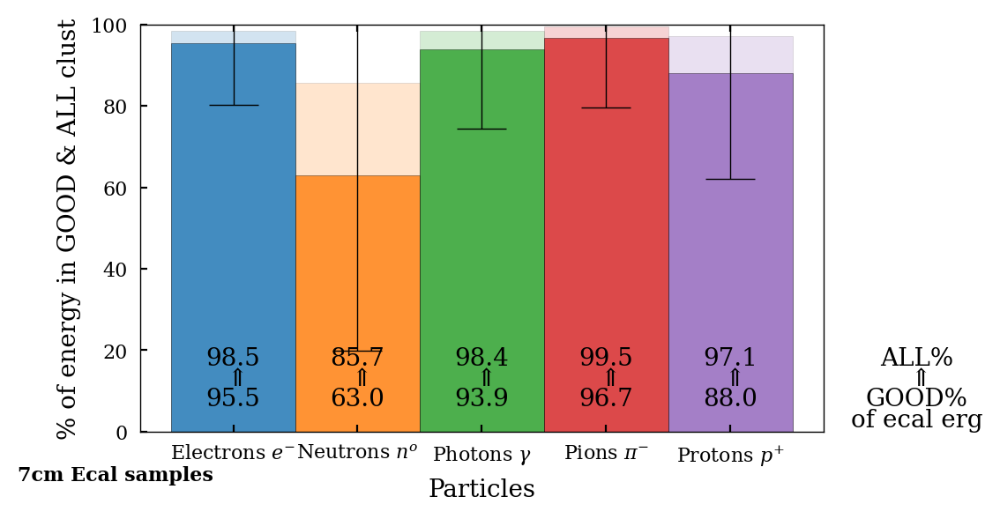

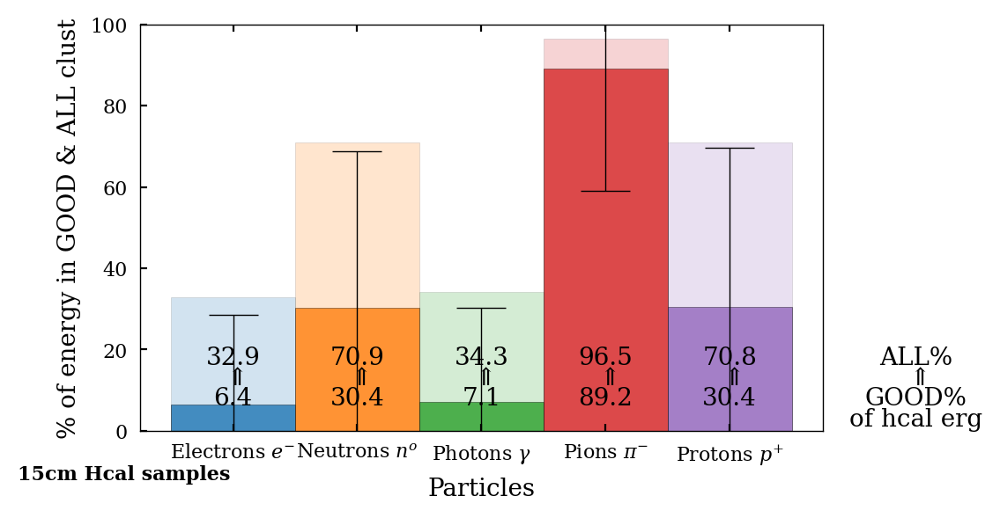

In [41]:
plot_cluster_erg(particles_dict, 'ecal', 'cal', 7, (5, 3), 'tab10', fs=5)
plot_cluster_erg(particles_dict, 'hcal', 'cal', 15, (5, 3), 'tab10', fs=5)
plt.show()

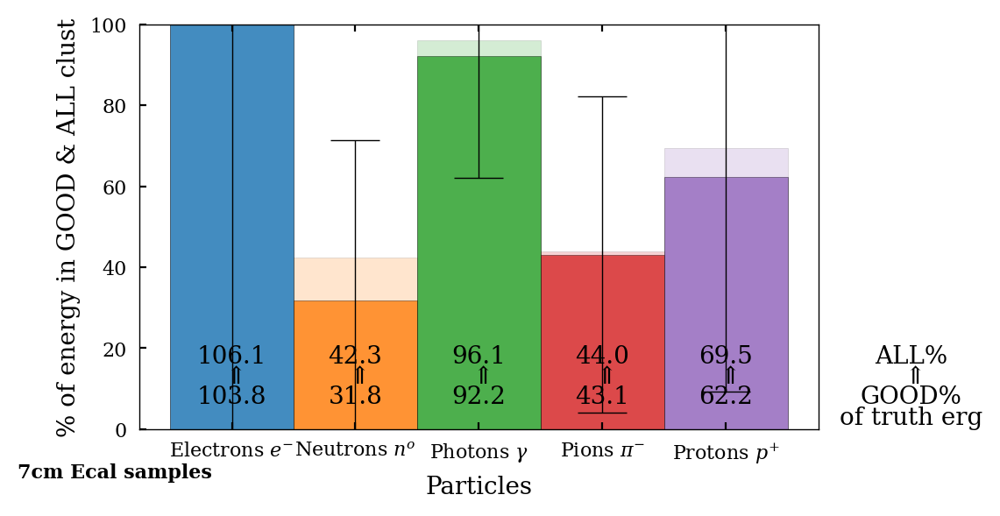

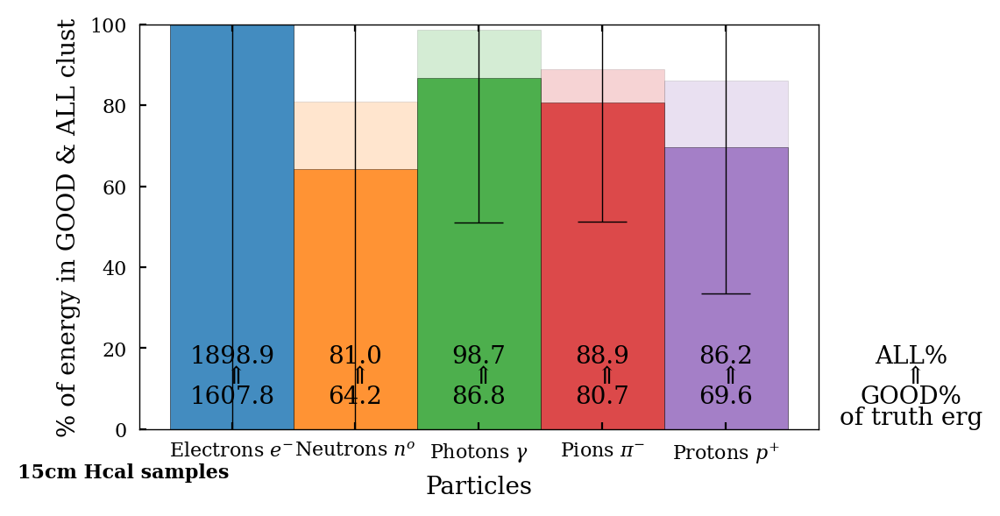

In [42]:
plot_cluster_erg(particles_dict, 'ecal', 'tru', 7, (5, 3), 'tab10', fs=5)
plot_cluster_erg(particles_dict, 'hcal', 'tru', 15, (5, 3), 'tab10', fs=5)
plt.show()

# Tally Statistics

In [43]:
list(particles_dict['electrons'].propdict.keys())

['EcalTotalEnergy',
 'HcalTotalEnergy',
 'PFTruth/PFTruth.second.vertexVolume_',
 'PFEcalClusters_hitIDs',
 'PFEcalClusters_energy_lc',
 'PFEcalClusters_energy',
 'PFEcalClusters_nHits_lc',
 'PFEcalClusters_nHits',
 'PFEcalClusters_centroidX_lc',
 'PFEcalClusters_centroidX',
 'PFEcalClusters_centroidY_lc',
 'PFEcalClusters_centroidY',
 'PFEcalClusters_centroidZ_lc',
 'PFEcalClusters_centroidZ',
 'PFEcalClusters_rmsX_lc',
 'PFEcalClusters_rmsX',
 'PFEcalClusters_rmsY_lc',
 'PFEcalClusters_rmsY',
 'PFEcalClusters_rmsZ_lc',
 'PFEcalClusters_rmsZ',
 'PFEcalClusters_DXDZ',
 'PFEcalClusters_DYDZ',
 'PFEcalClusters_errDXDZ',
 'PFEcalClusters_errDYDZ',
 'PFEcalClusters_hitX_lc',
 'PFEcalClusters_hitX',
 'PFEcalClusters_hitY_lc',
 'PFEcalClusters_hitY',
 'PFEcalClusters_hitZ_lc',
 'PFEcalClusters_hitZ',
 'PFEcalClusters_hitE_lc',
 'PFEcalClusters_hitE',
 'PFHcalClusters_hitIDs',
 'PFHcalClusters_energy_lc',
 'PFHcalClusters_energy',
 'PFHcalClusters_nHits_lc',
 'PFHcalClusters_nHits',
 'PFHcalC

In [44]:
# tally the statistics

ecal_nClusters, hcal_nClusters, ecal_good_erg, hcal_good_erg, sum_good_erg = [], [], [], [], []

ufunc = np.mean
for part in particles_name_list:
    # number of goood/all clusters
    ecal_nClusters.append(
        f"{ufunc(particles_dict[part].get('PFEcalClusters_good_count')):.2f}/{ufunc(particles_dict[part].get('PFEcalClusters_count')):.2f}"
    )
    hcal_nClusters.append(
        f"{ufunc(particles_dict[part].get('PFHcalClusters_good_count')):.2f}/{ufunc(particles_dict[part].get('PFHcalClusters_count')):.2f}"
    )
    
    # good cluster energy
    ecal_good_erg.append(ufunc(particles_dict[part].get('PFEcalClusters_energy_gc_corr')))
    hcal_good_erg.append(ufunc(particles_dict[part].get('PFHcalClusters_energy_gc_corr')))
    sum_good_erg.append(ufunc(particles_dict[part].get('PFEcalClusters_energy_gc_corr')) + ufunc(particles_dict[part].get('PFHcalClusters_energy_gc_corr')))

data = {'Particle ID': particles_name_list,
        'Number of ECal clusters': ecal_nClusters,
        'Number of HCal clusters': hcal_nClusters,
        'ECal good cluster energy [MeV]': ecal_good_erg,
        'HCal good cluster energy [MeV]': hcal_good_erg,
        'Total good cluster energy [MeV]': sum_good_erg}
tally_df = pd.DataFrame(data)
pd.set_option('display.precision', 2)
tally_df

,Particle ID,Number of ECal clusters,Number of HCal clusters,ECal good cluster energy [MeV],HCal good cluster energy [MeV],Total good cluster energy [MeV]
0,electrons,0.97/1.34,0.05/0.43,1917.07,30.06,1947.13
1,neutrons,0.57/1.05,0.50/3.35,745.03,443.78,1188.81
2,photons,0.95/1.32,0.06/0.45,1895.99,32.39,1928.37
3,pions,0.97/1.01,0.79/0.99,583.29,1656.42,2239.70
4,protons,0.96/1.34,0.41/2.79,1079.81,383.39,1463.20


In [45]:
e = particles_dict['neutrons'].get('PFEcalClusters_good_count')
h = particles_dict['neutrons'].get('PFHcalClusters_count')

np.sum(np.logical_and(e!=0, h!=0)), np.sum(np.logical_and(e!=0, h==0)), np.sum(np.logical_and(e==0, h!=0)), np.sum(np.logical_and(e==0, h==0))

(4778, 698, 3769, 755)

In [46]:
# good cluster criteria needs to be implemented in C code
# show that dimensions of cluster masks are different from dimensions of PIDs
comb_mask = ak.concatenate([
    particles_dict['protons'].get('PFEcalClusters_good_mask'), particles_dict['protons'].get('PFHcalClusters_good_mask')
], axis=1)
for a, b in zip(particles_dict['protons'].get('PFCandidates_pid'), comb_mask):
    print(len(a) - len(b))

-1
-1
0
-1
-1
-1
-1
0
-1
-1
-1
0
-1
-1
0
0
-1
-1
-1
-1
-2
-1
-1
-1
-1
-1
0
-1
-1
-1
-2
0
-1
0
-1
-1
-1
-1
0
-1
-1
-1
0
-1
-1
0
0
-1
-1
-1
-1
-1
0
-1
-2
-1
-1
0
-1
-1
-1
-1
-1
0
-1
-1
-1
-1
-1
-1
-1
0
1
-1
-1
-1
0
0
-1
0
-1
0
0
-1
-1
-1
0
-1
0
-1
-1
-1
-1
-1
-1
-1
-1
-1
0
-1
-2
-1
-1
-1
-1
0
0
-1
0
-1
0
-1
-1
0
-1
-1
-1
-1
0
-1
-1
-1
-1
0
-2
0
-1
0
0
-2
-1
-1
-1
-1
-1
-1
0
1
-1
-1
-1
-1
-1
-1
0
-1
-1
-2
-1
-1
-1
-2
-1
-1
0
-1
0
-1
-1
0
-1
-1
0
-1
0
0
-1
0
-1
-1
-1
0
0
0
-1
-2
0
-1
-1
-1
-1
-1
-1
-1
0
-1
-1
-1
0
-1
-1
-1
-1
-1
-1
-1
-1
-1
-1
0
0
-1
-1
0
0
-1
-1
0
-1
-2
-1
-1
0
-1
-1
-1
0
-1
-1
-1
-1
-1
-1
0
-1
-1
-1
-1
-1
-2
-1
-1
-1
-1
-1
-1
0
-1
-1
-1
0
-1
-1
-1
-1
-1
-1
-1
0
0
-1
-1
0
-1
-1
-1
-1
-1
-1
-1
-1
-1
-1
-1
-1
-1
-1
-1
0
0
0
-1
-1
0
-1
-1
0
0
-1
-1
-1
-1
-1
-1
-1
-1
-1
-1
-1
0
-1
-1
-1
-1
0
-1
0
-1
0
0
0
-1
-1
-1
-1
0
-1
0
-1
-1
-1
-1
-1
-1
0
-1
-1
-1
-1
0
-1
-1
-1
-1
0
-1
0
-1
-1
-1
-1
-1
-1
-1
0
-1
-1
-1
-1
-1
-1
-1
-1
-1
-1
0
-1
-1
0
-1
-1
-1
-1
-1
-1
0
-1
-1
0
0
-1
-1
0


In [47]:
particles_dict['protons'].get('PFHcalClusters_energy_corr')

<Array [[48.8, 28.3, 22, ..., 10.8, 1.52], ...] type='10000 * var * ?float64'>

## Investigating tracks & photons

In [48]:
lengths = []
for _ in particles_dict['photons'].get('PFCandidates_pid'):
    print(_)
    lengths.append(len(_))
np.unique(lengths, return_counts=True)

[2, 4]
[2]
[2]
[2]
[2]
[2]
[4]
[2]
[2]
[2]
[2]
[2, 2, 4]
[2, 2]
[2, 2]
[6, 4, 4]
[2, 2]
[2, 2]
[2, 2]
[2, 2]
[6, 4, 4, 4, 4, 4, 4]
[2, 2, 4]
[2]
[2, 2]
[2]
[2]
[2]
[2, 2]
[2]
[2, 4]
[2]
[2]
[2]
[2]
[2]
[2, 2]
[2]
[2]
[2]
[2]
[2]
[2]
[6, 6, 4]
[2]
[2]
[2]
[2, 2, 2]
[2, 4, 4, 4]
[6]
[2, 2, 2]
[2, 2, 4]
[2]
[2]
[2, 4]
[2]
[6, 4, 4, 4]
[2]
[2, 2]
[2, 2, 2]
[2]
[2, 2]
[2, 4]
[2, 2]
[6, 6, 4, 4, 4]
[2, 4]
[2, 2]
[2]
[2]
[2]
[2]
[2, 2]
[2]
[2, 2]
[2, 2]
[2, 2]
[2, 2]
[2]
[6, 4]
[2]
[2, 2]
[2]
[2, 2]
[2, 4]
[2, 2]
[2]
[2]
[2]
[2, 2]
[2, 2]
[2]
[2, 2]
[2, 2, 4, 4]
[2]
[2, 2, 2, 2, 2]
[2, 2, 2]
[2, 4]
[2]
[2, 2, 2]
[2]
[2]
[2, 2]
[2]
[2, 2]
[2]
[2]
[2]
[2]
[2]
[2, 2]
[2, 2, 4]
[2, 4]
[2]
[2, 2]
[2, 2]
[2]
[2]
[2]
[2]
[2]
[2]
[2]
[2]
[2, 2]
[2]
[2, 2, 4]
[2, 2]
[2, 2]
[2]
[2]
[2]
[2]
[2]
[2]
[2]
[2]
[2]
[2, 2]
[2]
[2, 2]
[2, 4]
[2, 2]
[2, 2, 2]
[2]
[2, 2, 4, 4, 4, 4, 4, 4]
[4, 4, 4, 4, 4]
[2]
[2]
[2, 2, 2]
[2, 4]
[2]
[2]
[2, 2, 2]
[2, 2, 4]
[2, 2]
[2]
[2]
[2]
[2, 2, 2]
[2]
[2]
[6]
[2]
[2, 2]
[2, 

(array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 14]),
 array([5466, 2755, 1131,  433,  147,   43,   16,    7,    1,    1]))

In [49]:
particles_dict[part].get('PFCandidates_ecalEnergy')

<Array [[1.56e+03, 0, 0, 0, 0, 0], ...] type='10000 * var * ?float32'>

In [50]:
part = 'pions'
print('ECal clusters'.ljust(20), 'HCal clusters'.ljust(20), 'Candidate PID'.ljust(20))
def int_bin(x):
    return np.binary_repr(x).rjust(3, '0')
for a, b, c, in zip(particles_dict[part].get('PFEcalClusters_centroidZ'), particles_dict[part].get('PFHcalClusters_centroidZ'), particles_dict[part].get('PFCandidates_pid')):
    print(f'{str(a):<20}{str(b):<20}{str(np.vectorize(int_bin)(ak.to_numpy(c))):<20}')

ECal clusters        HCal clusters        Candidate PID       
[376]               [2.16e+03]          ['111']             
[451]               [1.21e+03]          ['111']             
[317]               [None]              ['011']             
[389]               [1.03e+03]          ['111']             
[290]               [1.09e+03]          ['111']             
[505]               [991]               ['111']             
[505]               [None]              ['011']             
[338]               [None]              ['011']             
[355]               [1.76e+03]          ['111']             
[498]               [1.15e+03]          ['011' '100']       
[502]               [1.94e+03, 2.79e+03]['111' '100']       
[390]               [None]              ['011']             
[501]               [1.87e+03, 1.17e+03]['111' '100']       
[521]               [2.03e+03, 1.47e+03]['111' '100']       
[508]               [1.5e+03]           ['111']             
[507]               [1

In [51]:
list(particles_dict['electrons'].propdict.keys())

['EcalTotalEnergy',
 'HcalTotalEnergy',
 'PFTruth/PFTruth.second.vertexVolume_',
 'PFEcalClusters_hitIDs',
 'PFEcalClusters_energy_lc',
 'PFEcalClusters_energy',
 'PFEcalClusters_nHits_lc',
 'PFEcalClusters_nHits',
 'PFEcalClusters_centroidX_lc',
 'PFEcalClusters_centroidX',
 'PFEcalClusters_centroidY_lc',
 'PFEcalClusters_centroidY',
 'PFEcalClusters_centroidZ_lc',
 'PFEcalClusters_centroidZ',
 'PFEcalClusters_rmsX_lc',
 'PFEcalClusters_rmsX',
 'PFEcalClusters_rmsY_lc',
 'PFEcalClusters_rmsY',
 'PFEcalClusters_rmsZ_lc',
 'PFEcalClusters_rmsZ',
 'PFEcalClusters_DXDZ',
 'PFEcalClusters_DYDZ',
 'PFEcalClusters_errDXDZ',
 'PFEcalClusters_errDYDZ',
 'PFEcalClusters_hitX_lc',
 'PFEcalClusters_hitX',
 'PFEcalClusters_hitY_lc',
 'PFEcalClusters_hitY',
 'PFEcalClusters_hitZ_lc',
 'PFEcalClusters_hitZ',
 'PFEcalClusters_hitE_lc',
 'PFEcalClusters_hitE',
 'PFHcalClusters_hitIDs',
 'PFHcalClusters_energy_lc',
 'PFHcalClusters_energy',
 'PFHcalClusters_nHits_lc',
 'PFHcalClusters_nHits',
 'PFHcalC

### Tracks — ECal linking

In [52]:
part = 'electrons'
i = 5
track_x = particles_dict[part].get('PFTracks_x')[i]
track_y = particles_dict[part].get('PFTracks_y')[i]
track_z = particles_dict[part].get('PFTracks_z')[i]
track_dxdz = particles_dict[part].get('PFTracks_px')[i]/particles_dict[part].get('PFTracks_pz')[i]
track_dydz = particles_dict[part].get('PFTracks_py')[i]/particles_dict[part].get('PFTracks_pz')[i]
ecal_centroid_x = particles_dict[part].get('PFEcalClusters_centroidX')[i][0]
ecal_centroid_y = particles_dict[part].get('PFEcalClusters_centroidY')[i][0]
ecal_centroid_z = particles_dict[part].get('PFEcalClusters_centroidZ')[i][0]
ecal_rms_x = particles_dict[part].get('PFEcalClusters_rmsX')[i][0]
ecal_rms_y = particles_dict[part].get('PFEcalClusters_rmsY')[i][0]

ecal_proj_x = track_x + track_dxdz * (ecal_centroid_z - track_z)
ecal_proj_y = track_y + track_dydz * (ecal_centroid_z - track_z)

dist = np.hypot((ecal_proj_x - ecal_centroid_x)/np.max([1.0, ecal_rms_x]),
                (ecal_proj_y - ecal_centroid_y)/np.max([1.0, ecal_rms_y]))
print(dist)

0.13844300983280738


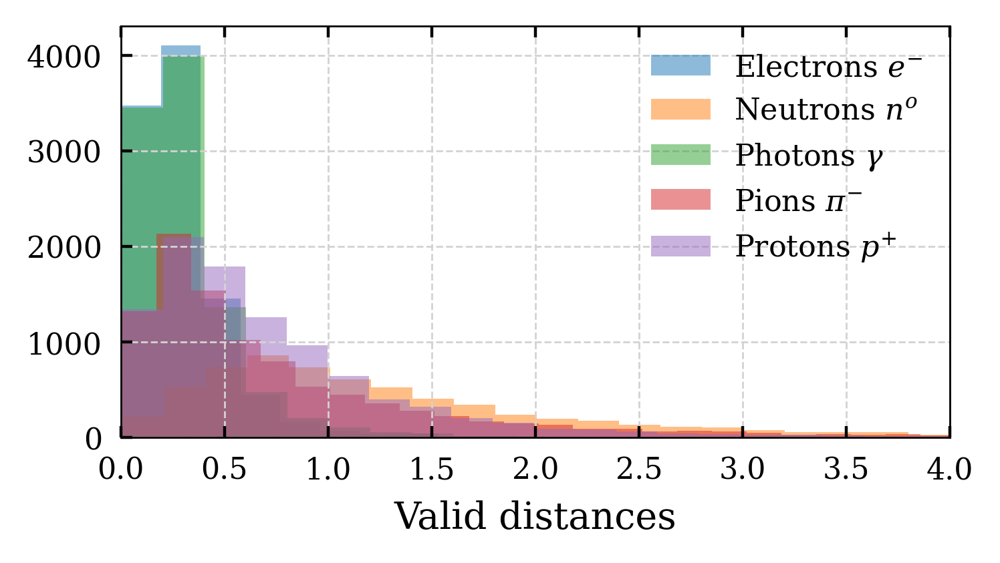

In [53]:
fig, ax = plt.subplots(figsize=(4, 2))
for part in particles_name_list:
    dists = []
    for i in range(10000):
        try:
            track_x = particles_dict[part].get('PFTracks_x')[i]
            track_y = particles_dict[part].get('PFTracks_y')[i]
            track_z = particles_dict[part].get('PFTracks_z')[i]
            track_dxdz = particles_dict[part].get('PFTracks_px')[i]/particles_dict[part].get('PFTracks_pz')[i]
            track_dydz = particles_dict[part].get('PFTracks_py')[i]/particles_dict[part].get('PFTracks_pz')[i]
            ecal_centroid_x = particles_dict[part].get('PFEcalClusters_centroidX')[i][0]
            ecal_centroid_y = particles_dict[part].get('PFEcalClusters_centroidY')[i][0]
            ecal_centroid_z = particles_dict[part].get('PFEcalClusters_centroidZ')[i][0]
            ecal_rms_x = particles_dict[part].get('PFEcalClusters_rmsX')[i][0]
            ecal_rms_y = particles_dict[part].get('PFEcalClusters_rmsY')[i][0]
            
            ecal_proj_x = track_x + track_dxdz * (ecal_centroid_z - track_z)
            ecal_proj_y = track_y + track_dydz * (ecal_centroid_z - track_z)
            
            dist = np.hypot((ecal_proj_x - ecal_centroid_x)/np.max([1.0, ecal_rms_x]),
                            (ecal_proj_y - ecal_centroid_y)/np.max([1.0, ecal_rms_y]))
            dists.append(dist)
        except:
            continue
    dists = np.array(dists)[~np.isnan(dist)]
    ax.hist(dists[dists < 20], alpha=0.5, histtype='stepfilled', label=labels_dict[part])

ax.set_xlim(0, 4)
# ax.set_yscale('log')
ax.set_xlabel('Valid distances', fontsize=10)
ax.legend()
plt.show()

In [54]:
part = 'electrons'
i = 5
track_px = particles_dict[part].get('PFTracks_px')[i]
track_py = particles_dict[part].get('PFTracks_py')[i]
track_pz = particles_dict[part].get('PFTracks_pz')[i]
ecal_energy = particles_dict[part].get('PFEcalClusters_energy')[i][0]

p = np.sqrt(np.power(track_px,2) + np.power(track_py,2) + np.power(track_pz,2))
erg_crit = ecal_energy > 0.3*p and ecal_energy < 2*p

print(p, ecal_energy, erg_crit)

3294.577218571595 3236.7451171875 True


Particle            Fraction satisfying Fraction lower      Fraction higher
electrons           0.97                0.02                0.01
neutrons            0.53                0.46                0.01
photons             0.98                0.01                0.00
pions               0.43                0.56                0.00
protons             0.60                0.39                0.00


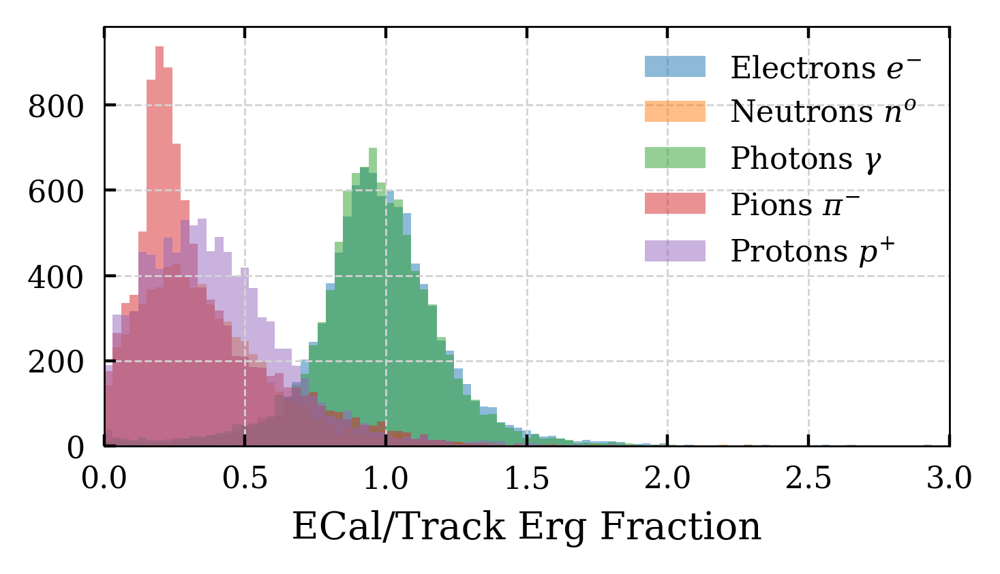

In [55]:
fig, ax = plt.subplots(figsize=(4, 2))
print('Particle'.ljust(19), 'Fraction satisfying'.ljust(19), 'Fraction lower'.ljust(19), 'Fraction higher')
for part in particles_name_list:
    erg_frac = []
    erg_crits = []
    erg_lower = []
    erg_higher = []
    for i in range(10000):
        try:
            track_px = particles_dict[part].get('PFTracks_px')[i]
            track_py = particles_dict[part].get('PFTracks_py')[i]
            track_pz = particles_dict[part].get('PFTracks_pz')[i]
            ecal_energy = particles_dict[part].get('PFEcalClusters_energy')[i][0]
            
            p = np.sqrt(np.power(track_px,2) + np.power(track_py,2) + np.power(track_pz,2))
            erg_frac.append(ecal_energy/p)
            erg_crits.append(ecal_energy > 0.3*p and ecal_energy < 2*p)
            erg_lower.append(ecal_energy < 0.3*p)
            erg_higher.append(ecal_energy > 2*p)
        except:
            continue
    erg_crits = np.array(erg_crits)[~np.isnan(erg_crits)]
    erg_frac = np.array(erg_frac)[~np.isnan(erg_frac)]
    print(f'{part:<20}{np.sum(erg_crits)/len(erg_crits):<20.2f}{np.sum(erg_lower)/len(erg_lower):<20.2f}{np.sum(erg_higher)/len(erg_higher):.2f}')
    ax.hist(erg_frac[erg_frac < 20], alpha=0.5, histtype='stepfilled', label=labels_dict[part], bins=np.linspace(0, 3, 100))

ax.set_xlim(0, 3)
# ax.set_yscale('log')
ax.set_xlabel('ECal/Track Erg Fraction', fontsize=10)
ax.legend()
plt.show()

# of clust: 3
# particle: 2543


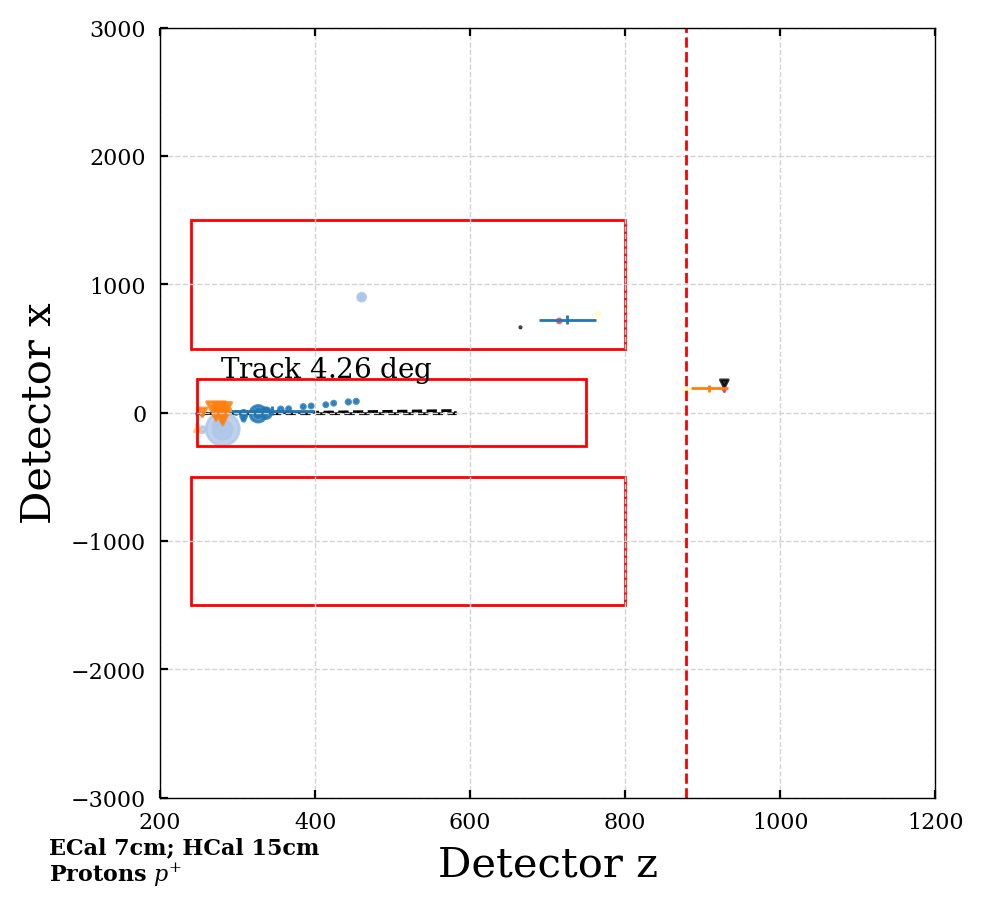

# of clust: 1
# particle: 1


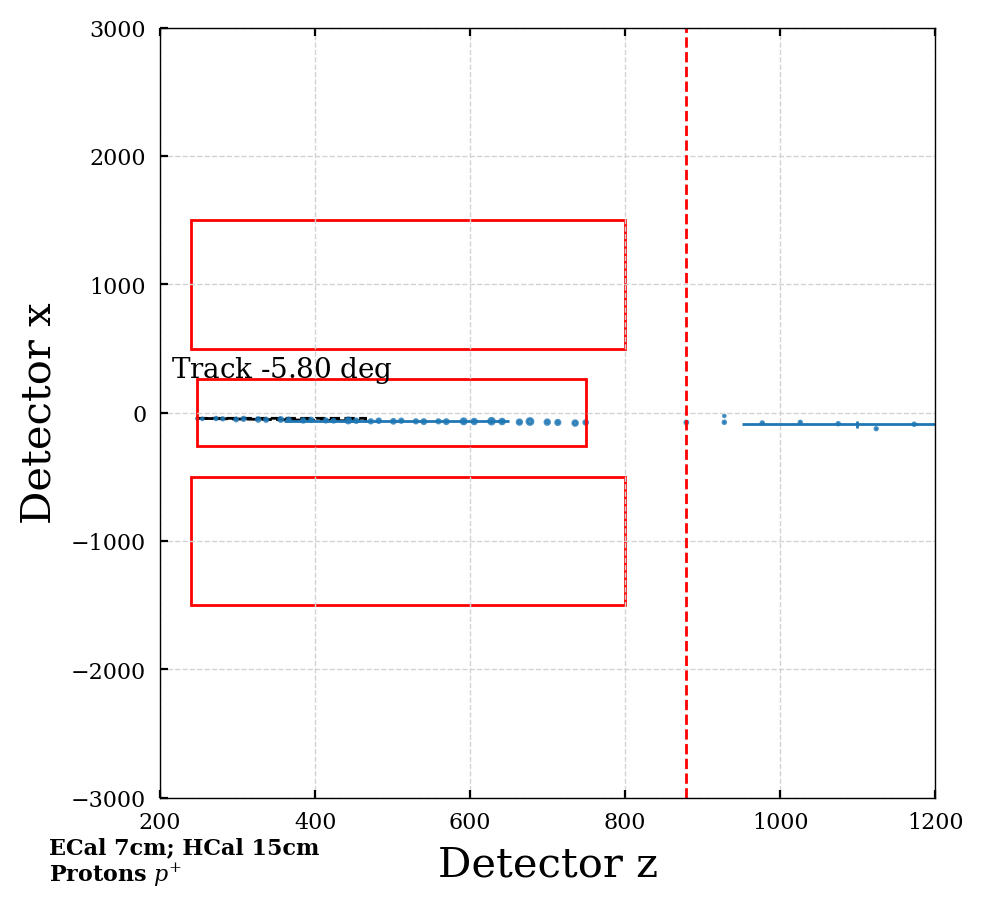

# of clust: 1
# particle: 2


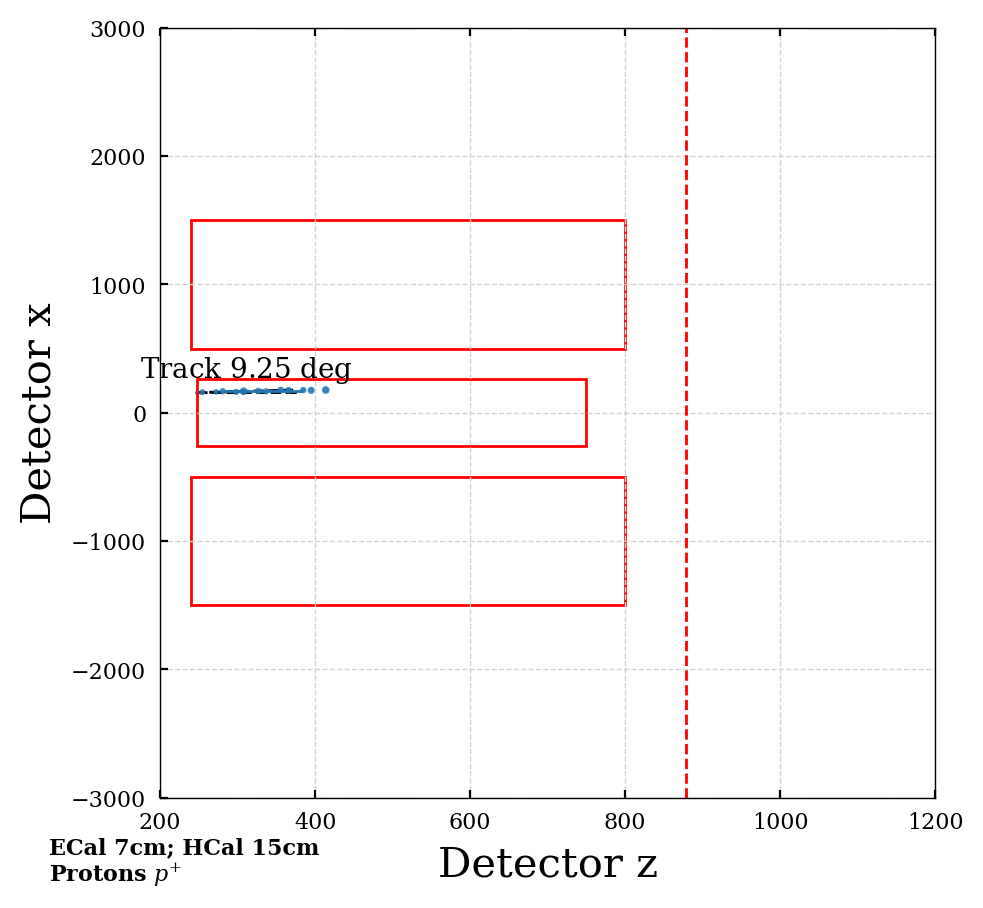

# of clust: 1
# particle: 3


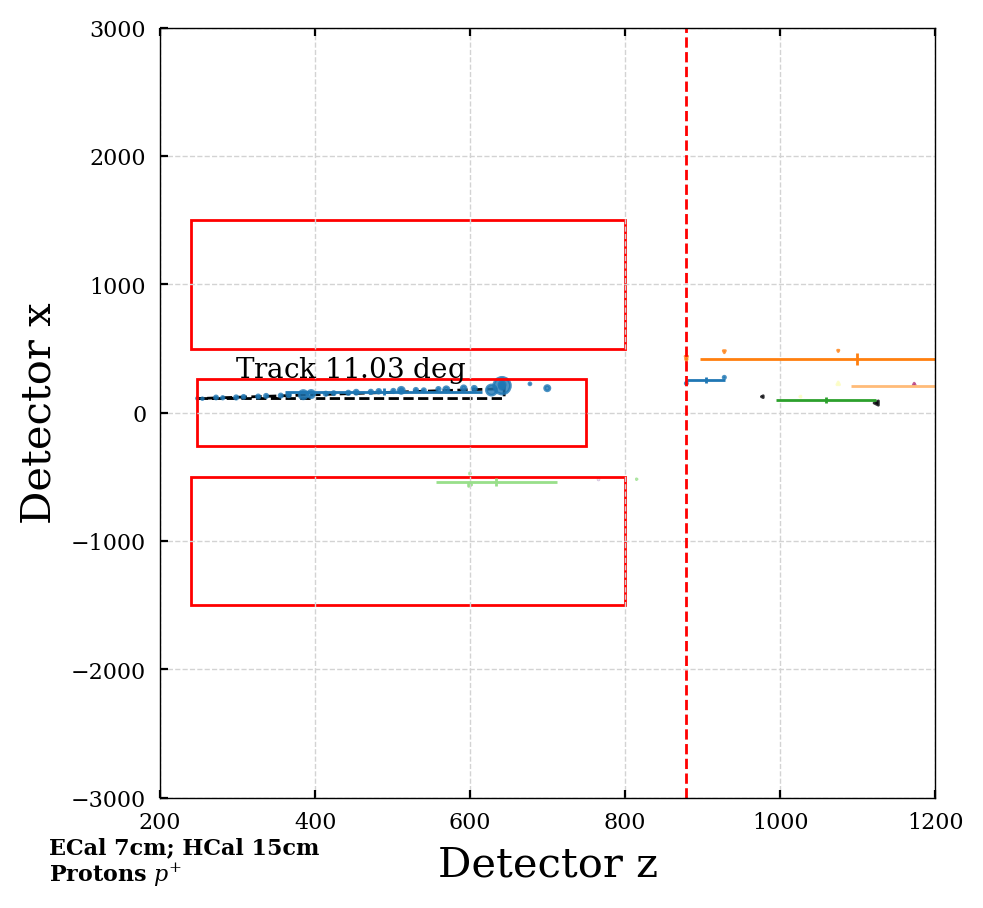

# of clust: 1
# particle: 4


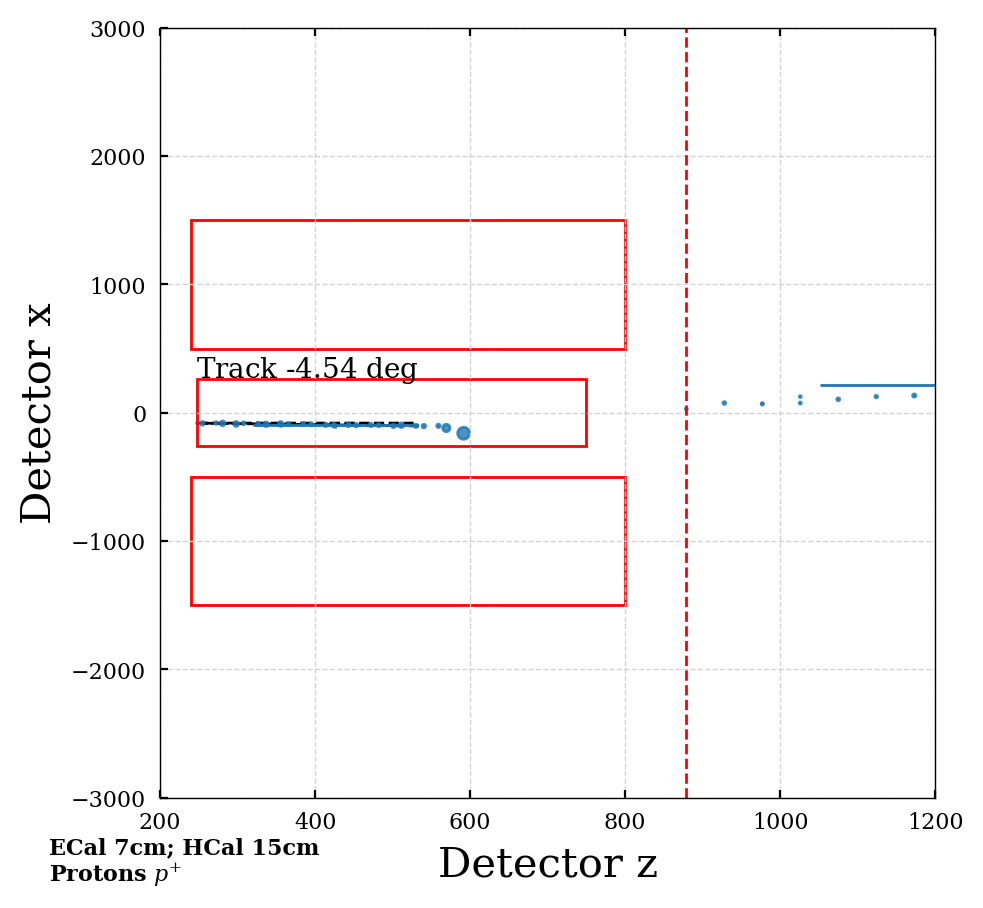

# of clust: 1
# particle: 5


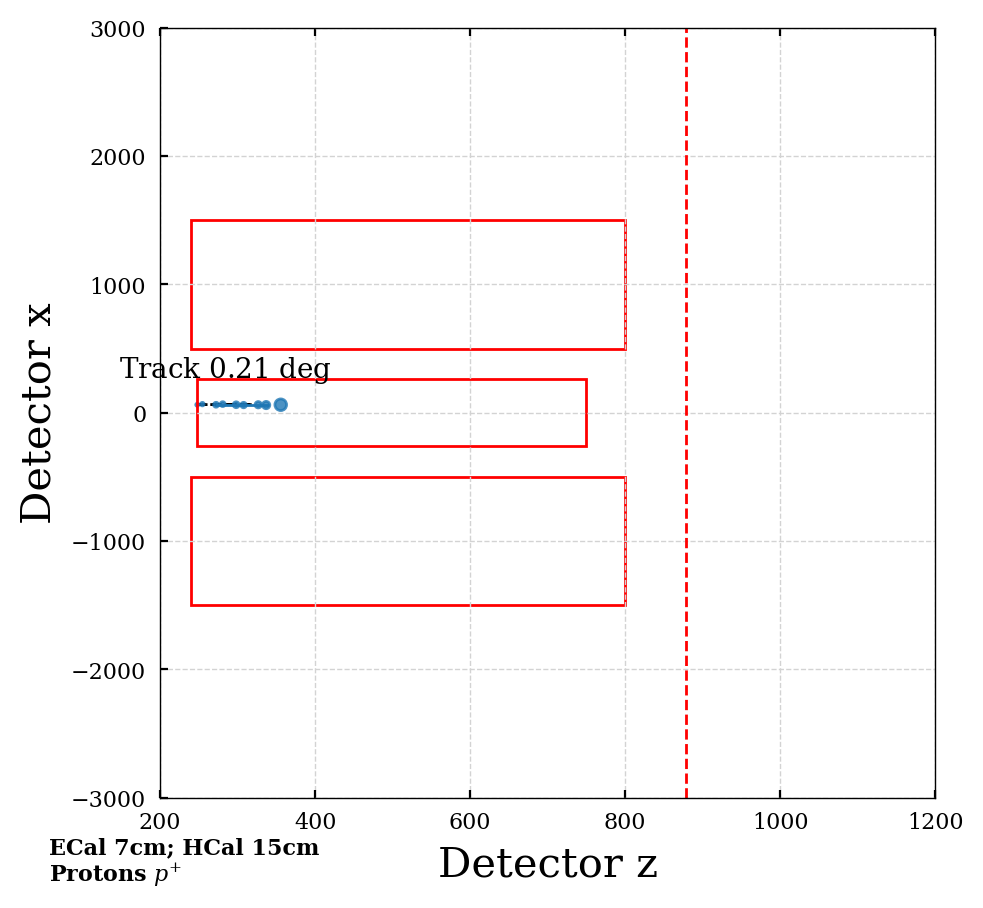

# of clust: 1
# particle: 6


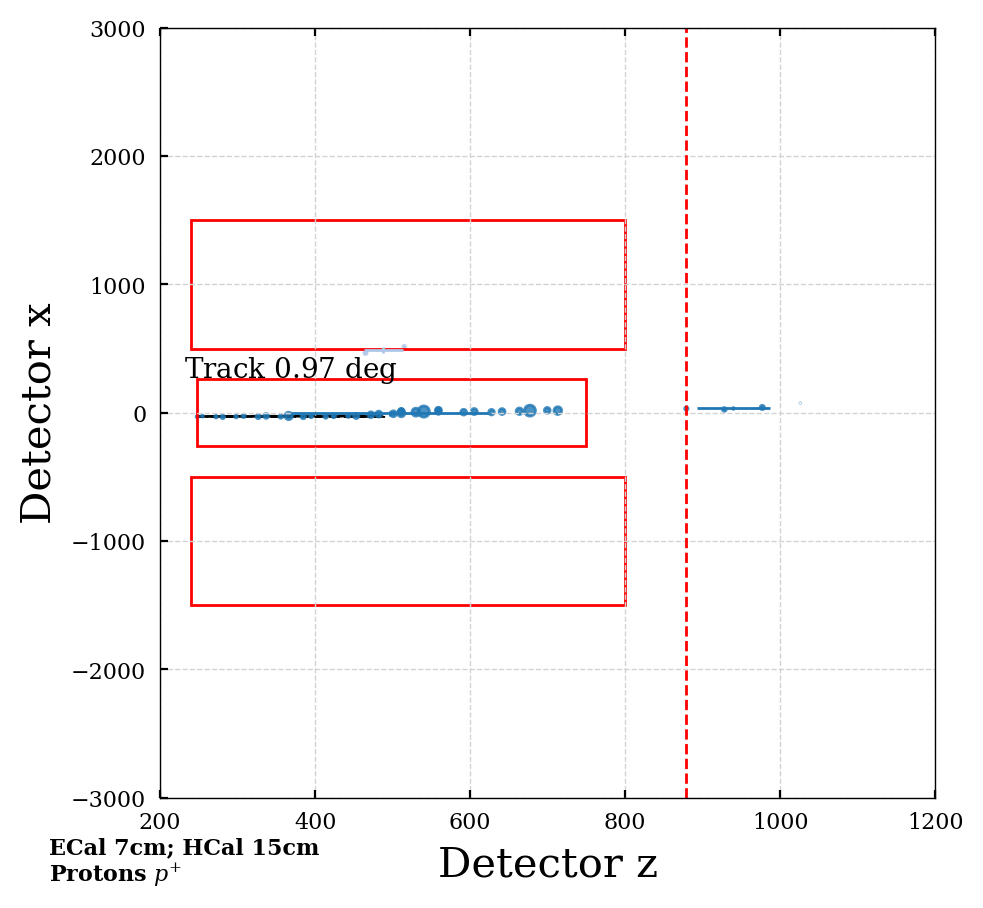

# of clust: 1
# particle: 7


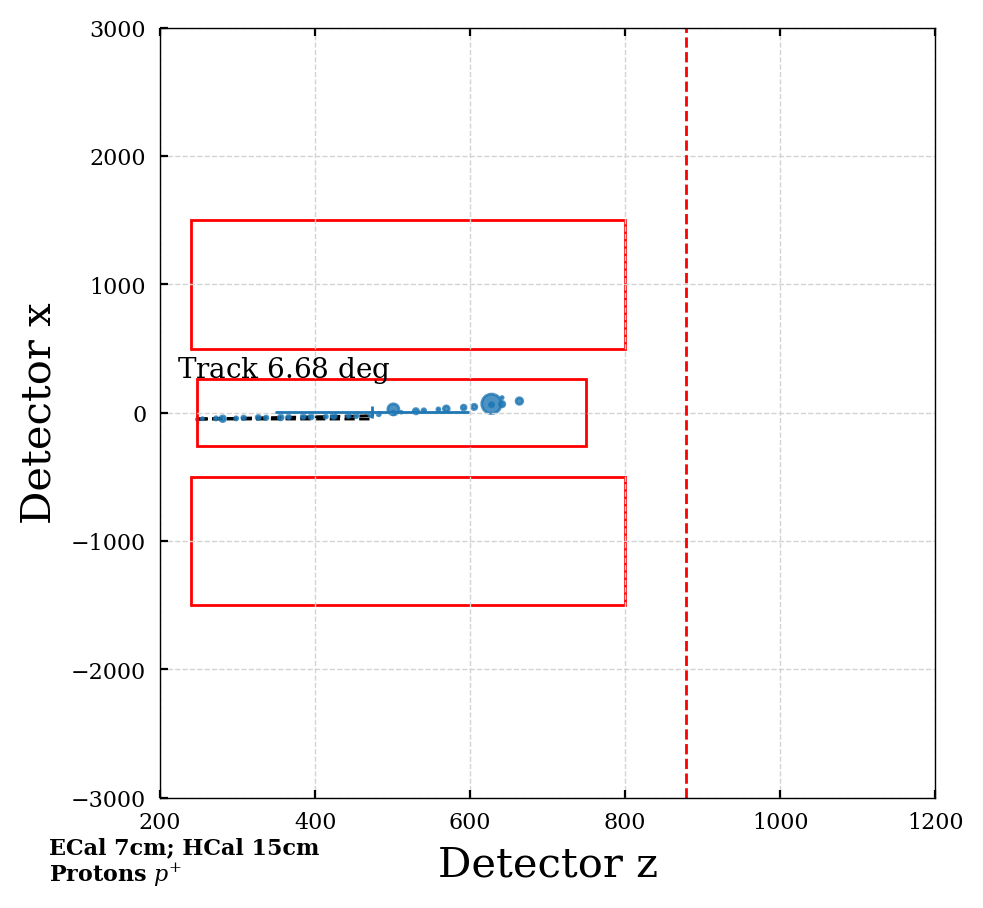

# of clust: 1
# particle: 8


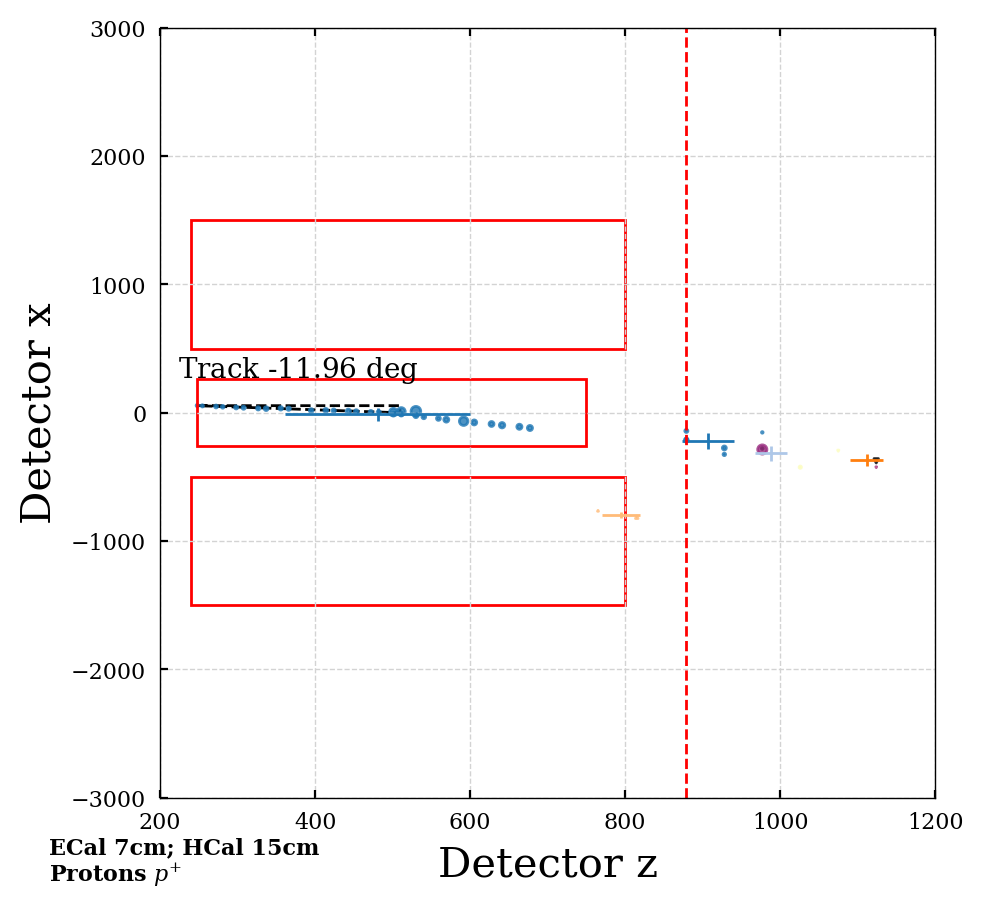

# of clust: 1
# particle: 9


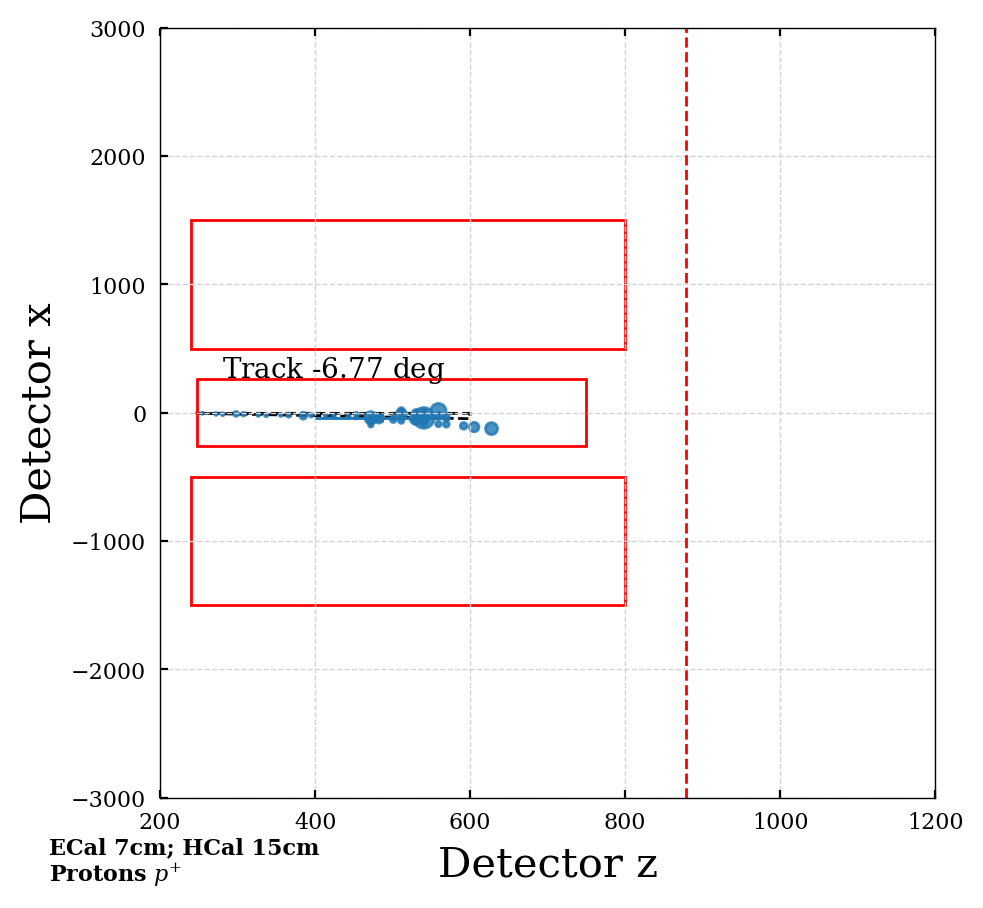

In [56]:
for i in range(10):
    plot_cluster_dist(particles_dict, spec_part='protons', ipart=i, xlim=1200, ylim=3000, angle_label=False)

### ECal — HCal linking

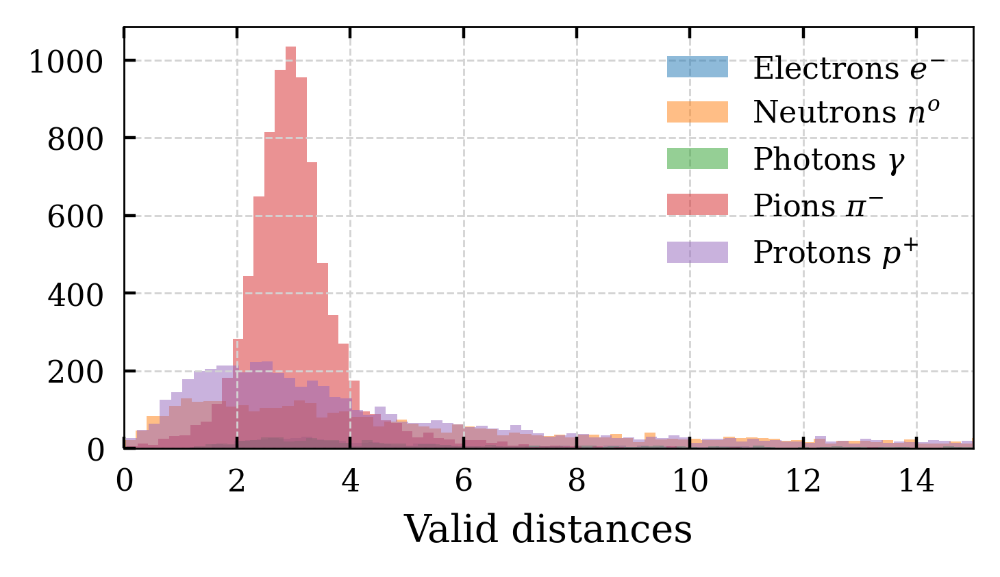

In [57]:
fig, ax = plt.subplots(figsize=(4, 2))
for part in particles_name_list:
    dists = []
    for i in range(10000):
        try:
            ecal_centroid_x = particles_dict[part].get('PFEcalClusters_centroidX')[i][0]
            ecal_centroid_y = particles_dict[part].get('PFEcalClusters_centroidY')[i][0]
            ecal_centroid_z = particles_dict[part].get('PFEcalClusters_centroidZ')[i][0]
            ecal_dxdz = particles_dict[part].get('PFEcalClusters_DXDZ')[i]
            ecal_dydz = particles_dict[part].get('PFEcalClusters_DYDZ')[i]
            ecal_rms_x = particles_dict[part].get('PFEcalClusters_rmsX')[i][0]
            ecal_rms_y = particles_dict[part].get('PFEcalClusters_rmsY')[i][0]
            hcal_centroid_x = particles_dict[part].get('PFHcalClusters_centroidX')[i][0]
            hcal_centroid_y = particles_dict[part].get('PFHcalClusters_centroidY')[i][0]
            hcal_centroid_z = particles_dict[part].get('PFHcalClusters_centroidZ')[i][0]
            hcal_rms_x = particles_dict[part].get('PFHcalClusters_rmsX')[i][0]
            hcal_rms_y = particles_dict[part].get('PFHcalClusters_rmsY')[i][0]
            
            hcal_proj_x = ecal_centroid_x + ecal_dxdz * (hcal_centroid_z - ecal_centroid_z)
            hcal_proj_y = ecal_centroid_y + ecal_dydz * (hcal_centroid_z - ecal_centroid_z)
            
            dist = np.sqrt(np.power(hcal_proj_x - hcal_centroid_x,2) / np.max([1.0, pow(hcal_rms_x,2) + pow(ecal_rms_x,2)]) +\
                           np.power(hcal_proj_y - hcal_centroid_y,2) / np.max([1.0, pow(hcal_rms_y,2)+pow(ecal_rms_y,2)]))
            dists.append(dist)
        except:
            continue
    dists = np.array(dists)[~np.isnan(dist)]
    ax.hist(dists[dists < 20], alpha=0.5, histtype='stepfilled', label=labels_dict[part])

ax.set_xlim(0, 15)
# ax.set_yscale('log')
ax.set_xlabel('Valid distances', fontsize=10)
ax.legend()
plt.show()

In [58]:
part = 'pions'
i = 5
ecal_centroid_x = particles_dict[part].get('PFEcalClusters_centroidX')[i][0]
ecal_centroid_y = particles_dict[part].get('PFEcalClusters_centroidY')[i][0]
ecal_centroid_z = particles_dict[part].get('PFEcalClusters_centroidZ')[i][0]
ecal_dxdz = particles_dict[part].get('PFEcalClusters_DXDZ')[i]
ecal_dydz = particles_dict[part].get('PFEcalClusters_DYDZ')[i]
ecal_rms_x = particles_dict[part].get('PFEcalClusters_rmsX')[i][0]
ecal_rms_y = particles_dict[part].get('PFEcalClusters_rmsY')[i][0]
hcal_centroid_x = particles_dict[part].get('PFHcalClusters_centroidX')[i][0]
hcal_centroid_y = particles_dict[part].get('PFHcalClusters_centroidY')[i][0]
hcal_centroid_z = particles_dict[part].get('PFHcalClusters_centroidZ')[i][0]
hcal_rms_x = particles_dict[part].get('PFHcalClusters_rmsX')[i][0]
hcal_rms_y = particles_dict[part].get('PFHcalClusters_rmsY')[i][0]

hcal_proj_x = ecal_centroid_x + ecal_dxdz * (hcal_centroid_z - ecal_centroid_z)
hcal_proj_y = ecal_centroid_y + ecal_dydz * (hcal_centroid_z - ecal_centroid_z)

dist = np.sqrt(np.power(hcal_proj_x - hcal_centroid_x,2) / np.max([1.0, pow(hcal_rms_x,2) + pow(ecal_rms_x,2)]) +\
               np.power(hcal_proj_y - hcal_centroid_y,2) / np.max([1.0, pow(hcal_rms_y,2)+pow(ecal_rms_y,2)]))
print(dist)

3.2611652122486956


# of clust: 3
# particle: 2543


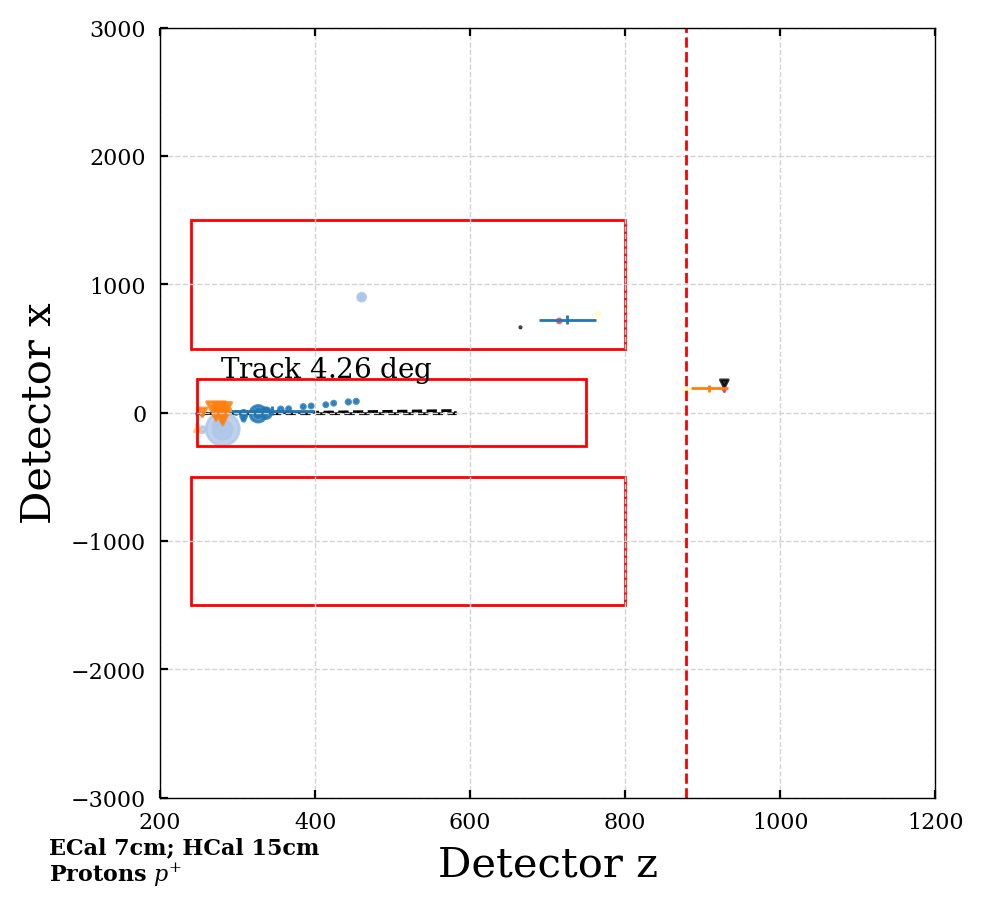

# of clust: 1
# particle: 1


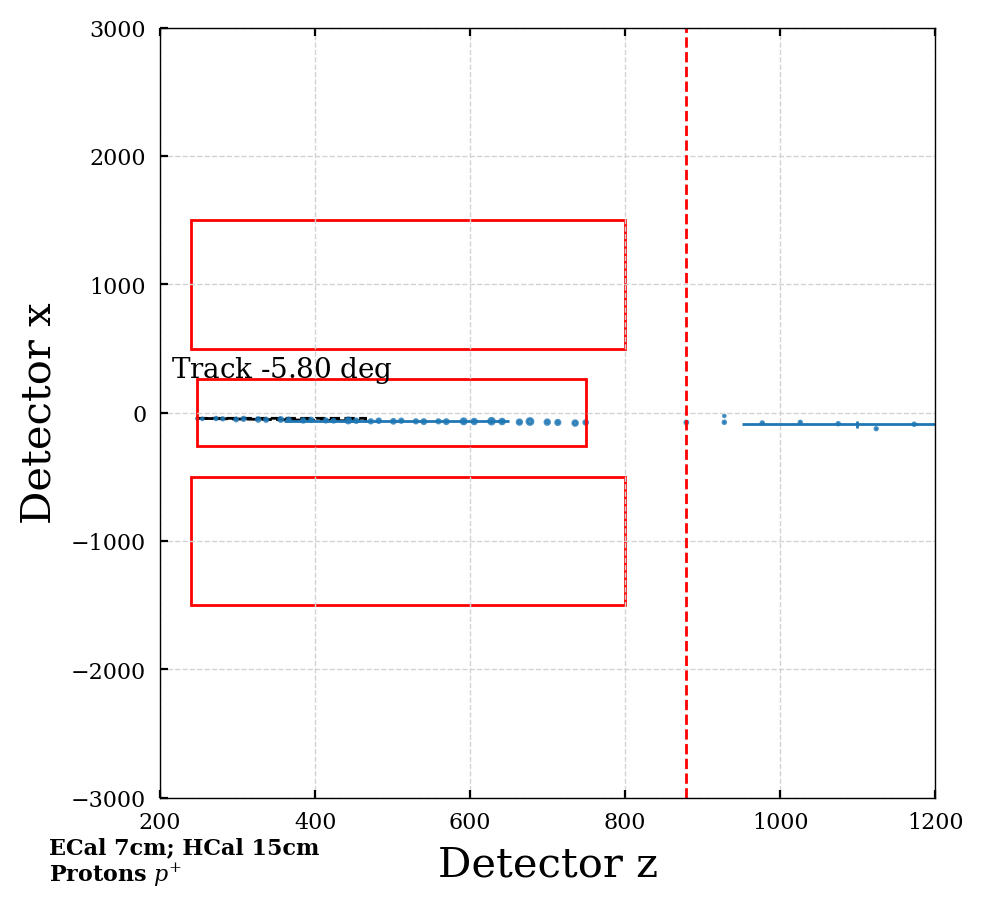

# of clust: 1
# particle: 2


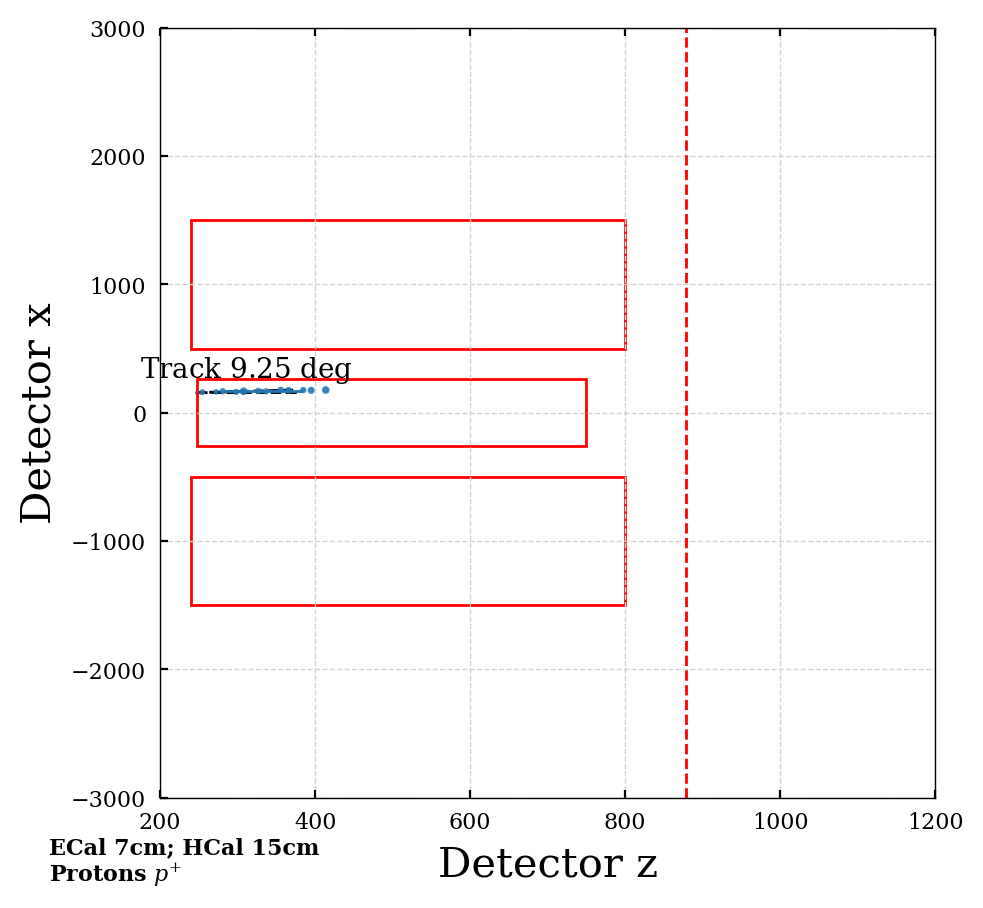

# of clust: 1
# particle: 3


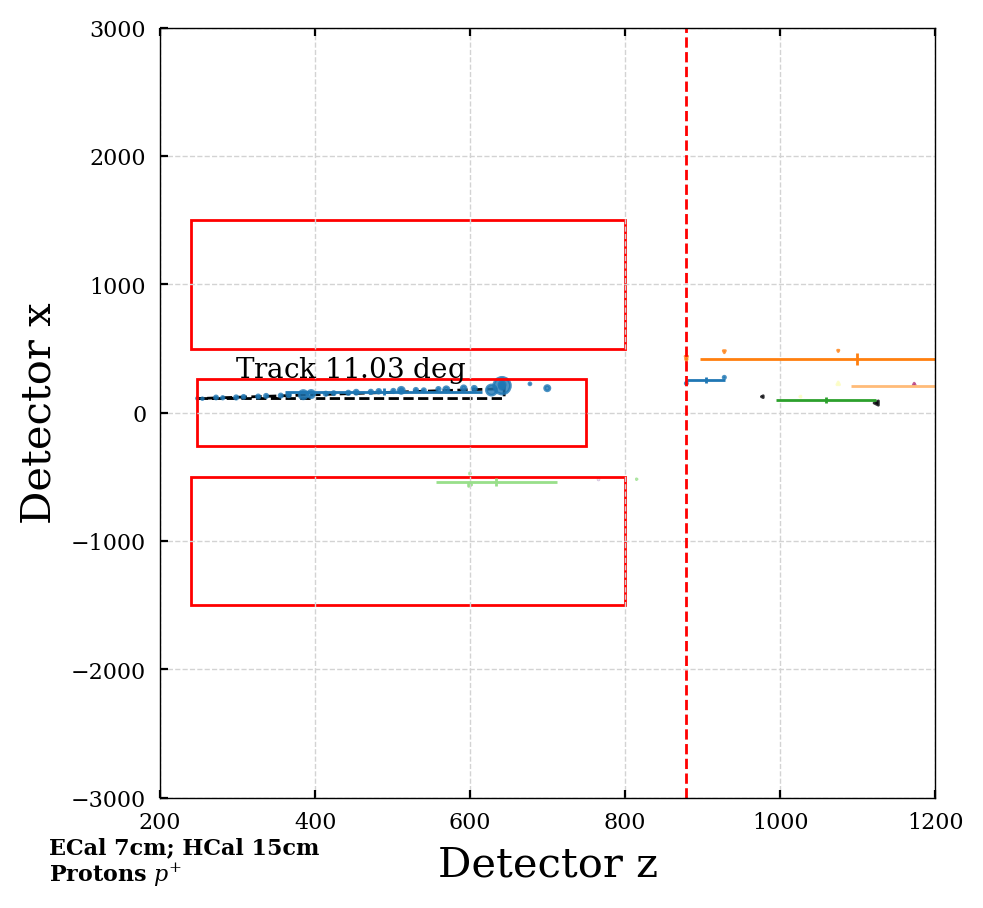

# of clust: 1
# particle: 4


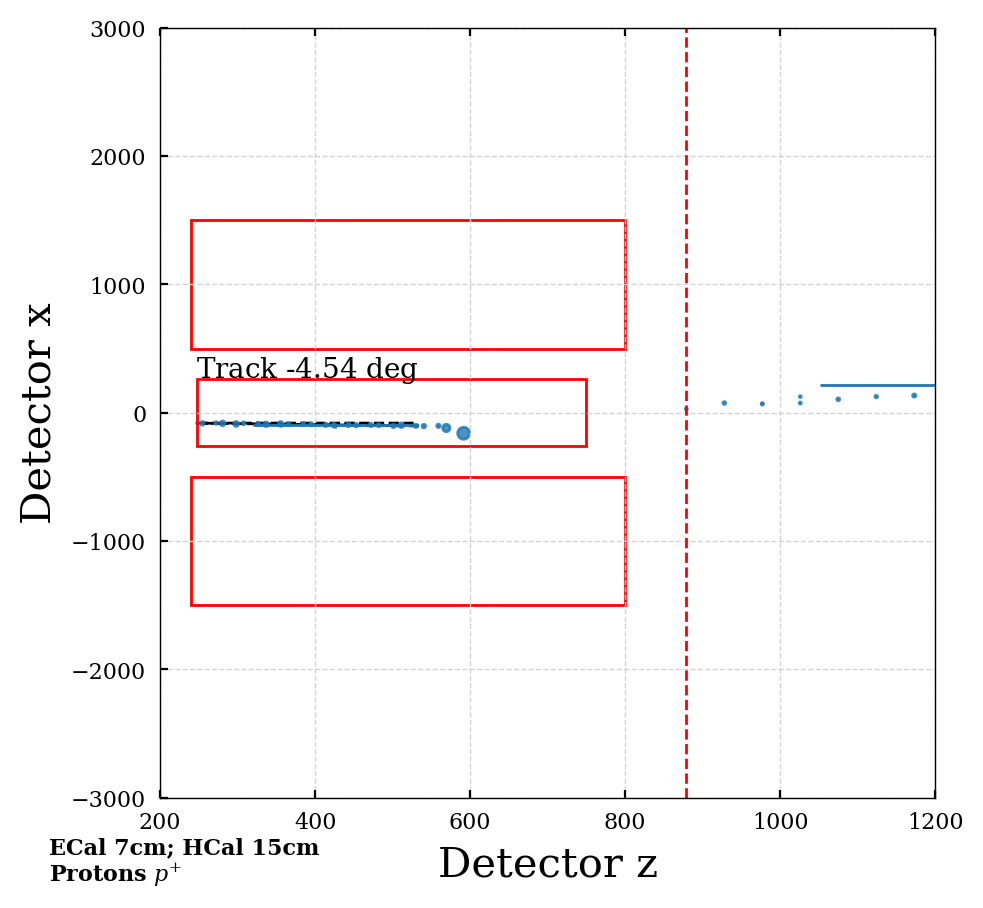

# of clust: 1
# particle: 5


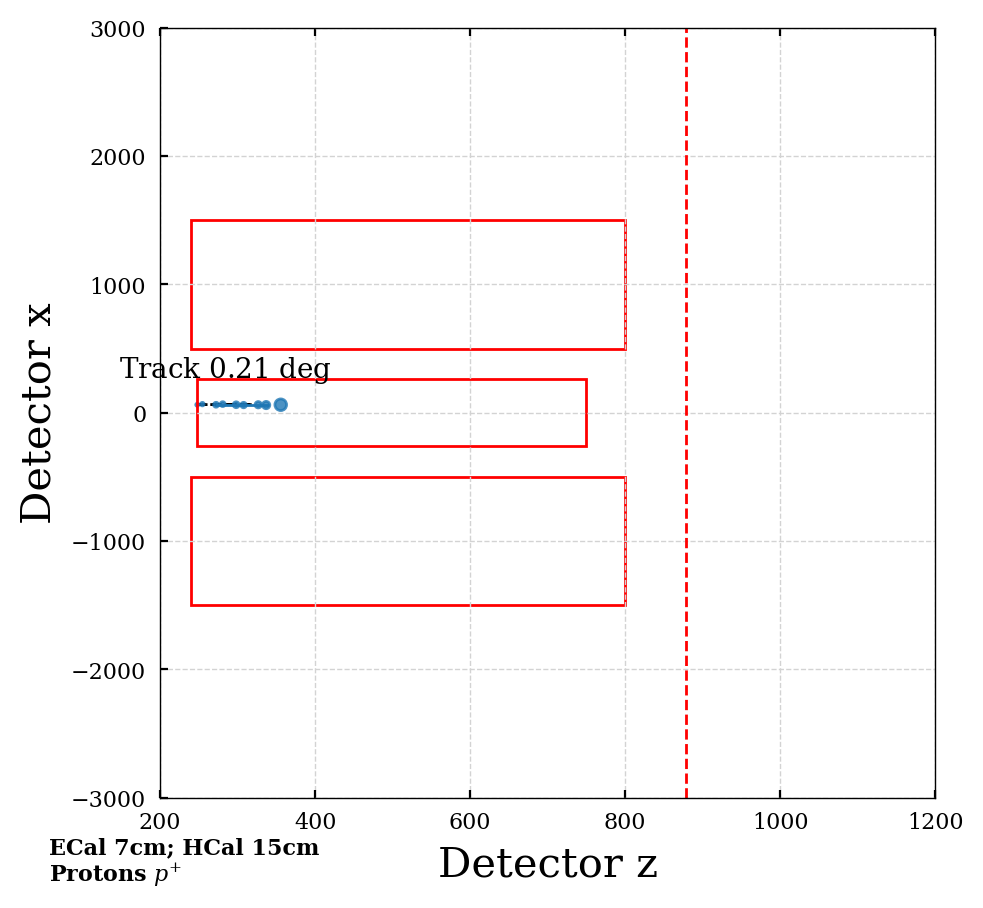

# of clust: 1
# particle: 6


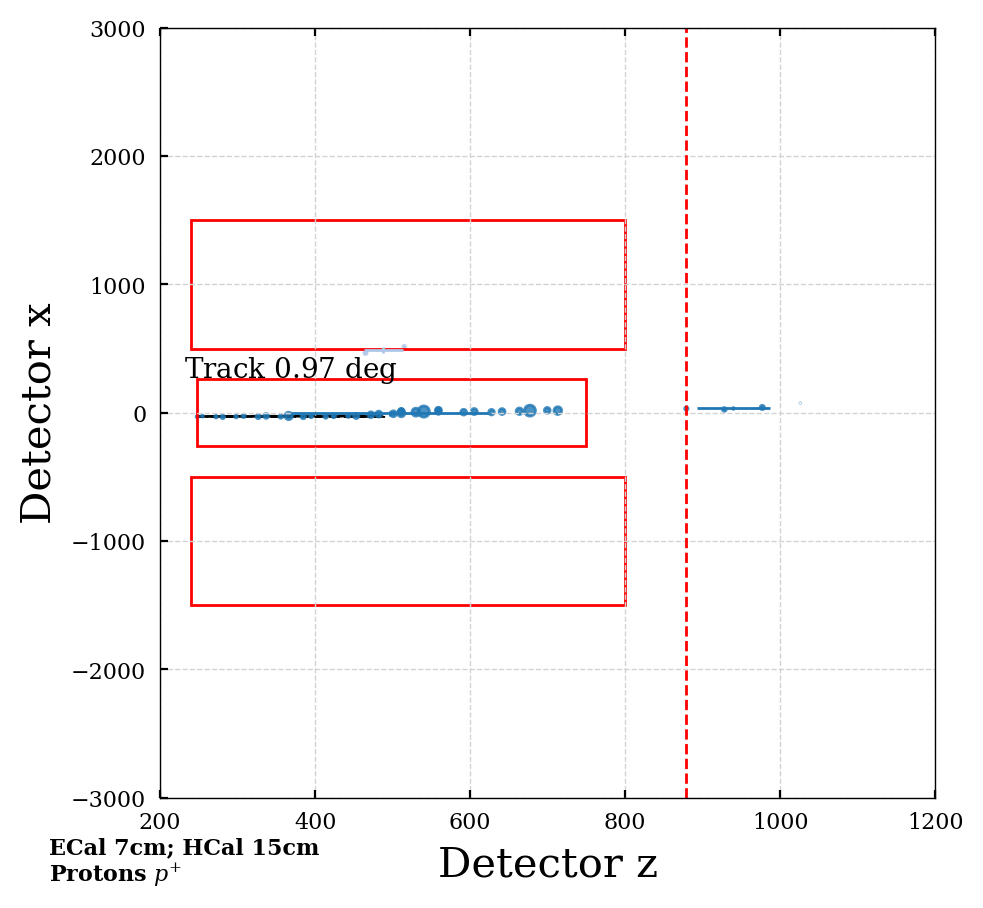

# of clust: 1
# particle: 7


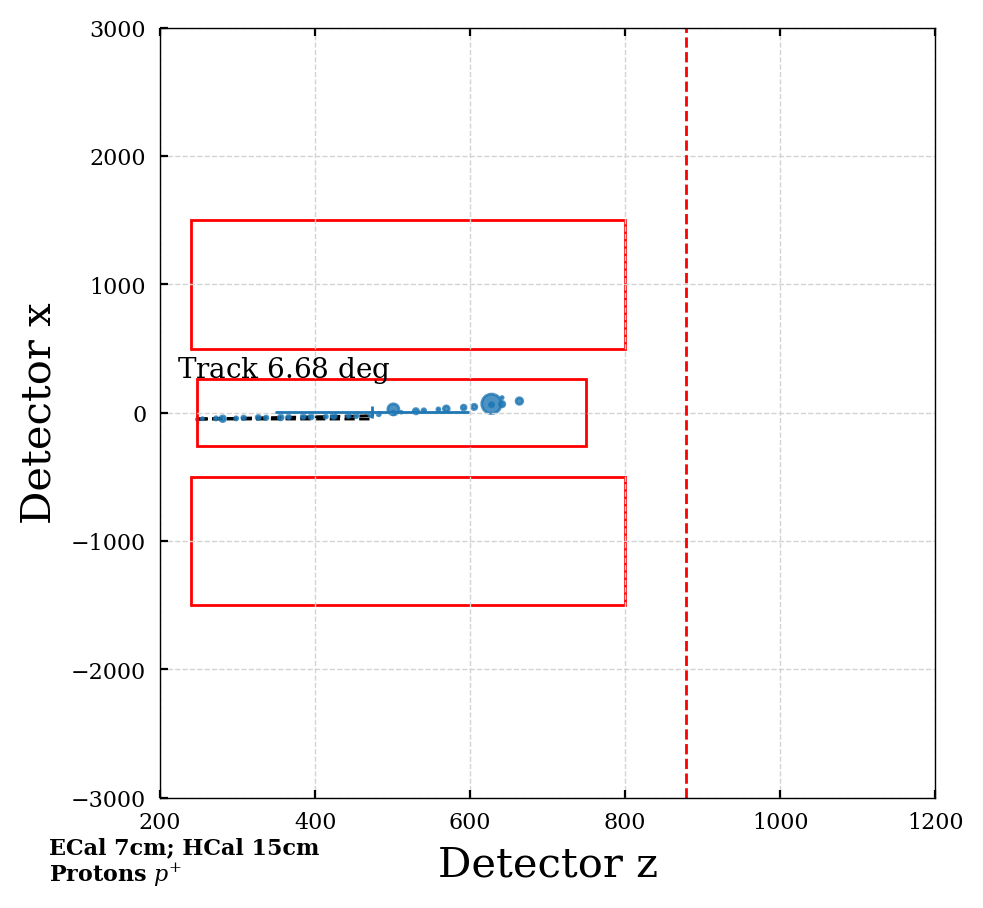

# of clust: 1
# particle: 8


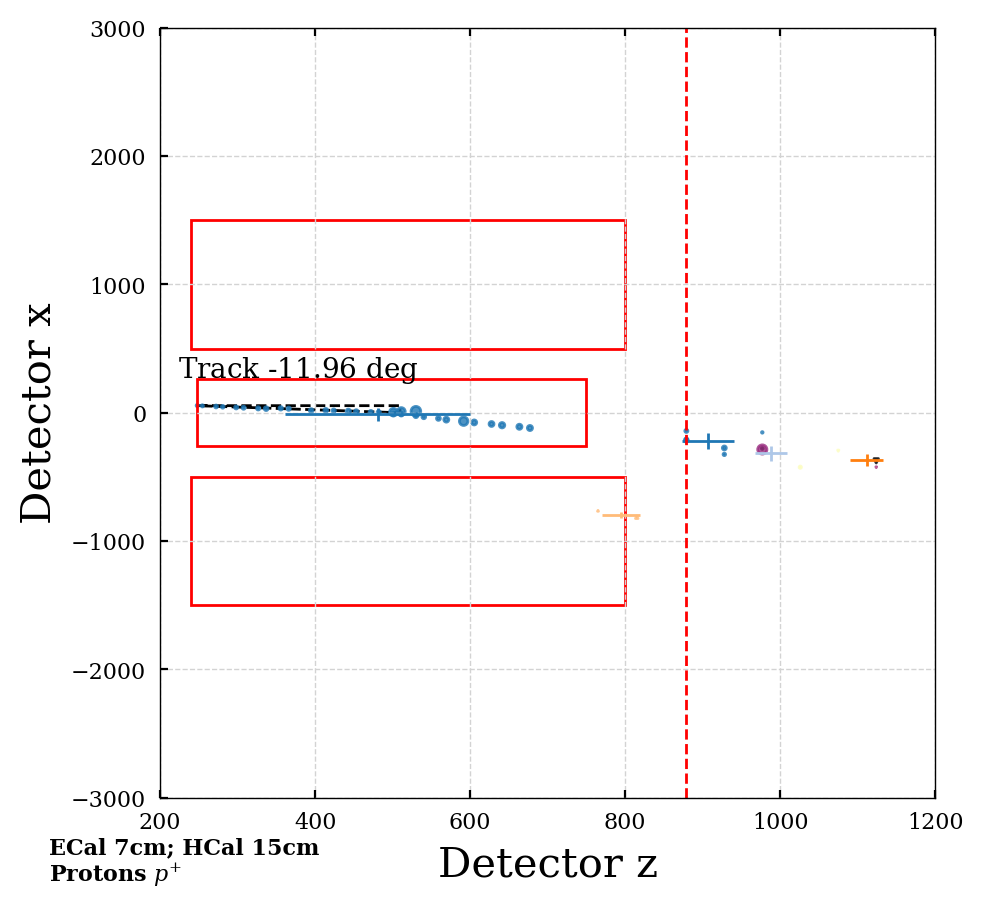

# of clust: 1
# particle: 9


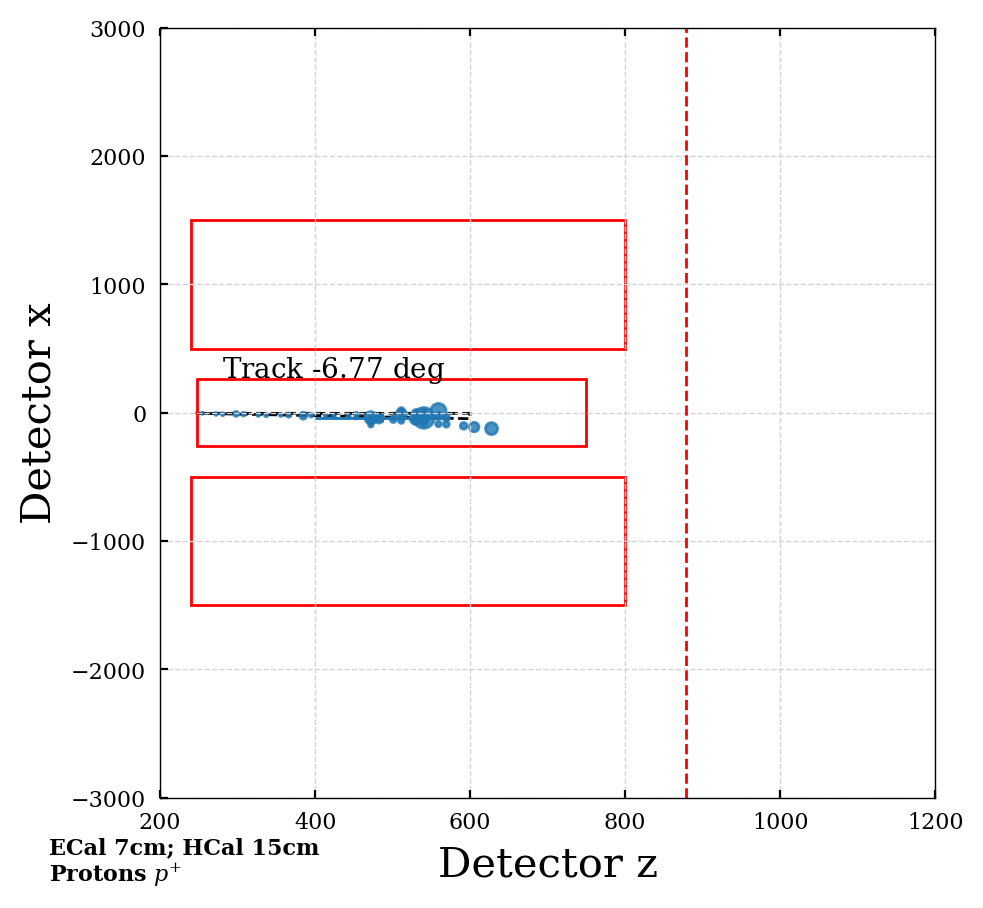

In [59]:
for i in range(10):
    plot_cluster_dist(particles_dict, spec_part='protons', ipart=i, xlim=1200, ylim=3000, angle_label=False)

## Confusion Matrix

In [60]:
int_bin(np.max(ak.to_numpy(ak.ravel(particles_dict['photons'].get('PFCandidates_pid'))).astype(int).filled(0)))
a = np.unique(ak.to_numpy(ak.ravel(particles_dict['photons'].get('PFCandidates_pid'))).astype(int).filled(0), return_counts=True)
np.vectorize(int_bin)(a[0]), a[1]

(array(['000', '010', '100', '110'], dtype='<U3'),
 array([    8, 12687,  4040,   550]))

In [61]:
np.vectorize(int_bin)(  ak.to_numpy(ak.ravel(particles_dict['neutrons'].get('PFCandidates_pid'))).astype(int).filled(0)  )

array(['110', '100', '100', ..., '100', '100', '100'], dtype='<U3')

In [62]:
list(particles_dict['electrons'].propdict.keys())

['EcalTotalEnergy',
 'HcalTotalEnergy',
 'PFTruth/PFTruth.second.vertexVolume_',
 'PFEcalClusters_hitIDs',
 'PFEcalClusters_energy_lc',
 'PFEcalClusters_energy',
 'PFEcalClusters_nHits_lc',
 'PFEcalClusters_nHits',
 'PFEcalClusters_centroidX_lc',
 'PFEcalClusters_centroidX',
 'PFEcalClusters_centroidY_lc',
 'PFEcalClusters_centroidY',
 'PFEcalClusters_centroidZ_lc',
 'PFEcalClusters_centroidZ',
 'PFEcalClusters_rmsX_lc',
 'PFEcalClusters_rmsX',
 'PFEcalClusters_rmsY_lc',
 'PFEcalClusters_rmsY',
 'PFEcalClusters_rmsZ_lc',
 'PFEcalClusters_rmsZ',
 'PFEcalClusters_DXDZ',
 'PFEcalClusters_DYDZ',
 'PFEcalClusters_errDXDZ',
 'PFEcalClusters_errDYDZ',
 'PFEcalClusters_hitX_lc',
 'PFEcalClusters_hitX',
 'PFEcalClusters_hitY_lc',
 'PFEcalClusters_hitY',
 'PFEcalClusters_hitZ_lc',
 'PFEcalClusters_hitZ',
 'PFEcalClusters_hitE_lc',
 'PFEcalClusters_hitE',
 'PFHcalClusters_hitIDs',
 'PFHcalClusters_energy_lc',
 'PFHcalClusters_energy',
 'PFHcalClusters_nHits_lc',
 'PFHcalClusters_nHits',
 'PFHcalC

In [63]:
particles_dict['electrons'].get('PFEcalClusters_good_mask')

<Array [[True], [True], ..., [True, ...], [True]] type='10000 * var * ?bool'>

In [64]:
# construct true labels and bin_pids
true_labels = []
bin_pids = []

for part in particles_name_list:
    exp_pid = np.array([_[0] for _ in particles_dict[part].get('PFCandidates_pid')], dtype=float)  # lead clust
    # exp_pid = ak.to_numpy(ak.ravel(particles_dict[part].get('PFCandidates_pid'))).astype(int).filled(0)  # flattened pif
    good_pid = exp_pid.astype(int)  # convert to integer
    bin_pid = np.vectorize(int_bin)(good_pid)
    true_labels = np.hstack([true_labels, [part] * len(bin_pid)])
    bin_pids = np.hstack([bin_pids, bin_pid])

In [65]:
unique_true = particles_name_list
unique_pred = list(np.vectorize(int_bin)(np.arange(8)))
unique_true, unique_pred

(['electrons', 'neutrons', 'photons', 'pions', 'protons'],
 ['000', '001', '010', '011', '100', '101', '110', '111'])

In [66]:
# construct the confusion matrix
c_matrix = np.zeros((5, 8))

for i in range(len(true_labels)):
    c_matrix[unique_true.index(true_labels[i])][unique_pred.index(bin_pids[i])] += 1

c_matrix

array([[0.000e+00, 1.930e+02, 3.000e+00, 9.394e+03, 0.000e+00, 0.000e+00,
        0.000e+00, 4.100e+02],
       [3.830e+02, 0.000e+00, 3.776e+03, 0.000e+00, 2.581e+03, 0.000e+00,
        3.260e+03, 0.000e+00],
       [8.000e+00, 0.000e+00, 9.404e+03, 0.000e+00, 1.420e+02, 0.000e+00,
        4.460e+02, 0.000e+00],
       [3.000e+00, 4.590e+02, 3.600e+01, 1.620e+03, 1.000e+00, 0.000e+00,
        2.200e+01, 7.859e+03],
       [0.000e+00, 3.000e+02, 1.000e+01, 5.254e+03, 0.000e+00, 0.000e+00,
        6.000e+00, 4.430e+03]])

In [67]:
labels_dict

{'electrons': 'Electrons $e^{\\minus}$',
 'neutrons': 'Neutrons $n^{o}$',
 'photons': 'Photons $\\gamma$',
 'pions': 'Pions $\\pi^{\\minus}$',
 'protons': 'Protons $p^{\\plus}$',
 'electrons_hcal': 'Electrons $e^{\\minus}$ HCal',
 'neutrons_hcal': 'Neutrons $n^{o}$ HCal',
 'photons_hcal': 'Photons $\\gamma$ HCal',
 'pions_hcal': 'Pions $\\pi^{\\minus}$ HCal',
 'protons_hcal': 'Protons $p^{\\plus}$ HCal'}

In [68]:
particles_symbols_list = [
    '$e^{\\minus}$',
    '$n^{o}$',
    '$\\gamma$',
    '$\\pi^{\\minus}$',
    '$p^{\\plus}$'
]

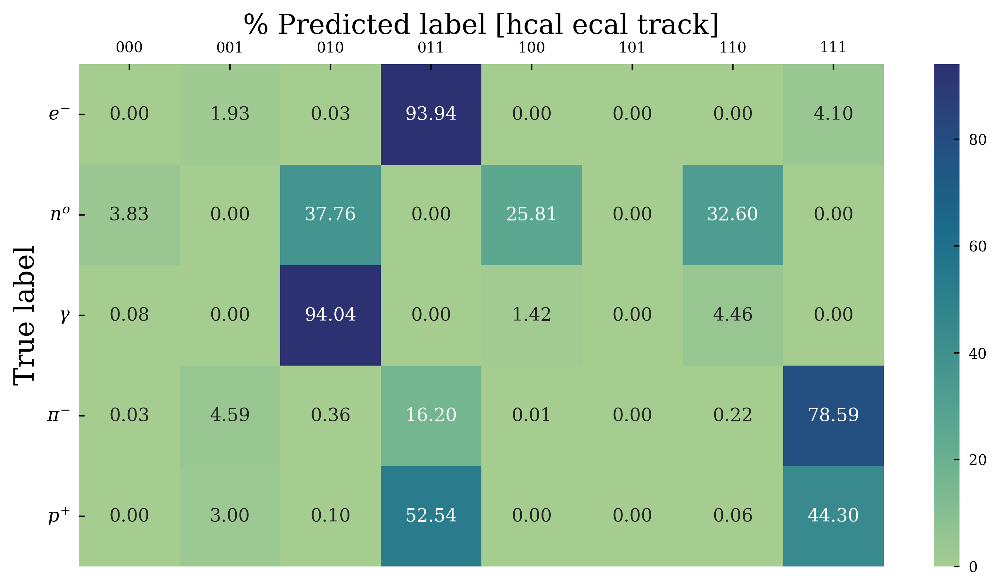

In [69]:
def plot_c_matrix(ax,
                  c_matrix,
                  fmt='.2f',
                  xlabel='% Predicted label [hcal ecal track]',
                  ylabel='True label',
                  xticks_pos=np.arange(8)+0.5, xticks=np.vectorize(int_bin)(np.arange(8, dtype=int)),
                  yticks_pos=np.arange(5)+0.5, yticks=particles_symbols_list):
    import seaborn as sns
    from sklearn import metrics
    
    ax.grid(visible=False)
    heatM = sns.heatmap(ax=ax, data=c_matrix, vmin=0, fmt=fmt,
                        cmap=sns.color_palette("crest", as_cmap=True), square=True, annot=True)
    # y axis
    heatM.set_ylabel(ylabel)
    heatM.set_yticks(yticks_pos, yticks, fontsize=10, rotation=0)
    # x axis
    heatM.xaxis.tick_top()
    heatM.xaxis.set_label_position('top')
    heatM.set_xlabel(xlabel)
    heatM.set_xticks(xticks_pos, xticks)
    return ax

fig, ax = plt.subplots(figsize=(10,5), facecolor=(0, 0, 0, 0))  #This is the size of the image
_ = plot_c_matrix(ax, c_matrix/1e2)
plt.show()

## Energy Dependence

In [70]:
energy_bins = np.arange(5) * 1e3
energy_bins

array([   0., 1000., 2000., 3000., 4000.])

In [71]:
list(particles_dict[part].propdict.keys())

['EcalTotalEnergy',
 'HcalTotalEnergy',
 'PFTruth/PFTruth.second.vertexVolume_',
 'PFEcalClusters_hitIDs',
 'PFEcalClusters_energy_lc',
 'PFEcalClusters_energy',
 'PFEcalClusters_nHits_lc',
 'PFEcalClusters_nHits',
 'PFEcalClusters_centroidX_lc',
 'PFEcalClusters_centroidX',
 'PFEcalClusters_centroidY_lc',
 'PFEcalClusters_centroidY',
 'PFEcalClusters_centroidZ_lc',
 'PFEcalClusters_centroidZ',
 'PFEcalClusters_rmsX_lc',
 'PFEcalClusters_rmsX',
 'PFEcalClusters_rmsY_lc',
 'PFEcalClusters_rmsY',
 'PFEcalClusters_rmsZ_lc',
 'PFEcalClusters_rmsZ',
 'PFEcalClusters_DXDZ',
 'PFEcalClusters_DYDZ',
 'PFEcalClusters_errDXDZ',
 'PFEcalClusters_errDYDZ',
 'PFEcalClusters_hitX_lc',
 'PFEcalClusters_hitX',
 'PFEcalClusters_hitY_lc',
 'PFEcalClusters_hitY',
 'PFEcalClusters_hitZ_lc',
 'PFEcalClusters_hitZ',
 'PFEcalClusters_hitE_lc',
 'PFEcalClusters_hitE',
 'PFHcalClusters_hitIDs',
 'PFHcalClusters_energy_lc',
 'PFHcalClusters_energy',
 'PFHcalClusters_nHits_lc',
 'PFHcalClusters_nHits',
 'PFHcalC

In [72]:
particles_dict['electrons'].get('PFTruth_second_energy')

array([2378.76806746, 2763.10315619, 3399.46445118, ...,  170.31230221,
       3660.92520247, 2843.34072362])

In [73]:
a = [[   0.   ,65.   , 3. ,2185.  ,  0.  ,  0.  ,  0. ,  27.],
 [   0.   ,49.   , 0. ,2402.  ,  0.  ,  0.  ,  0. ,  92.],
 [   0.   ,42.   , 0. ,2397.  ,  0.  ,  0.  ,  0. , 113.],
 [   0.   ,37.   , 0. ,2410.  ,  0.  ,  0.  ,  0. , 178.]]
a = np.array(a)
a/np.tile(a.sum(axis=1), (8, 1)).T

array([[0.        , 0.02850877, 0.00131579, 0.95833333, 0.        ,
        0.        , 0.        , 0.01184211],
       [0.        , 0.01926858, 0.        , 0.94455368, 0.        ,
        0.        , 0.        , 0.03617774],
       [0.        , 0.01645768, 0.        , 0.93926332, 0.        ,
        0.        , 0.        , 0.044279  ],
       [0.        , 0.01409524, 0.        , 0.91809524, 0.        ,
        0.        , 0.        , 0.06780952]])

In [74]:
a.sum(axis=1)

array([2280., 2543., 2552., 2625.])

electrons energy 0.0 to 1000.0
electrons energy 1000.0 to 2000.0
electrons energy 2000.0 to 3000.0
electrons energy 3000.0 to 4000.0
[[   0.   65.    3. 2185.    0.    0.    0.   27.]
 [   0.   49.    0. 2402.    0.    0.    0.   92.]
 [   0.   42.    0. 2397.    0.    0.    0.  113.]
 [   0.   37.    0. 2410.    0.    0.    0.  178.]]
neutrons energy 0.0 to 1000.0
neutrons energy 1000.0 to 2000.0
neutrons energy 2000.0 to 3000.0
neutrons energy 3000.0 to 4000.0
[[ 380.    0.  927.    0.  923.    0.  129.    0.]
 [   3.    0. 1271.    0.  586.    0.  651.    0.]
 [   0.    0.  907.    0.  561.    0. 1127.    0.]
 [   0.    0.  671.    0.  511.    0. 1353.    0.]]
photons energy 0.0 to 1000.0
photons energy 1000.0 to 2000.0
photons energy 2000.0 to 3000.0
photons energy 3000.0 to 4000.0
[[   8.    0. 2227.    0.   36.    0.   27.    0.]
 [   0.    0. 2436.    0.   35.    0.   83.    0.]
 [   0.    0. 2397.    0.   35.    0.  143.    0.]
 [   0.    0. 2344.    0.   36.    0.  193.    0.]

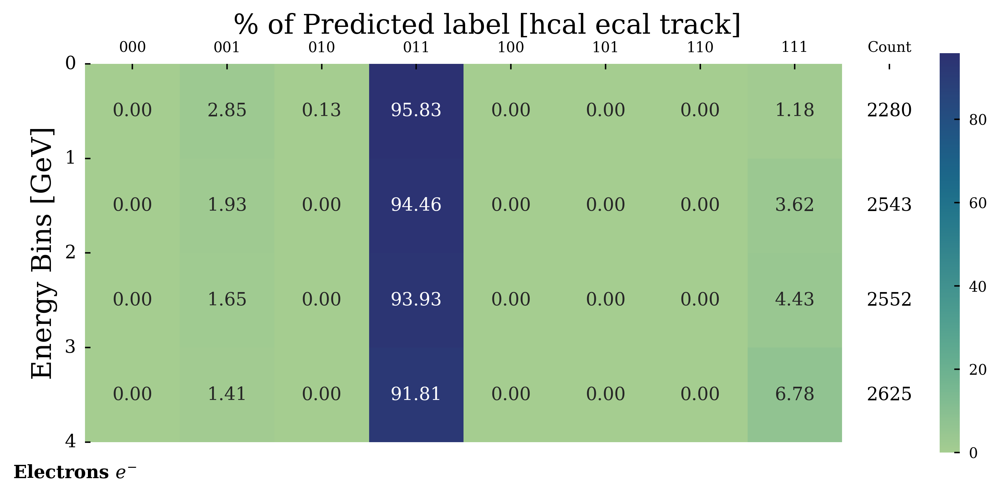

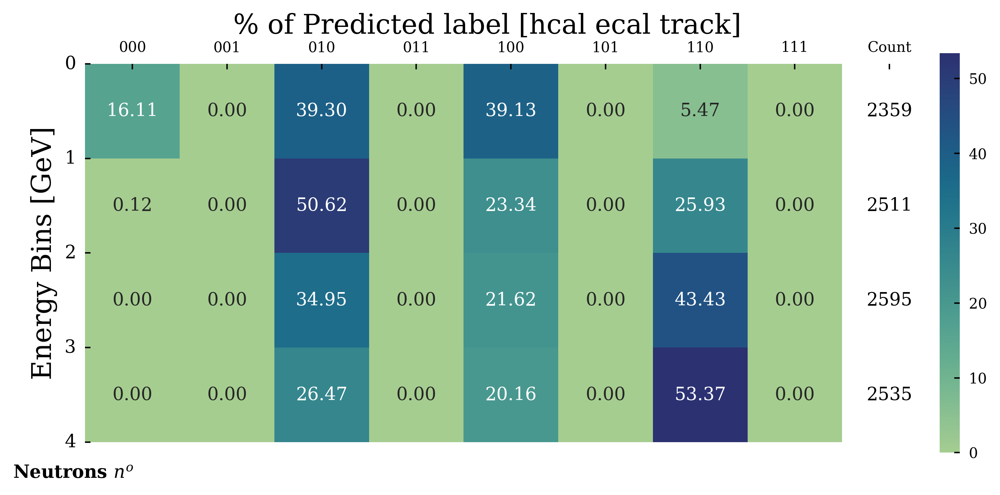

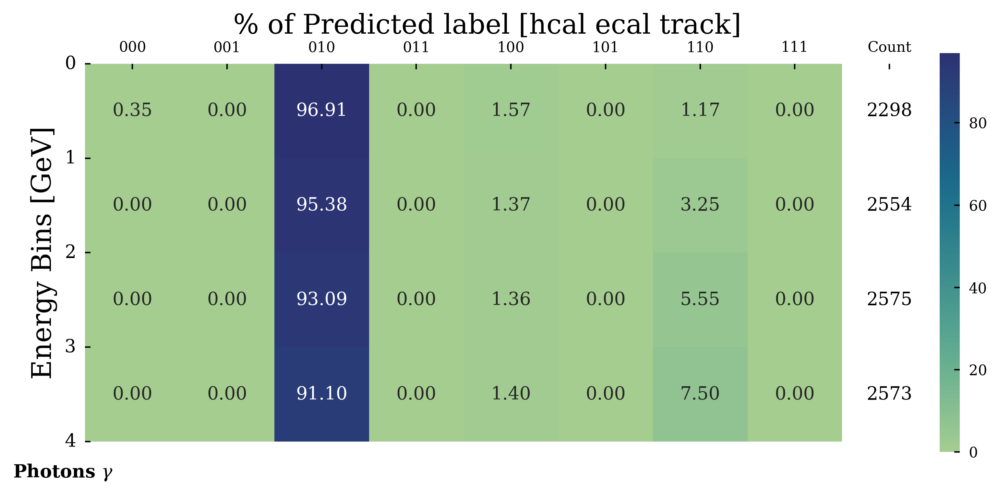

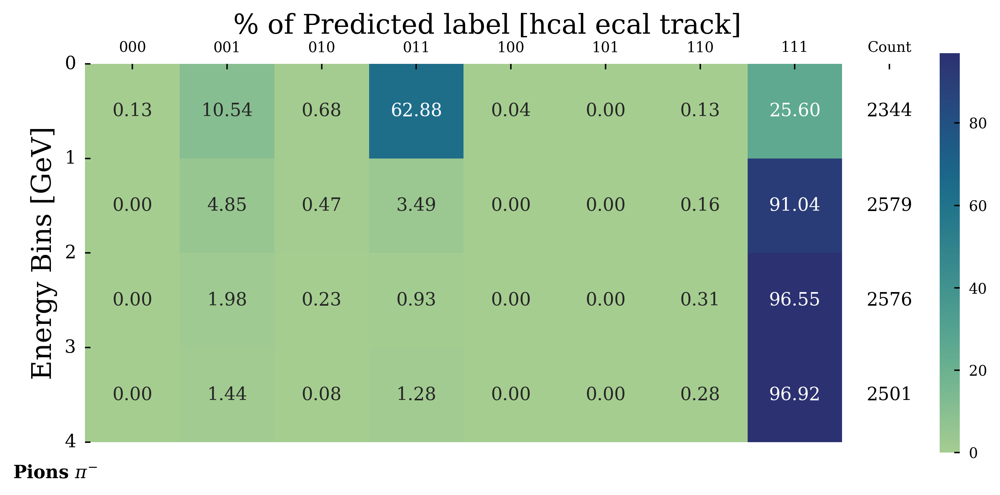

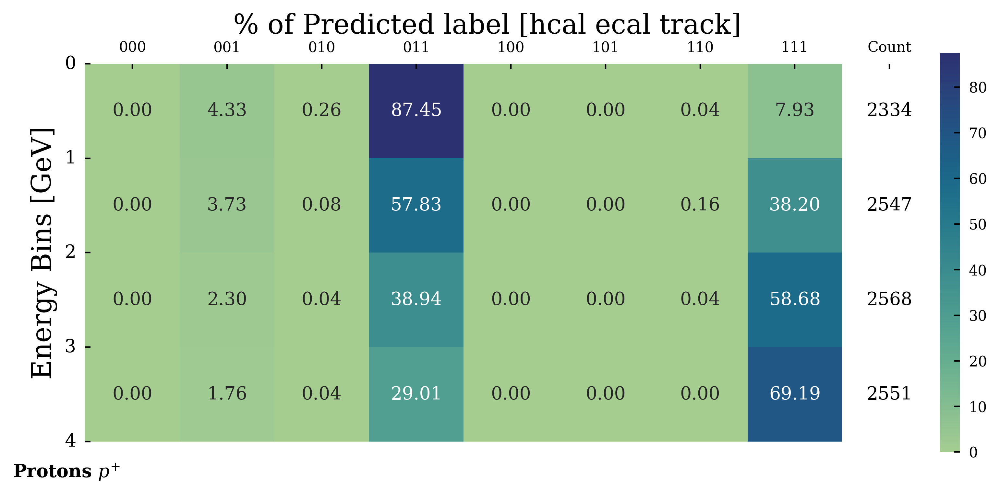

In [75]:
# construct true labels and bin_pids
unique_pred = list(np.vectorize(int_bin)(np.arange(8)))  # unique particle IDs

for part in particles_name_list:  # for each type of particle
    erg_table = np.zeros((len(energy_bins) - 1, len(unique_pred)))  # rows: energy bins, columns: labels

    # get PIDs and cluster energies for the particle
    erg_part = particles_dict[part].get('PFTruth_second_energy')  # lead clust
    exp_pid = np.array([_[0] for _ in particles_dict[part].get('PFCandidates_pid')], dtype=float)  # lead clust

    # for each energy bin
    for i, (erg_min, erg_max) in enumerate(zip(energy_bins[:-1], energy_bins[1:])):  # min and max bins
        # energy mask
        print(f'{part} energy {erg_min} to {erg_max}')
        erg_mask = np.logical_and(erg_part > erg_min, erg_part <= erg_max)
        good_pid = exp_pid.astype(int)[erg_mask]  # convert to integer and apply the mask
        bin_pid = np.vectorize(int_bin)(good_pid) if np.any(good_pid) else 0  # convert to binary

        # tally the counts
        for j, pid in enumerate(unique_pred):
            erg_table[i][j] = np.sum(bin_pid == pid)

    # plot the energy table
    print(erg_table)
    # divide by row
    row_sum = erg_table.sum(axis=1)
    erg_table_perc = (erg_table/np.tile(row_sum, (8, 1)).T)  # with row wise division

    fig, ax = plt.subplots(figsize=(10,4), facecolor=(1, 1, 1, 0))  #This is the size of the image
    ax.patch.set_alpha(0)
    ax = plot_c_matrix(ax, erg_table_perc*100, fmt='.2f',
                       xlabel='% of Predicted label [hcal ecal track]',
                       ylabel='Energy Bins [GeV]',
                       xticks_pos=np.arange(9)+0.5, xticks=np.append(np.vectorize(int_bin)(np.arange(8, dtype=int)), 'Count'),
                       yticks_pos=np.arange(len(energy_bins)), yticks=(energy_bins/1e3).astype(int))
    for k, sum in enumerate(row_sum):
        ax.text(8.5, k+0.5, f'{sum:.0f}', ha='center', va='center')
    ax.annotate(text=labels_dict[part], xy=(-40, -20), ha='left', xycoords='axes points', fontsize=10, weight='bold')